<a href="https://colab.research.google.com/github/nish700/ga-learner-dsmp-repo/blob/master/MahindraFC_Greyatom_Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing the files from google drive

In [2]:
!pip install pydrive

In [0]:
import os
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
download = drive.CreateFile({'id':'1LsVGPo_k0v0E2LQU5Ql6cm7B7KQpVkM1'})
download.GetContentFile('Mahindra_First_Choice_Dataset.zip')

In [7]:
!unzip Mahindra_First_Choice_Dataset.zip

Archive:  Mahindra_First_Choice_Dataset.zip
  inflating: Plant Master.xlsx       
  inflating: Customer_Data.xlsx      
  inflating: Final_invoice.csv       
  inflating: JTD.csv                 


In [0]:
download2 = drive.CreateFile({'id': '1CwJSGzXoscmN7EPJoUnJuVU3vdwe3QmB'})
download2.GetContentFile('mahindra_field_information.zip')

In [9]:
!unzip mahindra_field_information.zip

Archive:  mahindra_field_information.zip
  inflating: Mahindra problem description of the data.docx  
  inflating: Mahindra Field Information.xlsx  


## loading the dataset into pandas

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
customer_data = pd.read_excel('/content/Customer_Data.xlsx')

In [0]:
invoice_data = pd.read_csv('/content/Final_invoice.csv', index_col=False, parse_dates={'Gate_Pass_Date_Time':['Gate Pass Date','Gate Pass Time'],'Invoice_Date_Time':['Invoice Date','Invoice Time'],'Job_Card_Date_Time':['JobCard Date','JobCard Time']}, infer_datetime_format= True)

In [0]:
jtd_data = pd.read_csv('/content/JTD.csv', index_col=0)

In [0]:
plant_data = pd.read_excel('/content/Plant Master.xlsx')

In [0]:
field_info_data = pd.read_excel('/content/Mahindra Field Information.xlsx')

## getting dimensions of the dataset

In [16]:
customer_data.shape

(555338, 9)

In [17]:
customer_data.head()

,Business Partner,Customer No.,Partner Type,Data Origin,Title,Marital Status,Occupation,Date of Birth,Death date
0,31,1,1.0,Z001,NaN,NaN,NaN,NaN,NaT
1,32,2,1.0,Z005,NaN,NaN,NaN,NaN,NaT
2,34,4,1.0,Z005,NaN,2.0,NaN,NaN,NaT
3,35,5,1.0,Z005,NaN,NaN,NaN,NaN,NaT
4,42,7,1.0,Z008,NaN,NaN,NaN,NaN,NaT


In [18]:
invoice_data.shape

(492314, 56)

In [19]:
invoice_data.head()

,Gate_Pass_Date_Time,Invoice_Date_Time,Job_Card_Date_Time,Unnamed: 0,Amt Rcvd From Custom,Amt Rcvd From Ins Co,Area / Locality,CGST(14%),CGST(2.5%),CGST(6%),CGST(9%),CITY,Cash /Cashless Type,Claim No.,Cust Type,Customer No.,District,Expiry Date,IGST(12%),IGST(18%),IGST(28%),IGST(5%),Insurance Company,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,ODN No.,OSL Total,Order Type,Outstanding Amt,Parts Total,Pin code,Plant,Plant Name1,Policy no.,Print Status,Recovrbl Exp,Regn No,SGST/UGST(14%),SGST/UGST(2.5%),SGST/UGST(6%),SGST/UGST(9%),Service Advisor Name,TDS amount,Technician Name,Total Amt Wtd Tax.,Total CGST,Total GST,Total IGST,Total SGST/UGST,Total Value,User ID
0,nan 00:00:00,2015-01-02 11:30:36,2014-12-13 14:29:43,0,0.0,0.0,MAJIWADA,0.0,0.0,0.0,0.0,Thane,NaN,NaN,Retail,67849,Maharashtra,NaN,0.0,0.0,0.0,0.0,NaN,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,7.005200e+09,500.06,Paid Service,0.0,2348.75,400601,BC01,THANE,NaN,NO,0.0,KA19MA1291,0.0,0.0,0.0,0.0,NaN,0.0,RUPESH,4051.95,0.0,0.0,0.0,0.0,4051.95,BC01FS1
1,nan 00:00:00,2015-01-03 10:07:32,2015-01-02 14:12:18,1,0.0,0.0,THNAE,0.0,0.0,0.0,0.0,THNAE,NaN,NaN,Retail,84419,Maharashtra,NaN,0.0,0.0,0.0,0.0,NaN,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,7.005200e+09,0.00,SMC Value Package,0.0,0.00,400603,BC01,THANE,NaN,NO,0.0,MH43R3046,0.0,0.0,0.0,0.0,NaN,0.0,PRASHANT,1001.29,0.0,0.0,0.0,0.0,1001.29,BC01SA2
2,nan 00:00:00,2015-01-03 11:12:57,2015-01-02 11:40:44,2,0.0,0.0,THANE,0.0,0.0,0.0,0.0,THANE[W],NaN,NaN,Retail,81055,Maharashtra,NaN,0.0,0.0,0.0,0.0,NaN,7005200004,173889,33985,180.19,MARUTI SUZUKI,0.00,ZEN,7.005200e+09,0.00,Running Repairs,0.0,52.95,400607,BC01,THANE,NaN,NO,0.0,AP09AX0582,0.0,0.0,0.0,0.0,NaN,0.0,IMRAN,233.14,0.0,0.0,0.0,0.0,233.14,BC01SA2
3,nan 00:00:00,2015-01-03 11:40:44,2015-01-03 10:12:32,3,0.0,0.0,THNAE,0.0,0.0,0.0,0.0,THNAE,NaN,NaN,Retail,84419,Maharashtra,NaN,0.0,0.0,0.0,0.0,NaN,7005200005,174158,78584,0.00,TATA MOTORS,0.00,INDICA,7.005200e+09,0.00,SMC Redemption,0.0,0.00,400603,BC01,THANE,NaN,NO,0.0,MH43R3046,0.0,0.0,0.0,0.0,NaN,0.0,PRASHANT,0.00,0.0,0.0,0.0,0.0,0.00,BC01SA2
4,nan 00:00:00,2015-01-03 12:07:17,2015-01-02 10:45:42,4,0.0,0.0,THANE,0.0,0.0,0.0,0.0,THANE,NaN,NaN,Retail,18980,Maharashtra,NaN,0.0,0.0,0.0,0.0,NaN,7005200006,173860,50057,1202.97,HYUNDAI,100.00,SANTRO XING,7.005200e+09,499.99,Paid Service,0.0,944.16,400603,BC01,THANE,NaN,NO,0.0,MH04CD9768,0.0,0.0,0.0,0.0,NaN,0.0,DAYANAND,2747.12,0.0,0.0,0.0,0.0,2747.12,BC01SA2


In [20]:
jtd_data.shape

(5619484, 9)

In [21]:
jtd_data.head()

,DBM Order,Order Item,Material,Labor Value Number,Description,Item Category,Order Quantity,Target quantity UoM,Net value
0,22385,180,OSLCC_SRV31,NaN,MACHINING RR.SUSPENSION CHARGE (MAJOR),P010,1.2,MIN,1869.87
1,23910,10,1DM279018170117,NaN,ASSY.OIL COOLER (6-PLATE) (VOR,P002,1.0,EA,2151.13
2,23910,40,1IS150203BE01,NaN,FRONT WHEEL BEARING/ LUBRICATE,P002,1.0,EA,2552.92
3,23910,60,1DM279001990173,NaN,ASSY.CYL.HEAD W /O INJ.(NA W /O,P002,1.0,EA,20360.14
4,23910,70,1DM88552790S001SA,NaN,Engine Overhaul Kit -Indica Di,P002,1.0,EA,10691.63


In [22]:
plant_data.shape

(438, 13)

In [23]:
plant_data.head()

,Plant,Name 1,Valuation Area,Customer no. - plant,Vendor number plant,Factory calendar,Name 2,House number and street,PO Box,Postal Code,City,Sales organization,State
0,BC07,NERKUNDRAM,BC07,PLBC07,PLBC07,IN,NaN,"No.117 Poonamallee High Road,",600107.0,600107,Chennai,MFCS,Tamil Nadu
1,BC30,SAS NAGAR - MOHALI,BC30,PLBC30,PLBC30,IN,NaN,"C-118, Phase 07,",160055.0,160055,Mohali,MFCS,Punjab
2,X001,X001 - AUTO PLANET WHEELS,X001,PLX001,NaN,IN,Thane,"Unit No.3, Kothari Compound,",400610.0,400610,Thane,MFCA,Maharashtra
3,X002,X002 - BHANDARI INDUSTRIES PVT,X002,PLX002,NaN,IN,Ghaziabad,"18/1, C Site 4, Sahibabad",201010.0,201010,Ghaziabad,MFCA,Uttar Pradesh
4,X003,X003 - Om Sri Satya Sai Automo,X003,PLX003,NaN,IN,Bengaluru,"#75, Sy.No. 83/2, Panathur Mai",560087.0,560087,Bengaluru,MFCB,Karnataka


In [24]:
field_info_data.shape

(32, 15)

In [25]:
field_info_data.head()

,Partner Type,Unnamed: 1,Unnamed: 2,Data Origin,Unnamed: 4,Unnamed: 5,Unnamed: 6,Title,Unnamed: 8,Unnamed: 9,Marital Status,Unnamed: 11,Unnamed: 12,Occupation,Unnamed: 14
0,Type,Description,NaN,Origin,Description,Short Name,NaN,Key,Title,NaN,Marital Status,Short Name,Occupation,Description,NaN
1,1,Retail,NaN,Z001,Camp - Outdoor,Camp - Outdoor,1.0,Ms.,NaN,1.0,Single,NaN,1,Director,NaN
2,2,Corporate,NaN,Z002,Camp - Workshop,Camp - Workshop,2.0,Mr.,NaN,2.0,Married,NaN,2,Sr. Manager,NaN
3,3,Fleet,NaN,Z003,Emailers,Emailers,NaN,3,Company,3.0,Widowed,NaN,3,Vice President,NaN
4,4,Employee,NaN,Z004,Fleet,Fleet,NaN,4,Mr. and Mrs.,4.0,Divorced,NaN,4,Assistant Vice Presi,NaN


## Preprocessing the dataset

### cleaning the data

In [0]:
# checking null value percentage per column
# any column having null values higher than 60% of the records can be removed from the dataset
def check_null_percentage(data, threshold):
  col = []
  df = data.isna().sum() / data.shape[0]
  for i in range(df.shape[0]):
    if df[i] > threshold:
      col.append(df.index[i])
  return df, col

In [27]:
# null value for customer data
df, col_to_drop = check_null_percentage(customer_data, 0.60)
df

Business Partner    0.000000
Customer No.        0.000000
Partner Type        0.000140
Data Origin         0.000245
Title               0.083385
Marital Status      0.971122
Occupation          0.973785
Date of Birth       0.975791
Death date          0.998806
dtype: float64

In [28]:
customer_data.drop(columns= col_to_drop, axis=1, inplace=True)
customer_data.shape

(555338, 5)

In [29]:
# checking value for Invoice data
df_1, col_to_drop_1 = check_null_percentage(invoice_data,0.8)
df_1

Gate_Pass_Date_Time     0.000000
Invoice_Date_Time       0.000000
Job_Card_Date_Time      0.000000
Unnamed: 0              0.000000
Amt Rcvd From Custom    0.400732
Amt Rcvd From Ins Co    0.400732
Area / Locality         0.048526
CGST(14%)               0.400732
CGST(2.5%)              0.400732
CGST(6%)                0.400732
CGST(9%)                0.400732
CITY                    0.000002
Cash /Cashless Type     0.944304
Claim No.               0.990242
Cust Type               0.000000
Customer No.            0.000000
District                0.000000
Expiry Date             0.954844
IGST(12%)               0.400732
IGST(18%)               0.400732
IGST(28%)               0.400732
IGST(5%)                0.400732
Insurance Company       0.952081
Invoice No              0.000000
Job Card No             0.000000
KMs Reading             0.000000
Labour Total            0.000000
Make                    0.000000
Misc Total              0.000000
Model                   0.003098
ODN No.   

In [0]:
invoice_data.drop(columns= col_to_drop_1, axis =1 , inplace=True)

In [31]:
invoice_data.shape

(492314, 50)

In [32]:
#checking null percentage for jtd data
df_2 , col_to_drop_2 = check_null_percentage(jtd_data, 0.6)
df_2

DBM Order              0.000000
Order Item             0.000000
Material               0.009187
Labor Value Number     0.671598
Description            0.009187
Item Category          0.000000
Order Quantity         0.000000
Target quantity UoM    0.009187
Net value              0.000000
dtype: float64

In [0]:
jtd_data.drop(columns= col_to_drop_2, axis=1, inplace= True)

In [34]:
#checking null percentage for plant data
df_3 , col_to_drop_3 = check_null_percentage(plant_data, 0.6)
df_3

Plant                      0.000000
Name 1                     0.000000
Valuation Area             0.000000
Customer no. - plant       0.000000
Vendor number plant        0.995434
Factory calendar           0.000000
Name 2                     0.004566
House number and street    0.004566
PO Box                     0.002283
Postal Code                0.000000
City                       0.000000
Sales organization         0.011416
State                      0.000000
dtype: float64

In [0]:
plant_data.drop(columns= col_to_drop_3, axis=1 , inplace=True)

## Imputing the null values 

### customer data table

In [36]:
customer_data.head()

,Business Partner,Customer No.,Partner Type,Data Origin,Title
0,31,1,1.0,Z001,NaN
1,32,2,1.0,Z005,NaN
2,34,4,1.0,Z005,NaN
3,35,5,1.0,Z005,NaN
4,42,7,1.0,Z008,NaN


In [0]:
customer_data.dropna(axis=0, how='all',subset=['Partner Type','Data Origin','Title'], inplace=True)

In [38]:
df , col_to_drop = check_null_percentage(customer_data,0.6)
df

Business Partner    0.000000
Customer No.        0.000000
Partner Type        0.000004
Data Origin         0.000108
Title               0.083260
dtype: float64

In [0]:
from sklearn.impute import SimpleImputer

In [0]:
### since the three columns having the null values namely , [Partner Type , Data Origin, Title] are categorical in nature , 
### so we will impute the missing values with mode of the column
imputer_mode = SimpleImputer(missing_values= np.nan, strategy='most_frequent')
imputer_mean = SimpleImputer(missing_values= np.nan , strategy = 'mean')
imputer_median = SimpleImputer(missing_values= np.nan , strategy='median')

In [0]:
customer_data[['Partner Type','Data Origin','Title']] = imputer_mode.fit_transform(customer_data[['Partner Type','Data Origin','Title']])

In [42]:
df_1, col_to_drop = check_null_percentage(customer_data, 0.5)
df_1
# no null values remaining in the customer data table

Business Partner    0.0
Customer No.        0.0
Partner Type        0.0
Data Origin         0.0
Title               0.0
dtype: float64

### Invoice data table

In [43]:
# checking value for Invoice data
df_2, col_to_drop_2 = check_null_percentage(invoice_data,0.8)
df_2

Gate_Pass_Date_Time     0.000000
Invoice_Date_Time       0.000000
Job_Card_Date_Time      0.000000
Unnamed: 0              0.000000
Amt Rcvd From Custom    0.400732
Amt Rcvd From Ins Co    0.400732
Area / Locality         0.048526
CGST(14%)               0.400732
CGST(2.5%)              0.400732
CGST(6%)                0.400732
CGST(9%)                0.400732
CITY                    0.000002
Cust Type               0.000000
Customer No.            0.000000
District                0.000000
IGST(12%)               0.400732
IGST(18%)               0.400732
IGST(28%)               0.400732
IGST(5%)                0.400732
Invoice No              0.000000
Job Card No             0.000000
KMs Reading             0.000000
Labour Total            0.000000
Make                    0.000000
Misc Total              0.000000
Model                   0.003098
ODN No.                 0.400732
OSL Total               0.000000
Order Type              0.000000
Outstanding Amt         0.400732
Parts Tota

In [0]:
invoice_data_1 = invoice_data.drop(columns=['Gate_Pass_Date_Time','Unnamed: 0','Amt Rcvd From Custom','Amt Rcvd From Ins Co','CGST(14%)','CGST(2.5%)', 'CGST(6%)',
'CGST(9%)','IGST(12%)','IGST(18%)','IGST(28%)','IGST(5%)','ODN No.','Outstanding Amt','Print Status','SGST/UGST(14%)',
'SGST/UGST(2.5%)','SGST/UGST(6%)','SGST/UGST(9%)','TDS amount','Total Amt Wtd Tax.', 
'Total CGST','Total GST','Total IGST','Total SGST/UGST','User ID','Area / Locality','Technician Name'], axis=1 )

In [45]:
invoice_data_1.shape

(492314, 22)

In [0]:
## imputing Null values:
# Model - median
# Total Value - mean 

In [0]:
invoice_data_1[['Model']] = imputer_mode.fit_transform(invoice_data_1[['Model']])

In [0]:
invoice_data_1[['Total Value']] = imputer_mean.fit_transform(invoice_data_1[['Total Value']])

In [49]:
invoice_data_1.head()

,Invoice_Date_Time,Job_Card_Date_Time,CITY,Cust Type,Customer No.,District,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Recovrbl Exp,Regn No,Total Value
0,2015-01-02 11:30:36,2014-12-13 14:29:43,Thane,Retail,67849,Maharashtra,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,0.0,KA19MA1291,4051.95
1,2015-01-03 10:07:32,2015-01-02 14:12:18,THNAE,Retail,84419,Maharashtra,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,0.0,MH43R3046,1001.29
2,2015-01-03 11:12:57,2015-01-02 11:40:44,THANE[W],Retail,81055,Maharashtra,7005200004,173889,33985,180.19,MARUTI SUZUKI,0.00,ZEN,0.00,Running Repairs,52.95,400607,BC01,THANE,0.0,AP09AX0582,233.14
3,2015-01-03 11:40:44,2015-01-03 10:12:32,THNAE,Retail,84419,Maharashtra,7005200005,174158,78584,0.00,TATA MOTORS,0.00,INDICA,0.00,SMC Redemption,0.00,400603,BC01,THANE,0.0,MH43R3046,0.00
4,2015-01-03 12:07:17,2015-01-02 10:45:42,THANE,Retail,18980,Maharashtra,7005200006,173860,50057,1202.97,HYUNDAI,100.00,SANTRO XING,499.99,Paid Service,944.16,400603,BC01,THANE,0.0,MH04CD9768,2747.12


In [50]:
# print(invoice_data_1['Gate Pass Time'].value_counts(normalize=True))
print(invoice_data_1['Invoice No'].value_counts(normalize=True))
print(invoice_data_1['Misc Total'].value_counts(normalize=True))
print(invoice_data_1['OSL Total'].value_counts(normalize=True))
print(invoice_data_1['Recovrbl Exp'].value_counts(normalize=True))

7157001869    0.000002
7007203206    0.000002
7000109322    0.000002
7000111371    0.000002
7000097036    0.000002
                ...   
7000095945    0.000002
7000089802    0.000002
7000091851    0.000002
7000085708    0.000002
7152201450    0.000002
Name: Invoice No, Length: 492314, dtype: float64
0.00        0.746985
50.00       0.032355
100.00      0.020647
200.00      0.012626
50.01       0.008960
              ...   
12719.18    0.000002
3179.92     0.000002
1578.04     0.000002
1955.18     0.000002
2150.13     0.000002
Name: Misc Total, Length: 17728, dtype: float64
0.00        0.863461
500.00      0.000886
500.01      0.000784
499.99      0.000778
499.98      0.000743
              ...   
1002.03     0.000002
22039.74    0.000002
392.01      0.000002
11599.88    0.000002
2984.92     0.000002
Name: OSL Total, Length: 29419, dtype: float64
0.00        0.999021
500.00      0.000116
499.99      0.000053
1000.00     0.000041
500.01      0.000035
              ...   
6100.02     0.0

In [0]:
#Removing the below columns to clean the data further
# Gate Pass Time - 91% of the time is 0.00
# Misc Total - more than 74% is 0.00
# OSL Total - more than 86% is 0.00
# Recovrbl Exp - more than 99% is 0.00
# CITY - a lot of junk records

In [0]:
invoice_data_1.drop(columns=['CITY','Misc Total','OSL Total','Recovrbl Exp'], axis=1, inplace=True)

In [0]:
## Feature Engineering: add a column CITY by copying the records from Plant Name1

In [0]:
invoice_data_1['CITY'] = invoice_data_1['Plant Name1']

In [0]:
# dropping some records to clean
invoice_data_1[invoice_data_1['CITY']=='X359 - STAR AUTOMOBILES'].index
invoice_data_1[invoice_data_1['CITY']=='X206 - SHRI SAI SHAKTI SERVICE'].index 
invoice_data_1.drop(axis=0, index = invoice_data_1[invoice_data_1['CITY']=='X359 - STAR AUTOMOBILES'].index, inplace=True)
invoice_data_1.drop(axis=0, index = invoice_data_1[invoice_data_1['CITY']=='X206 - SHRI SAI SHAKTI SERVICE'].index, inplace=True)

In [0]:
# cleaning the data in the CITY column by replacing some of the records with correct city names

#Assam

invoice_data_1['CITY'].replace(to_replace=['X320 - BARUAH AUTOMOBILE CENTR'], value='GUWAHATI', inplace= True)#X154 - G.K.CAR ZONE

#kerala
invoice_data_1['CITY'].replace(to_replace=['X128 - SRI LAKSHMI AUTOMOBILES'], value='THIRUVARUR', inplace= True)#X154 - G.K.CAR ZONE
invoice_data_1['CITY'].replace(to_replace=['X154 - G.K.CAR ZONE'], value='THIRUVALLUR', inplace= True)# X105 - MSK CARS
invoice_data_1['CITY'].replace(to_replace=['X105 - MSK CARS'], value='ERODE', inplace= True)# 

#Others
invoice_data_1['CITY'].replace(to_replace=['X229 - OM MOTORS'], value='BULDHANA', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X204 - SREEDEVI AUTOMOTIVE SER'], value='KAKINADA', inplace= True)# 

invoice_data_1['CITY'].replace(to_replace=['X267 - VISHWAKARMA AUTOMOBILE'], value='NAGDA', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X138 - HIM AUTOS'], value='KULLU', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X186 - AISHWARYA MOTORS'], value='GULBARGA', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X192 - POKATTIL MOTORS'], value='MALAPPURAM', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X140 - SRI RAJARAJESHWARI SERV'], value='HUBLI', inplace= True)# 

invoice_data_1['CITY'].replace(to_replace=['X032 - SBBS MOTORS'], value='DHARMAPURI', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X023 - ROYAL KRR AUTOS'], value='TIRUPUR', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X072 - PRABHAV PREMIUM AUTOMOB'], value='ABOHAR', inplace= True)# X045 - BA MOTORS
invoice_data_1['CITY'].replace(to_replace=['X045 - BA MOTORS'], value='ROHTAK', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X033 - TRISTAR INDIA TRADING'], value='SHIMOGA', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X085 - SRI MOTORS'], value='CHENGALPET', inplace= True)#chengalpet


invoice_data_1['CITY'].replace(to_replace=['X055 - S K AUTOMOBILES'], value='RAJAHMUNDRY', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X081 - GEO MOTORS'], value='KOTTAYAM', inplace= True)#X057 - RANGANATHA SWAMY MOTORS
invoice_data_1['CITY'].replace(to_replace=['X068 - VAKA CARS'], value='TIRUPATHI', inplace= True)#X048 - HARI KRISHNA AUTOMOBILE
invoice_data_1['CITY'].replace(to_replace=['X057 - RANGANATHA SWAMY MOTORS'], value='HASSAN', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X048 - HARI KRISHNA AUTOMOBILE'], value='NAGERCOIL', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X082 - A&P MOTORS'], value='KHAMMAM', inplace= True)

invoice_data_1['CITY'].replace(to_replace=['X062 - S N S MOTORS MYSORE'], value='MYSORE', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X047 - X-PRESS MOTORS'], value='TIRUNELVELI', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X063 - CHAKARAVARTHY AUTOMOTIV'], value='ANANTAPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X102 - WEST COAST AUTOMOTIVE','X113 - S G AUTOMOTIVES'], value='MANGALORE', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X124 - ZEF MOTORS'], value='ERNAKULAM', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X056 - SRI RAJABABU AUTOMOTIVE'], value='VIJAYAWADA', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X066 - REVATHI SERVICE CENTRE'], value='PALANI', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X044 - KANMANI CAR CARE'], value='DINDIGUL', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X079 -  SHREE R V CAR CARE'], value='KOLAR', inplace= True)#


#Guj  
invoice_data_1['CITY'].replace(to_replace=['X327 - B.H.MOTORS PRIVATE LIMI','X350 - B.H.MOTORS PRIVATE LIMI'], value='VADODARA', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X347 - HONEST MOTORS'], value='TAPI', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X401 - SAI AUTO SERVICES'], value='VAPI', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X329 - SMILE NEW'], value='KALOL', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X397 -  DHARTI AUTO'], value='NADIAD', inplace= True)# X140 - SRI RAJARAJESHWARI SERV

#JH 
invoice_data_1['CITY'].replace(to_replace=['X308 - SHRI RAM CAR SERVICES'], value='DHANBAD', inplace= True)#

#Bihar 
invoice_data_1['CITY'].replace(to_replace=['X188 - SONA AUTOMOBILES'], value='SAMASTIPUR', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X112 - PATNA WHEELS POINT','X252 - DINASARASWATI ENTERPRIE','X122 - S & B AUTOMOBILE'], value='PATNA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X139 - INDRADHANUSH AUTOMOBILE'], value='ROHTAS', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X418 - BHARDWAJ ENGICON LTD'], value='MUZAFFARPUR', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X286 - M/S MAHALAKSHMI MOTORS'], value='GAYA', inplace= True)#



#UK X432 - HARSH AUTOMOBILES
invoice_data_1['CITY'].replace(to_replace=['X243 - JINDAL AUTOMOBILES','X242 - LAXMI AUTOMOBILES'], value='NAINITAL', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X241 - SHRI KRISHNA AUTOMOTIVE','X432 - HARSH AUTOMOBILES'], value='KASHIPUR', inplace= True)# X140 - SRI RAJARAJESHWARI SERV

# Kolkata  
invoice_data_1['CITY'].replace(to_replace=['X245 - ABHI FUEL CENTER', 'X269 - VENUS MOTORS SERVICES'], value='KOLKATA', inplace= True)# X140 - SRI RAJARAJESHWARI SERV
invoice_data_1['CITY'].replace(to_replace=['X270 - MONDAL MOTORS'], value='BERHAMPORE', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X364 - JUST DRIVE'], value='ROURKELA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X277 - BRISTI AUTOMOBILES'], value='JALPAIGURI', inplace= True)#

# HP
invoice_data_1['CITY'].replace(to_replace=['X098 - KAPOOR MOTORS'], value='UNA', inplace= True)#X055 - S K AUTOMOBILES

#MH 

invoice_data_1['CITY'].replace(to_replace=['X089 - AKOLA NATIONAL GARAGE'], value='AKOLA', inplace= True)# 

invoice_data_1['CITY'].replace(to_replace=['X107 - DIXIT MOTORS'], value='WARDHA', inplace= True)# 

invoice_data_1['CITY'].replace(to_replace=['X297 - WAI AUTO WORLD LLP'], value='SATARA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X135 - S P JIRAPURE MOTORS'], value='YAVATMAL', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['NASHIK','Nashik','NASIK','X099 - AUTO WORLD CAR CARE','X050 - VISHWATMAK AUTOMOBILES',
                                           'X218 - PRAGATI MOTORS','X073- KRITI AUTOMOBILE REPAIR','X444 - SAI AUTO SERVICE',
                                           'X196 -  BHATTAD AUTO SERVICES'], value='NASHIK', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X149 - SARVADNYA AUTO CARE LAT','X253 - GURUPRABHA AUTOWHEELS'], value='LATUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['HADAPSAR - PUNE','HINJAWADI – PUNE','PIMPRI - PUNE','PUNE','X016 - KHUTWAD MOTORS','X018 - EXPRESS WHEELS AUTO SER','X026 - MAHADEVI SERVICE CENTER','X027 - RAHUL AUTO SERV. PVT.','X035 - DOCTOR CARS','X101 - ARIHANT AUTO','X027-RAHUL AUTO SERV. PVT. LTD','X146 - RUGRUT MOTORS',
                                           'X173 - TRIMURTI AUTOMOBILES','X437 - RAHUL AUTO SERVICES PVT','pune'], value='PUNE', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X217 - SHEETAL AUTO SERVICES'], value='MALEGAON', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X028 - SAIDEEP CAR CARE','X074 - VISHWA MOTORS','X183 - MANALI AUTO WORLD'], value='AHMEDANGAR', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['THANE','X006 - A.M.MOTORS','X001 - AUTO PLANET WHEELS'], value='THANE', inplace= True) #SAS NAGAR - MOHALI
invoice_data_1['CITY'].replace(to_replace=['NERUL - NAVI MUMBAI'], value='NAVI MUMBAI', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X017 - HEM KIRAN DIESELS'], value='KOLHAPUR', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['NAGPUR','X080 - KHAMLA MOTORS','nagpur'], value='NAGPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X034 - SOHAMM MOTORS','X187 - MOTIWALA SERVICES'], value='AURANGABAD', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X054 - HOREB AUTOMOBILES'], value='ONGOLE', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['ANDHERI'], value='MUMBAI', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X238 - BASAVDEEP MOTORS'], value='SOLAPUR', inplace= True)#

# RJ 
invoice_data_1['CITY'].replace(to_replace=['X328 - PRAMUKH AUTO'], value='MEHSANA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X172 - MARRCO MACHINERIES'], value='KOTA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X103 - DAYAL MOTORS','X136 - SUNRISE AUTO CARE','X341 - KUMAWAT DIESEL SERVICE',
                                           'X366 -  R S AUTOMOBILES','X177 - MAHAMAYA MOTORS'], value='JAIPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X334 - TOP AUTOMOBILES'], value='CHITTORGARH', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X281 - EVERGREEN CAR CARE'], value='SUJANGARH', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X170 - S K  AUTOMOBILES','X317 - DAILA MOTORS'], value='JHUNJHUNU', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X265 - SHUBHAM MOTORS'], value='BARMER', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X167 - MANAK AUTO WORLD','X167 - MANAK MOTORS P LTD'], value='JODHPUR', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X171 - SRI OM MOTORS'], value='BIKANER', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X164 - EQRA AUTO','X185 - GUPTA CAR CARE','X285 - SWAMI NARAYAN AUTOMOBIL'], value='UDAIPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X095 - NATIONAL AUTOMOBILE','X244 - SHYAM MOTORS'], value='SIKAR', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X316 - K & S AUTO'], value='ALWAR', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X169 - DREAMWORKS AUTOMOTIVE'], value='AJMER', inplace= True)#


# UP 
invoice_data_1['CITY'].replace(to_replace=['X053 - PREM AUTOMOBILES'], value='BAGHPAT', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X076 - CAR X CARE'], value='FIROZABAD', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X201 - ADITYA AUTO WORLD'], value='SHAMLI', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X132 - KATIYAR MANGALAM AUTOMO'], value='FARRUKHABAD', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X126 - M.P AUTO VEHICLES PVT.','X357 - RAJ AUTOMOBILES'], value='VARANASI', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X413 - SARVAJEET MOTORS'], value='BALLIA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X205 - ABHINANDAN AUTOMOBILES'], value='AMROHA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X224 - ADITYA AUTO','X211 -  M/S KAMAL MOTORS'], value='ALIGARH', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X041 - VARDAJYOTI AUTOMOBILES','X380 - A2Z AUTOWORLD'], value='MEERUT', inplace= True)#X049 - SHENBAGAM MOTORS
invoice_data_1['CITY'].replace(to_replace=['MOHAN NAGAR - GAZIABAD'], value='GHAZIABAD', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['GREATER NOIDA'], value='GREATER NOIDA', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['NOIDA - 63','NOIDA - 05'], value='NOIDA', inplace= True) #THANE

invoice_data_1['CITY'].replace(to_replace=['X209 - UMA AUTOMOBILES'], value='JHANSI', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X214 - M/S J.P. AUTOMOBILES'], value='SHAHJAHANPUR', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X131 - LEELA AUTOMOBILE'], value='BAHRAICH', inplace= True)# 
invoice_data_1['CITY'].replace(to_replace=['X403 -  S V MOTORS'], value='KANPUR', inplace= True)#



# MP 
invoice_data_1['CITY'].replace(to_replace=['X219 - JPG CAR CARE'], value='SATNA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X155 - AVEER AUTO SPARES AND S'], value='CHHATARPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X092 - EXCEL AUTO CORP. PVT. L','X091 - HARIKRIPA ENTERPRISES','X435 - PAHWA AUTOMOTIVE'], value='INDORE', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X118 - SURBHI GLOBAL PVT. LTD','X166 - ANAND AUTOMOTIVE'], value='GWALIOR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X127 - MY SUPREME'], value='NEEMUCH', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X114 - A J MOTORWORKS','X125 - SHRI WARDHMAN MOTO CORP'], value='BHOPAL', inplace= True)#

# Orissa   
invoice_data_1['CITY'].replace(to_replace=['X259 - ROUNAK MOTORS'], value='BHUBANESWAR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X247 - SATTVIK MOTORS'], value='PARADIP', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X322 - SINGH BROTHERS AUTOMOBI'], value='JHARSUGUDA', inplace= True)#

invoice_data_1['CITY'].replace(to_replace=['X246 - SHIVA JYOTI MOTORS'], value='TALCHER', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X339 - OSL AUTOCAR PRIVATE LIM'], value='SAMBALPUR', inplace= True)#


# KA 
invoice_data_1['CITY'].replace(to_replace=['BELLANDUR - BANGALORE','BELLANDUR - BANGALORE','YESHWANTPUR - BANGALORE','X007 - OM SRI SATYA SAI AUTOMO','X003 - Om Sri Satya Sai Automo',
                                           'X190 - NITHIYA MOTORS'], value='BANGALORE', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X121 - MANICK ENTERPRISES'], value='BELGAUM', inplace= True)#

#TN 
invoice_data_1['CITY'].replace(to_replace=['COIMBATORE','X020 - SURYABALA SERVICE','X031 - ANUSHRI MOTORS','X051 - RAJATHI AUTO CARE PRIVA',
                                           'X110 - KALYAN SERVICES','X331 - NEXSTEP AUTO CARE',
                                           'X324 -  NANDHA MOTORS'], value='COIMBATORE', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X249 - AMBUJA\'S AUTOMOTIVES'], value='NAMAKKAL', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['AMBATTUR - CHENNAI','GUINDY','X005 - KLN MOTORS', 'NERKUNDRAM','X039 - SAI AUTOMOBILES',
                                           'X109 - NANGAN MOTORS PVT. LTD','X405 - NANGAN MOTORS PVT. LTD.',
                                           'X133 - SRI BALAJI MOTORS'], value='CHENNAI', inplace=True)
invoice_data_1['CITY'].replace(to_replace=['X180 - RAMSUN ADVANTAGE'], value='PUDUKKOTTAI', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X384 - KOORI MOTORS'], value='RAMANATHAPURAM', inplace= True)#

#Kerala  
invoice_data_1['CITY'].replace(to_replace=['X254 - MOTOCARE'], value='KARUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X332 - KAINIKKARA MOTORS'], value='KOTTAYAM', inplace= True)#

# Punjab 
invoice_data_1['CITY'].replace(to_replace=['X264 - RAJINDERA MOTORS'], value='PATIALA', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['PANCHKULLA','X029 - SWAMI AUTO CARE PVT LTD','X129 - A.V. AUTOMOBILES',
                                           'X392 - AUTOMOBIA INDIA'], value='PANCHKULLA', inplace= True)#PANCHKULLA

# Telangana
invoice_data_1['CITY'].replace(to_replace=['X386 - VINAYAKA MOTORS'], value='NIZAMABAD', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X083 - EXCELLENT SERVICE'], value='SURYAPET', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['MADEENAGUDA','MADEENAGUDA','HYDERABAD L B NAGAR','X175 - SPYNS AUTO',
                                           'X174 - ANKITHA MOTORS','BALANAGAR','hyderabad'], value='HYDERABAD', inplace=True)



# HR 
invoice_data_1['CITY'].replace(to_replace=['X261 - SHREE MOTORS'], value='MAHENDRAGARH', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X260 - YAGNIK MOTORS'], value='SAWAI MADHOPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X046 - SVERA AUTOMOBILES'], value='JHAJJAR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['FARIDABAD 1','faridabad'], value='FARIDABAD', inplace= True)

invoice_data_1['CITY'].replace(to_replace=['X161 - ADVANCE AUTO SERVICES'], value='CHANDIGARH', inplace= True)


#AP  
invoice_data_1['CITY'].replace(to_replace=['X203 - B.M.M AUTOMOBILE SERVIC'], value='PRODDATUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X458 - SAIRAM AUTOMOBILES'], value='NELLORE', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X202 - BHARATH MOTORS'], value='GUNTUR', inplace= True)#


# CG 
invoice_data_1['CITY'].replace(to_replace=['X199 - RUDRA AUTOCARE'], value='AMBIKAPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X086 - STRIKER AUTOMOBLIES'], value='BILASPUR', inplace= True)# 

invoice_data_1['CITY'].replace(to_replace=['X119 - Vivek Services'], value='BUXAR', inplace= True)# 



#north
invoice_data_1['CITY'].replace(to_replace=['X058 - ASR AUTOMOBILES'], value='SONEPAT', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X061 - APS MOTORCARE PVT LTD'], value='RISHIKESH', inplace= True)#X042 - CAR PLANET ENTERPRISES
invoice_data_1['CITY'].replace(to_replace=['X064 - SHIVAM ENTERPRISES'], value='HISSAR', inplace= True)#X075 - FUTUREVISION INNOVATION
invoice_data_1['CITY'].replace(to_replace=['X075 - FUTUREVISION INNOVATION'], value='AGRA', inplace= True)#X062 - S N S MOTORS MYSORE
invoice_data_1['CITY'].replace(to_replace=['X042 - CAR PLANET ENTERPRISES'], value='RAIPUR', inplace= True)#X033 - TRISTAR INDIA TRADING


#MP
invoice_data_1['CITY'].replace(to_replace=['X106 - TRS MOTORS'], value='DEWAS', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X156 - MANGLAM AUTOMOBILES'], value='RATLAM', inplace= True)#

#Bihar
invoice_data_1['CITY'].replace(to_replace=['X123 - WHEELOCITY CAR SERVICES'], value='BHAGALPUR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X215 - VINAY AUTO SERVICES'], value='BEGUSARAI', inplace= True)# 

#UK
invoice_data_1['CITY'].replace(to_replace=['X233 - SINGHAL AUTOMOBILES'], value='RUDRAPUR', inplace= True)#X111 - RUDRA MOTORS 

#GUJ
invoice_data_1['CITY'].replace(to_replace=['X279 - J B CAR CARE'], value='SURAT', inplace= True)# 

#Others

invoice_data_1['CITY'].replace(to_replace=['X111 - RUDRA MOTORS'], value='AMRITSAR', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X147 - SPECTRUM AUTOMOTIVES'], value='HOSPET', inplace= True)#
invoice_data_1['CITY'].replace(to_replace=['X084 - RM AUTOMOTIVE SERVICES'], value='VIJAYPURA', inplace= True)#

#South
invoice_data_1['CITY'].replace(to_replace=['NELLORE'], value='NELLORE', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['EDAPPALLY - KOCHI'], value='KOCHI', inplace= True) #NOIDA - 63
invoice_data_1['CITY'].replace(to_replace=['X036 - X-PRESS MOTORS','X052 - XPRESS MOTORS'], value='MADURAI', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X037 - DHEERAJ MOTORS'], value='KURNOOL', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X024 - ARASU CAR ACC (TRICHY)'], value='TRICHY', inplace= True)#X012 - SR CAR CARE
invoice_data_1['CITY'].replace(to_replace=['X012 - SR CAR CARE'], value='CHIDAMBARAM', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X022 - ARASU CAR ACCESSORIES'], value='THANJAVUR', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X010 - LVM MOTORS'], value='VELLORE', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X014 - NANGAN MOTORS PVT LTD.'], value='AMBUR', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X013 - SAI AUTO WORKS'], value='NEYVELI', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X008- AAKASH AUTO (Puducherry)'], value='PUDUCHERRY', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X011- AAKASH AUTO (Villupuram)'], value='VILLUPURAM', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X021 - THE TRUE SAI MOTORSS'], value='SALEM', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['X049 - SHENBAGAM MOTORS'], value='TUTICORIN', inplace= True)#X054 - HOREB AUTOMOBILES

#North

#East

#Punjab
invoice_data_1['CITY'].replace(to_replace=['SAS NAGAR - MOHALI'], value='MOHALI', inplace= True) #X025 - SHIVALIK AUTOMOBILES
invoice_data_1['CITY'].replace(to_replace=['X025 - SHIVALIK AUTOMOBILES'], value='MOGA', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['GILL ROAD - LUDHIANA','GT ROAD - LUDHIANA'], value='LUDHIANA', inplace= True)#GILL ROAD - LUDHIANA #NOIDA - 05

#Guj
invoice_data_1['CITY'].replace(to_replace=['SURAT UDHANA'], value='SURAT', inplace= True)
invoice_data_1['CITY'].replace(to_replace=['VAPI'], value='VAPI', inplace= True)

#MP
invoice_data_1['CITY'].replace(to_replace=['X060 - SHIVANSH AUTOMOTIVE'], value='CHHINDWARA', inplace= True)


In [0]:
#drop null values from Registration Number column as these would be difficult to impute
invoice_data_1.dropna(axis=0,subset=['Regn No'], inplace=True)

In [58]:
# checking value for Invoice data
df_2, col_to_drop_2 = check_null_percentage(invoice_data_1,0.8)
df_2

Invoice_Date_Time     0.0
Job_Card_Date_Time    0.0
Cust Type             0.0
Customer No.          0.0
District              0.0
Invoice No            0.0
Job Card No           0.0
KMs Reading           0.0
Labour Total          0.0
Make                  0.0
Model                 0.0
Order Type            0.0
Parts Total           0.0
Pin code              0.0
Plant                 0.0
Plant Name1           0.0
Regn No               0.0
Total Value           0.0
CITY                  0.0
dtype: float64

In [0]:
# we'll be treating Invoice Time as the final time for the completion of the work
# job car date and time is the time at which the inspection of the vehicle is done by the incharge and work assigned to the staff.
#  Invoice time is the time of final payment made by the customer in leiu of the services taken
# Gate pass date and time is the date/time at which the car leaves the Workshop
# Usually , The gate pass date/time are similar to Invoice date/time , as while making the payment , the documents are prepared.
# since the Gate Pass time has a lot of default(0) values, so we'll consider Invoice Date/Time as equivalent to Gate Pass date/time  
# and create a new column calculating the time taken by the Workshop to complete the work - 
invoice_data_1['Time Taken'] =  invoice_data_1['Invoice_Date_Time'] - invoice_data_1['Job_Card_Date_Time']

In [0]:
# the district column has name of state , so will change the column name to State
invoice_data_1.rename(columns={'District':'State'}, inplace=True)

In [61]:
invoice_data_1.head()

,Invoice_Date_Time,Job_Card_Date_Time,Cust Type,Customer No.,State,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Model,Order Type,Parts Total,Pin code,Plant,Plant Name1,Regn No,Total Value,CITY,Time Taken
0,2015-01-02 11:30:36,2014-12-13 14:29:43,Retail,67849,Maharashtra,7005200002,168303,49317,1203.14,GENERAL MOTORS,SPARK,Paid Service,2348.75,400601,BC01,THANE,KA19MA1291,4051.95,THANE,19 days 21:00:53
1,2015-01-03 10:07:32,2015-01-02 14:12:18,Retail,84419,Maharashtra,7005200003,173997,78584,804.26,TATA MOTORS,INDICA,SMC Value Package,0.00,400603,BC01,THANE,MH43R3046,1001.29,THANE,0 days 19:55:14
2,2015-01-03 11:12:57,2015-01-02 11:40:44,Retail,81055,Maharashtra,7005200004,173889,33985,180.19,MARUTI SUZUKI,ZEN,Running Repairs,52.95,400607,BC01,THANE,AP09AX0582,233.14,THANE,0 days 23:32:13
3,2015-01-03 11:40:44,2015-01-03 10:12:32,Retail,84419,Maharashtra,7005200005,174158,78584,0.00,TATA MOTORS,INDICA,SMC Redemption,0.00,400603,BC01,THANE,MH43R3046,0.00,THANE,0 days 01:28:12
4,2015-01-03 12:07:17,2015-01-02 10:45:42,Retail,18980,Maharashtra,7005200006,173860,50057,1202.97,HYUNDAI,SANTRO XING,Paid Service,944.16,400603,BC01,THANE,MH04CD9768,2747.12,THANE,1 days 01:21:35


In [0]:
## cleaning of the invoice data column is done

### JTD (Parts) Data

In [63]:
jtd_data.shape

(5619484, 8)

In [64]:
df_2 , col_to_drop_2 = check_null_percentage(jtd_data, 0.6)
df_2

DBM Order              0.000000
Order Item             0.000000
Material               0.009187
Description            0.009187
Item Category          0.000000
Order Quantity         0.000000
Target quantity UoM    0.009187
Net value              0.000000
dtype: float64

In [0]:
# dropping null values from the rows
jtd_data.dropna(axis=0,how='all',subset=['Material','Description','Target quantity UoM'], inplace=True)

In [66]:
df_2 , col_to_drop_2 = check_null_percentage(jtd_data, 0.6)
df_2

DBM Order              0.0
Order Item             0.0
Material               0.0
Description            0.0
Item Category          0.0
Order Quantity         0.0
Target quantity UoM    0.0
Net value              0.0
dtype: float64

In [0]:
## jtd data table is also cleaned up

In [68]:
jtd_data.head()

,DBM Order,Order Item,Material,Description,Item Category,Order Quantity,Target quantity UoM,Net value
0,22385,180,OSLCC_SRV31,MACHINING RR.SUSPENSION CHARGE (MAJOR),P010,1.2,MIN,1869.87
1,23910,10,1DM279018170117,ASSY.OIL COOLER (6-PLATE) (VOR,P002,1.0,EA,2151.13
2,23910,40,1IS150203BE01,FRONT WHEEL BEARING/ LUBRICATE,P002,1.0,EA,2552.92
3,23910,60,1DM279001990173,ASSY.CYL.HEAD W /O INJ.(NA W /O,P002,1.0,EA,20360.14
4,23910,70,1DM88552790S001SA,Engine Overhaul Kit -Indica Di,P002,1.0,EA,10691.63


## getting statistical analysis of the dataset

In [69]:
customer_data.describe(include='all')

,Business Partner,Customer No.,Partner Type,Data Origin,Title
count,555262,555262,555262.000000,555262,555262.000000
unique,555262,555262,NaN,22,NaN
top,E25639,E25639,NaN,Z005,NaN
freq,1,1,NaN,149921,NaN
mean,NaN,NaN,2.864795,NaN,1.954798
std,NaN,NaN,129.522641,NaN,0.207747
min,NaN,NaN,1.000000,NaN,1.000000
25%,NaN,NaN,1.000000,NaN,2.000000
50%,NaN,NaN,1.000000,NaN,2.000000
75%,NaN,NaN,1.000000,NaN,2.000000


In [70]:
invoice_data_1.describe(include='all')

,Invoice_Date_Time,Job_Card_Date_Time,Cust Type,Customer No.,State,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Model,Order Type,Parts Total,Pin code,Plant,Plant Name1,Regn No,Total Value,CITY,Time Taken
count,492291,492291,492291,492291,492291,4.922910e+05,492291.000000,4.922910e+05,492291.000000,492291,492291,492291,492291.000000,492291.000000,492291,492291,492291,492291.000000,492291,492291
unique,488032,485739,7,253473,36,NaN,NaN,NaN,NaN,28,245,9,NaN,NaN,240,242,260317,NaN,162,NaN
top,2015-09-30 18:30:26,2016-07-14 18:07:59,Retail,E4981,Maharashtra,NaN,NaN,NaN,NaN,MARUTI SUZUKI,SWIFT,Running Repairs,NaN,NaN,BC03,NASHIK,RJ14CE9887,NaN,CHENNAI,NaN
freq,5,6,488972,2668,128115,NaN,NaN,NaN,NaN,147098,33422,269442,NaN,NaN,28615,28615,56,NaN,40775,NaN
first,2012-04-02 17:04:33,2012-04-01 16:14:12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2016-10-31 22:53:06,2016-10-31 21:58:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,7.083828e+09,249405.131542,7.757833e+04,1353.677189,NaN,NaN,NaN,2436.689750,445348.637493,NaN,NaN,NaN,4418.184962,NaN,3 days 11:25:32.110105
std,NaN,NaN,NaN,NaN,NaN,8.181513e+07,143505.617617,1.168905e+05,3733.479771,NaN,NaN,NaN,7919.134782,166688.322739,NaN,NaN,NaN,8023.700923,NaN,11 days 16:16:36.809738
min,NaN,NaN,NaN,NaN,NaN,7.000000e+09,4.000000,1.000000e+00,-137.000000,NaN,NaN,NaN,-0.010000,0.000000,NaN,NaN,NaN,0.000000,NaN,-1 days +23:59:27
25%,NaN,NaN,NaN,NaN,NaN,7.000125e+09,125628.500000,3.409700e+04,0.850000,NaN,NaN,NaN,0.000000,396195.000000,NaN,NaN,NaN,1000.380000,NaN,0 days 02:44:00


In [71]:
jtd_data.describe(include='all')

,DBM Order,Order Item,Material,Description,Item Category,Order Quantity,Target quantity UoM,Net value
count,5.567855e+06,5.567855e+06,5567855,5567855,5567855,5.567855e+06,5567855,5.567855e+06
unique,NaN,NaN,126567,58558,4,NaN,4,NaN
top,NaN,NaN,MARUTISUZUKI_SRV,MISC_OTHER CHARGES,P002,NaN,EA,NaN
freq,NaN,NaN,292232,270563,3250293,NaN,2745660,NaN
mean,4.618588e+05,9.591947e+01,NaN,NaN,NaN,5.366442e+01,NaN,7.488541e+02
std,2.924017e+05,1.435706e+02,NaN,NaN,NaN,4.120850e+02,NaN,2.085961e+03
min,4.000000e+00,1.000000e+01,NaN,NaN,NaN,0.000000e+00,NaN,-1.572816e+04
25%,1.981045e+05,2.000000e+01,NaN,NaN,NaN,1.000000e+00,NaN,8.446000e+01
50%,4.448590e+05,5.000000e+01,NaN,NaN,NaN,1.000000e+00,NaN,2.773200e+02
75%,7.150670e+05,1.100000e+02,NaN,NaN,NaN,4.000000e+00,NaN,7.423600e+02


In [72]:
plant_data.describe(include='all')

,Plant,Name 1,Valuation Area,Customer no. - plant,Factory calendar,Name 2,House number and street,PO Box,Postal Code,City,Sales organization,State
count,438,438,438,438,438,436,436,437.000000,438.000000,438,433,438
unique,438,438,438,438,1,360,435,NaN,NaN,356,5,27
top,X321,X500 - KARTHIKEYA AUTOMOTIVES,X321,PLX381,IN,Chennai,"Plot No. 525,",NaN,NaN,Kolkata,MFCD,Rajasthan
freq,1,1,1,1,438,7,2,NaN,NaN,6,339,52
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,465304.276888,469101.835616,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206603.346008,207677.347020,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,121006.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,305404.000000,306101.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,454001.000000,454887.500000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,610001.000000,612879.000000,NaN,NaN,NaN


## Analysing the data and getting Insights

###Invoice Data

In [73]:
invoice_data_1.head()

,Invoice_Date_Time,Job_Card_Date_Time,Cust Type,Customer No.,State,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Model,Order Type,Parts Total,Pin code,Plant,Plant Name1,Regn No,Total Value,CITY,Time Taken
0,2015-01-02 11:30:36,2014-12-13 14:29:43,Retail,67849,Maharashtra,7005200002,168303,49317,1203.14,GENERAL MOTORS,SPARK,Paid Service,2348.75,400601,BC01,THANE,KA19MA1291,4051.95,THANE,19 days 21:00:53
1,2015-01-03 10:07:32,2015-01-02 14:12:18,Retail,84419,Maharashtra,7005200003,173997,78584,804.26,TATA MOTORS,INDICA,SMC Value Package,0.00,400603,BC01,THANE,MH43R3046,1001.29,THANE,0 days 19:55:14
2,2015-01-03 11:12:57,2015-01-02 11:40:44,Retail,81055,Maharashtra,7005200004,173889,33985,180.19,MARUTI SUZUKI,ZEN,Running Repairs,52.95,400607,BC01,THANE,AP09AX0582,233.14,THANE,0 days 23:32:13
3,2015-01-03 11:40:44,2015-01-03 10:12:32,Retail,84419,Maharashtra,7005200005,174158,78584,0.00,TATA MOTORS,INDICA,SMC Redemption,0.00,400603,BC01,THANE,MH43R3046,0.00,THANE,0 days 01:28:12
4,2015-01-03 12:07:17,2015-01-02 10:45:42,Retail,18980,Maharashtra,7005200006,173860,50057,1202.97,HYUNDAI,SANTRO XING,Paid Service,944.16,400603,BC01,THANE,MH04CD9768,2747.12,THANE,1 days 01:21:35


#### Demographic distribution of vehicles

In [0]:
# Which Area have most cars?

#### Count Of Unique Vehicle (National and Local pattern)

Text(0.5, 1.0, 'Unique Vehicles Count for different states')

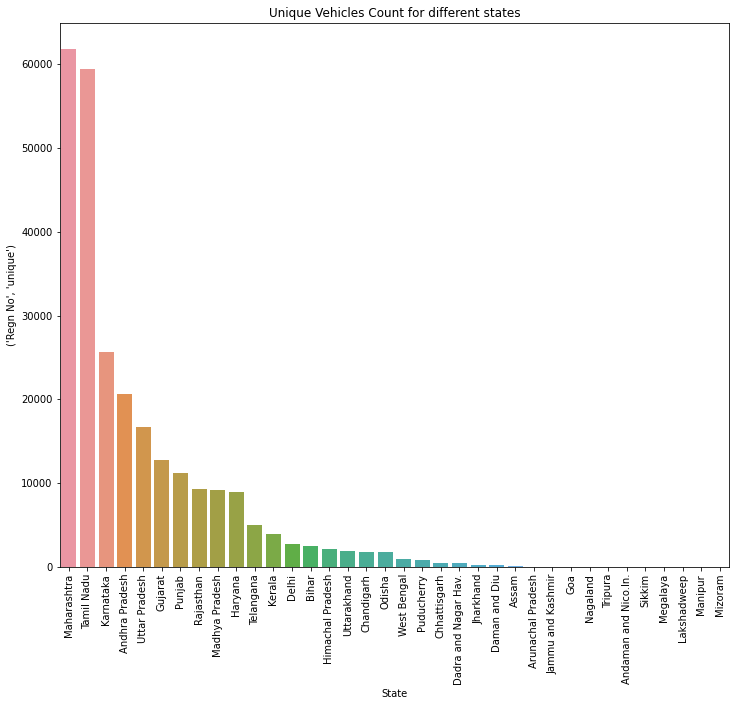

In [75]:
#most cars by state , by finding the number of unique registrations per state

new_df_state = invoice_data_1[['Regn No', 'State']]
des_df_state = new_df_state.groupby(['State']).describe()
des_df_state.sort_values(by=('Regn No', 'unique'),axis=0, ascending=False, inplace=True)

plt.figure(figsize=(12,10))
chart = sns.barplot(x= des_df_state.index, y = ('Regn No', 'unique'), data = des_df_state )
chart.set_xticklabels(chart.get_xticklabels(),rotation=90)
plt.title('Unique Vehicles Count for different states')

Text(0.5, 1.0, 'Unique Vehicle count for different cities')

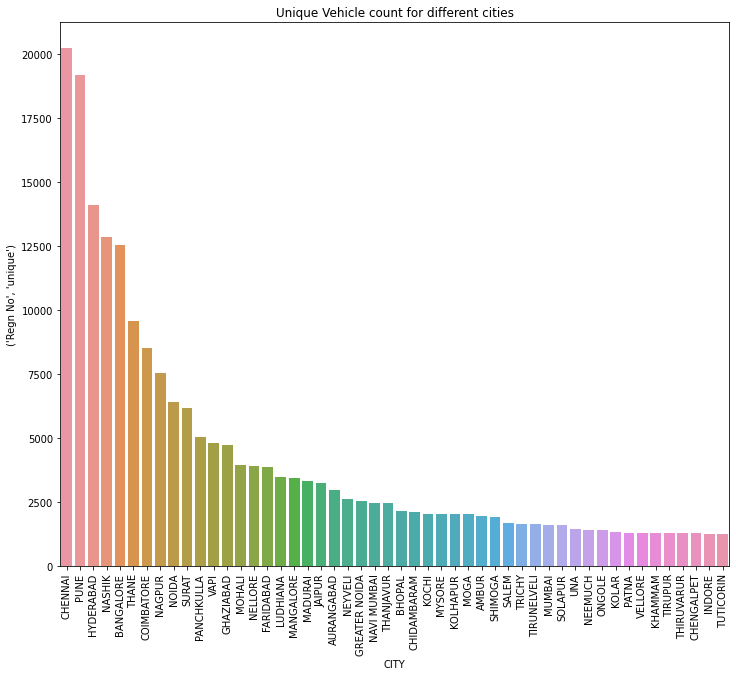

In [76]:
#most cars by city , by finding the number of unique registrations per city, taking the top 50 cities

new_df_city = invoice_data_1[['Regn No','CITY']]
desc_df_city = new_df_city.groupby(['CITY']).describe()

desc_df_city.sort_values(by=('Regn No', 'unique'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(12,10))
chart_city = sns.barplot(x=desc_df_city[:50].index, y = ('Regn No', 'unique'), data = desc_df_city.iloc[:50])
chart_city.set_xticklabels(chart_city.get_xticklabels(), rotation = 90)
plt.title('Unique Vehicle count for different cities')

#### Popularity of vehicles on basis of Make (National and Local pattern)

Text(0.5, 1.0, 'Most Popular car on the basis of make')

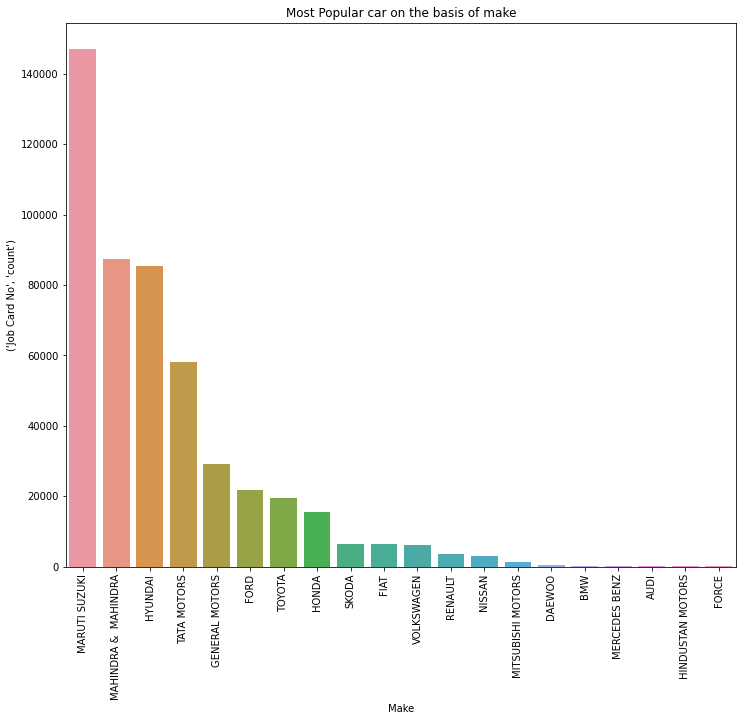

In [77]:
# Which make/ car is most popular?

df_make_desc = invoice_data_1.groupby(by=['Make']).describe()
df_make_desc.sort_values(by=('Job Card No', 'count'), axis=0, ascending= False, inplace= True)

plt.figure(figsize=(12,10))
chart_make = sns.barplot(x=df_make_desc.iloc[:20].index, y= ('Job Card No', 'count'), data = df_make_desc.iloc[:20])
chart_make.set_xticklabels(chart_make.get_xticklabels(), rotation = 90)
plt.title('Most Popular car on the basis of make')

Text(0.5, 1.0, 'State wise popularity on the basis of Make(National pattern of car-make) ')

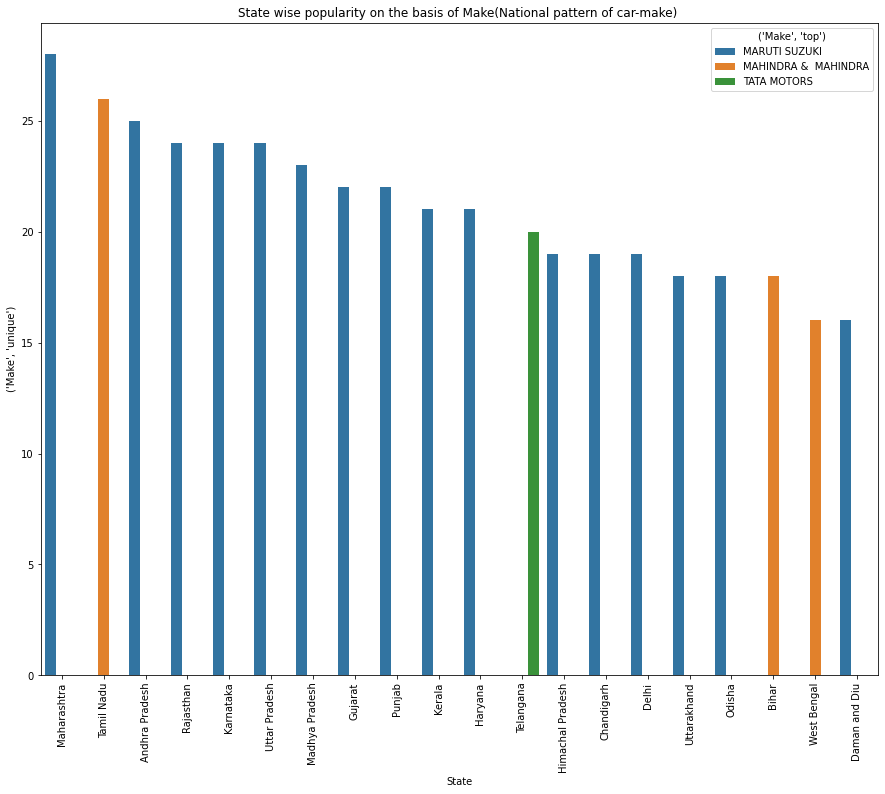

In [78]:
# Which Make is popular among states
df_state_make = invoice_data_1[['Make','State']]
desc_df_state_make = df_state_make.groupby(['State']).describe()

desc_df_state_make.sort_values(by=('Make', 'unique'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(15,12))
chart_state = sns.barplot(x= desc_df_state_make.iloc[:20].index , y = ('Make', 'unique'), data= desc_df_state_make.iloc[:20], hue= ('Make','top'))
chart_state.set_xticklabels(chart_state.get_xticklabels(), rotation = 90)
plt.title('State wise popularity on the basis of Make(National pattern of car-make) ')

Text(0.5, 1.0, 'City wise popularity on the basis of Make(Local pattern of car-make) ')

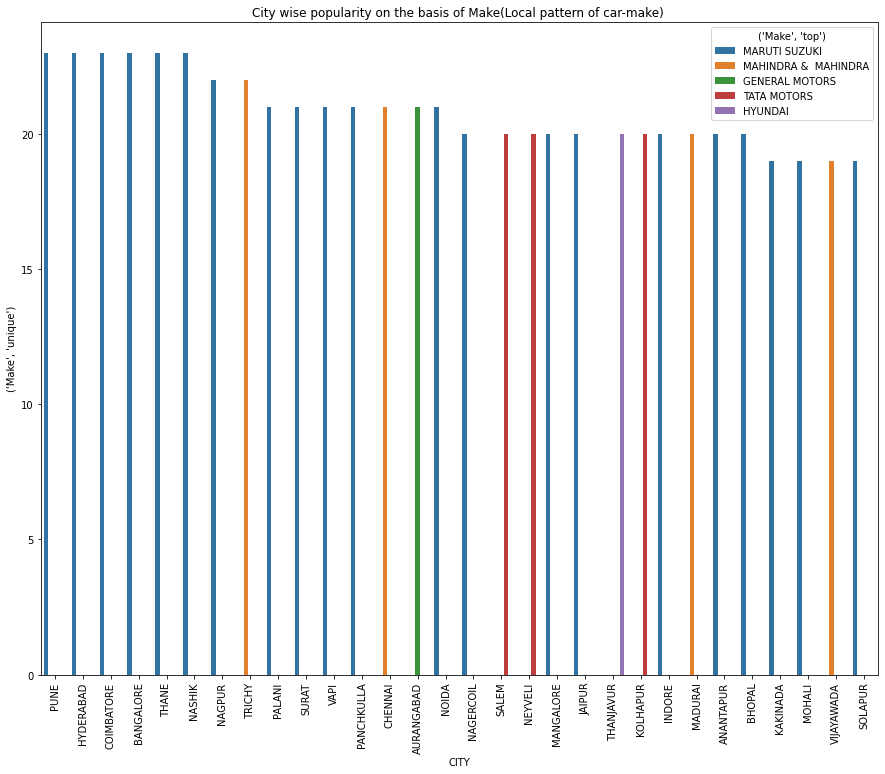

In [79]:
# which make is popular among  cities
df_city_make = invoice_data_1[['Make','CITY']]
desc_df_city_make = df_city_make.groupby(['CITY']).describe()

desc_df_city_make.sort_values(by=('Make', 'unique'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(15,12))
chart_city = sns.barplot(x= desc_df_city_make.iloc[:30].index , y = ('Make', 'unique'), data= desc_df_city_make.iloc[:30], hue= ('Make','top'))
chart_city.set_xticklabels(chart_city.get_xticklabels(), rotation = 90)
plt.title('City wise popularity on the basis of Make(Local pattern of car-make) ')

#### Popularity of vehicles on basis of Models(National and Local pattern)

Text(0.5, 1.0, 'Popularity of vehicles on the basis of Models')

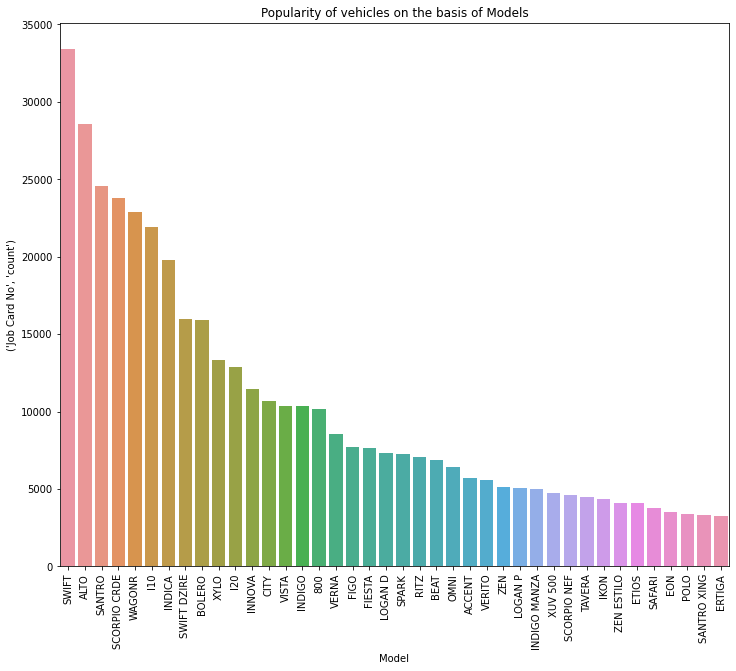

In [80]:
# Which model of car is most popular
df_car_desc = invoice_data_1.groupby(by=['Model']).describe()
df_car_desc.sort_values(by=('Job Card No', 'count'), ascending= False, inplace= True)

plt.figure(figsize=(12,10))
chart_model = sns.barplot(x = df_car_desc.iloc[:40].index , y = ( 'Job Card No', 'count'), data = df_car_desc.iloc[:40])
chart_model.set_xticklabels(chart_model.get_xticklabels(), rotation = 90)
plt.title('Popularity of vehicles on the basis of Models')

Text(0.5, 1.0, 'State wise popularity of vehicle on the basis of Models(National pattern of car-model)')

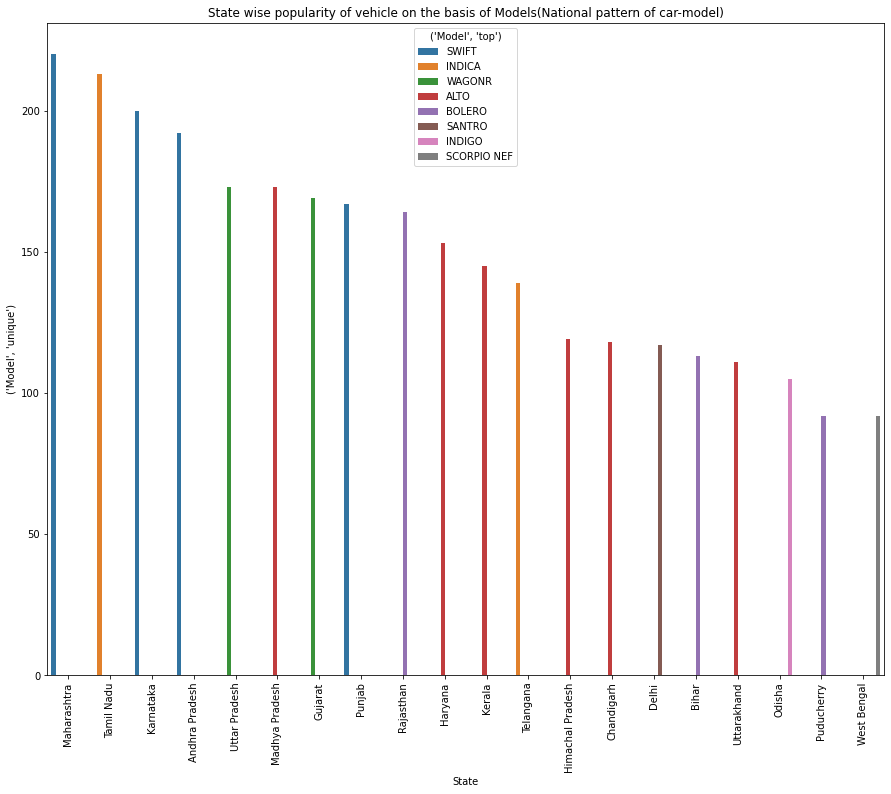

In [81]:
# which model is popular among states
df_state_model = invoice_data_1[['Model','State']]
desc_df_state_model = df_state_model.groupby(['State']).describe()

desc_df_state_model.sort_values(by=('Model', 'unique'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(15,12))
chart_state = sns.barplot(x= desc_df_state_model.iloc[:20].index , y = ('Model', 'unique'), data= desc_df_state_model.iloc[:20], hue= ('Model','top'))
chart_state.set_xticklabels(chart_state.get_xticklabels(), rotation = 90)
plt.title('State wise popularity of vehicle on the basis of Models(National pattern of car-model)')

Text(0.5, 1.0, 'City wise popularity of vehicle on the basis of Models(Local pattern of car-model)')

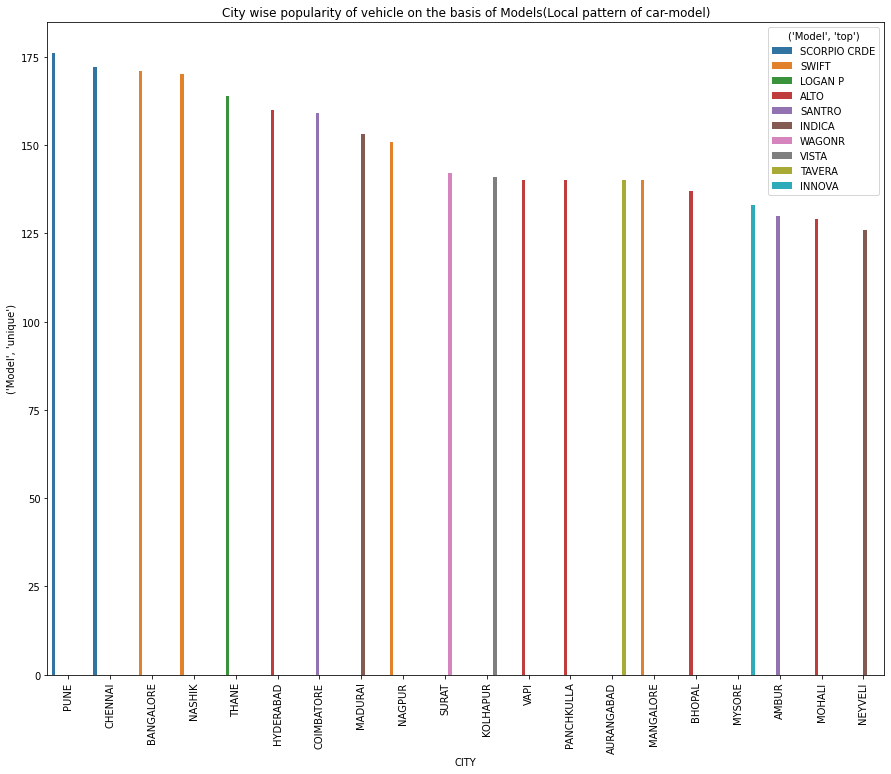

In [82]:
# which model is popular among Cities

df_city_model = invoice_data_1[['Model','CITY']]
desc_df_city_model = df_city_model.groupby(['CITY']).describe()

desc_df_city_model.sort_values(by=('Model', 'unique'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(15,12))
chart_city = sns.barplot(x= desc_df_city_model.iloc[:20].index , y = ('Model', 'unique'), data= desc_df_city_model.iloc[:20], hue= ('Model','top'))
chart_city.set_xticklabels(chart_city.get_xticklabels(), rotation = 90)
plt.title('City wise popularity of vehicle on the basis of Models(Local pattern of car-model)')

#### Service structure (National and Local level)

Text(0.5, 1.0, 'Services mostly used by Customers')

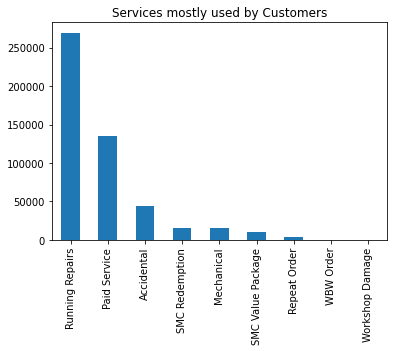

In [83]:
invoice_data_1['Order Type'].value_counts().plot(kind='bar')
plt.title('Services mostly used by Customers')

##### Service Structure (Make and Model based)

Text(0.5, 1.0, 'Most used service for particular make of vehicle')

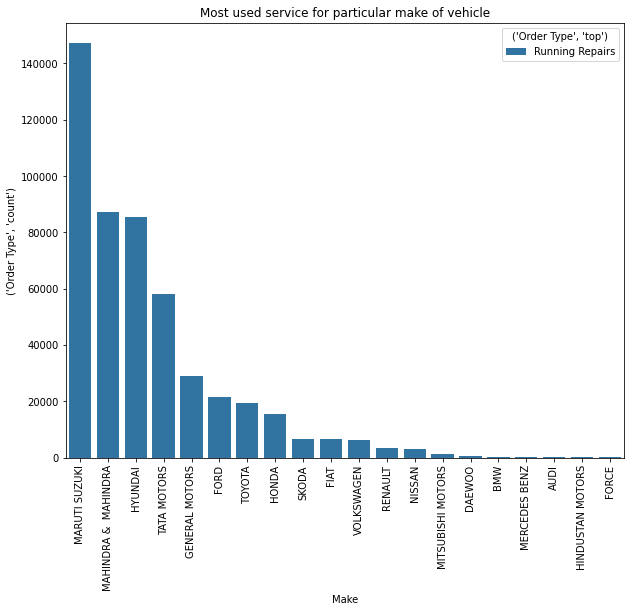

In [84]:
# service structure for particluar car/make?
df_service_make = invoice_data_1[['Make','Order Type']]
desc_df_service_make = df_service_make.groupby(['Make']).describe()
desc_df_service_make.sort_values(by=('Order Type', 'count'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(10,8))
chart_service_make = sns.barplot(x= desc_df_service_make.iloc[:20].index , y = ('Order Type', 'count'), data= desc_df_service_make.iloc[:20], hue= ('Order Type', 'top'))
chart_service_make.set_xticklabels(chart_service_make.get_xticklabels(), rotation = 90)
plt.title('Most used service for particular make of vehicle')

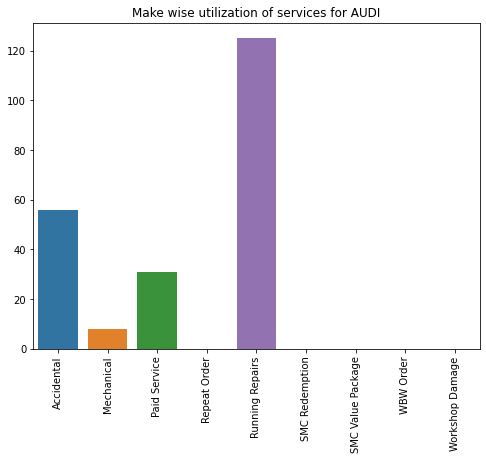

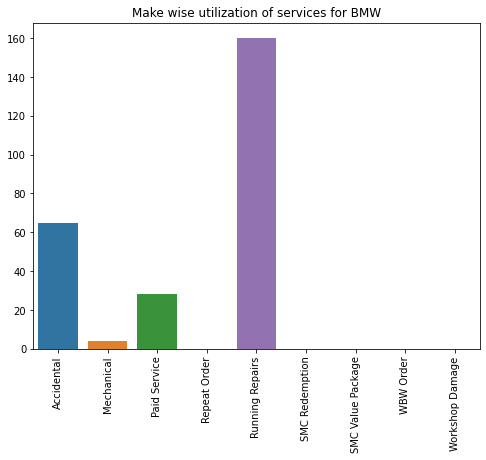

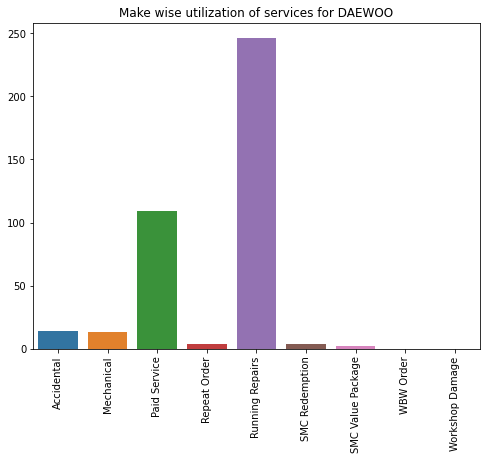

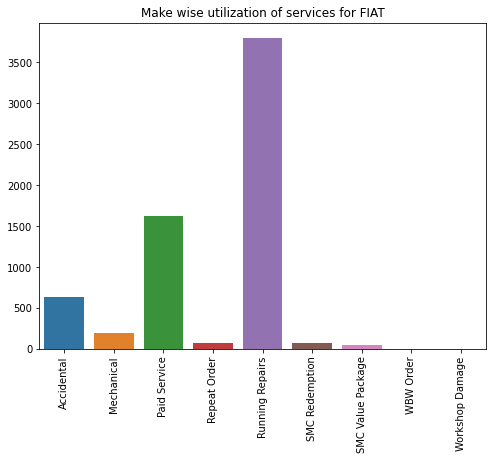

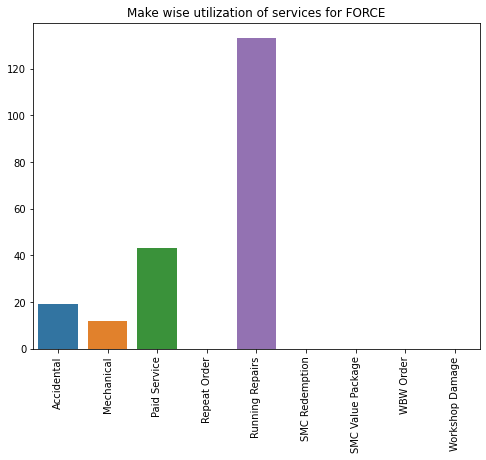

...

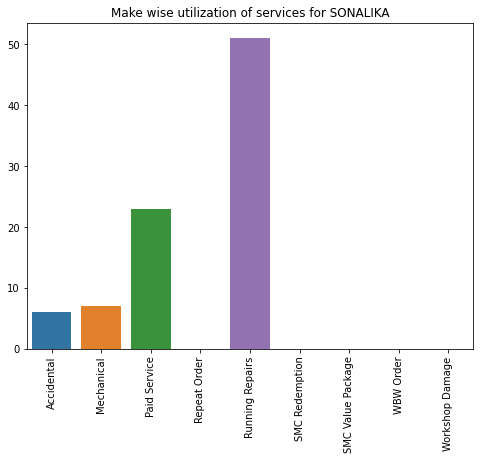

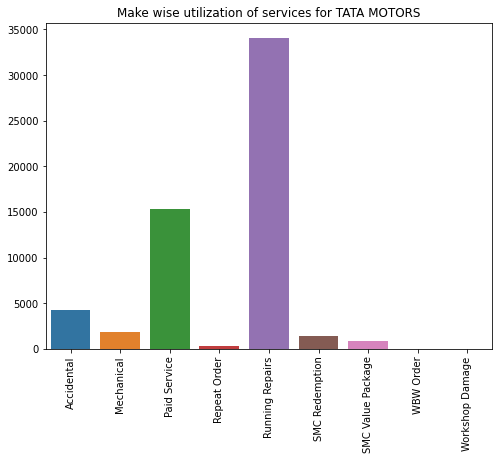

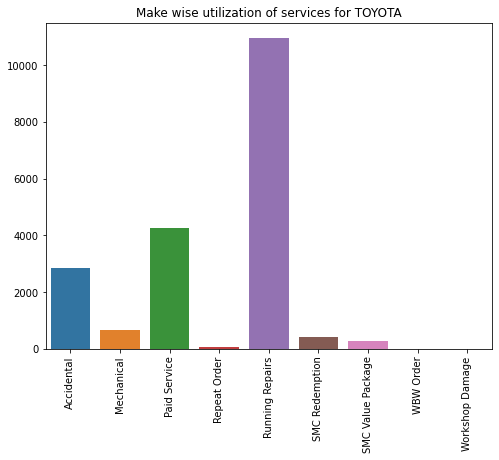

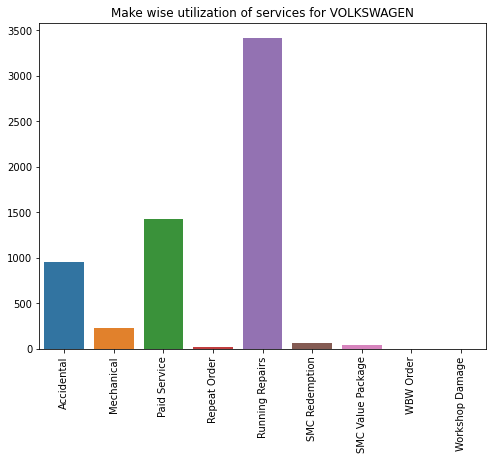

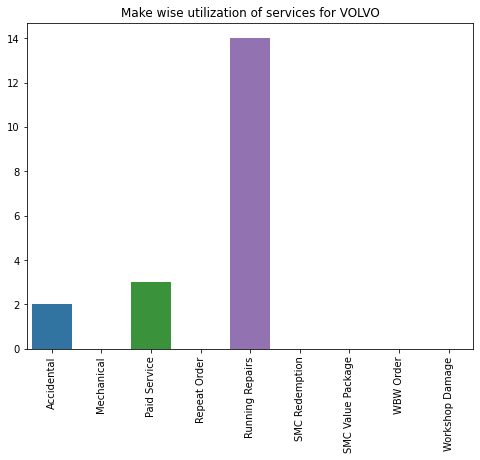

In [85]:
df_desc = invoice_data_1.groupby(['Make','Order Type']).describe().unstack()
# df_desc.iloc[:,72:81]

for idx, row in df_desc.iloc[:,72:81].iterrows():
  order_count=[]
  order_type = ['Accidental','Mechanical','Paid Service','Repeat Order','Running Repairs','SMC Redemption','SMC Value Package','WBW Order','Workshop Damage']
  
  order_count.append(row[('Job Card No', 'count','Accidental')])
  order_count.append(row[('Job Card No', 'count','Mechanical')])
  order_count.append(row[('Job Card No', 'count','Paid Service')])
  order_count.append(row[('Job Card No', 'count','Repeat Order')])
  order_count.append(row[('Job Card No', 'count','Running Repairs')])
  order_count.append(row[('Job Card No', 'count','SMC Redemption')])
  order_count.append(row[('Job Card No', 'count','SMC Value Package')])
  order_count.append(row[('Job Card No', 'count','WBW Order')])
  order_count.append(row[('Job Card No', 'count','Workshop Damage')])

  plt.figure(figsize=(8,6))
  sns.barplot(x=order_type, y = order_count)
  plt.title("Make wise utilization of services for {}".format(idx))
  plt.xticks(rotation=90)
  plt.show()

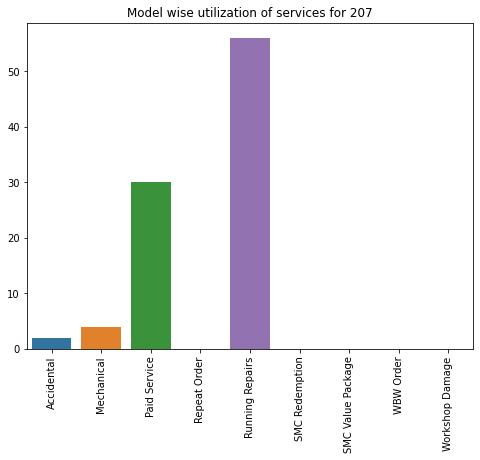

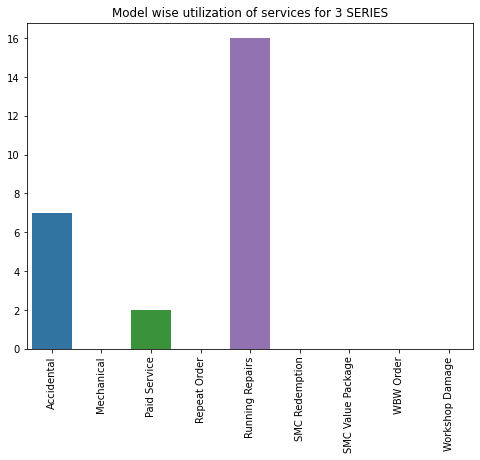

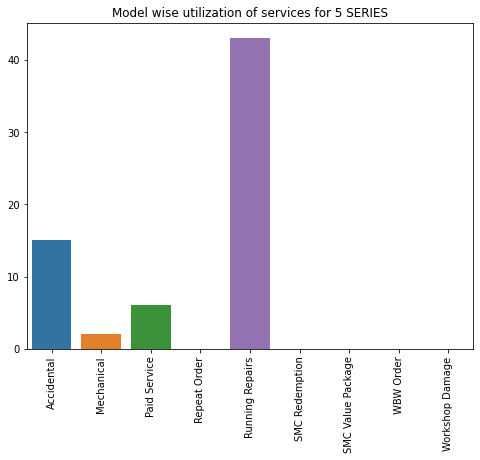

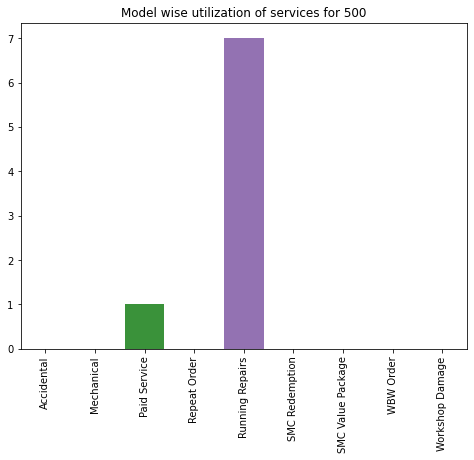

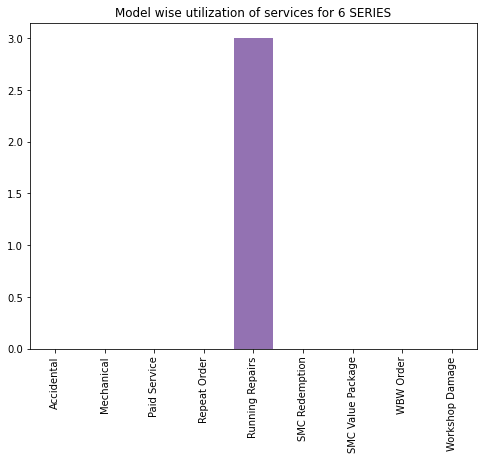

...

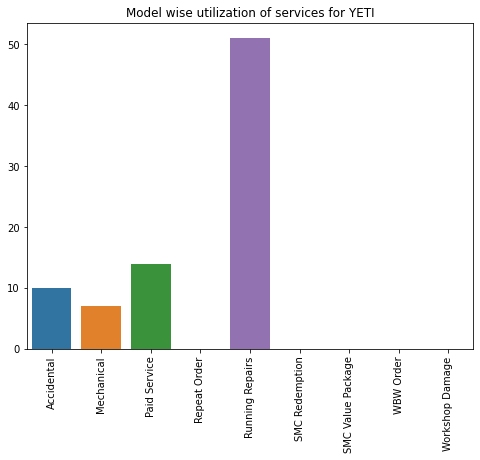

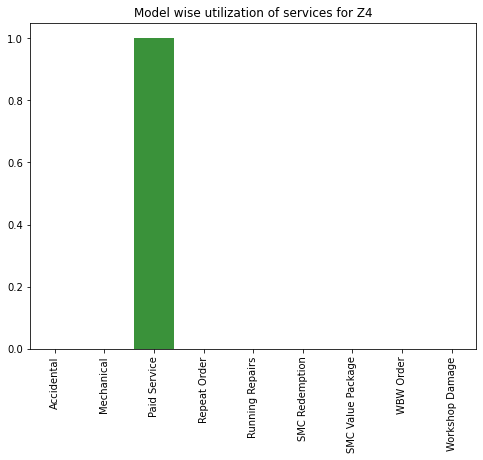

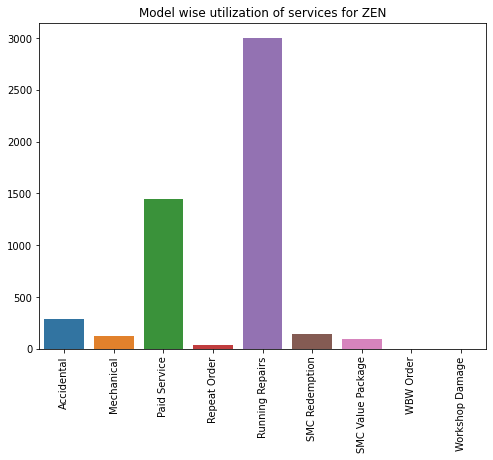

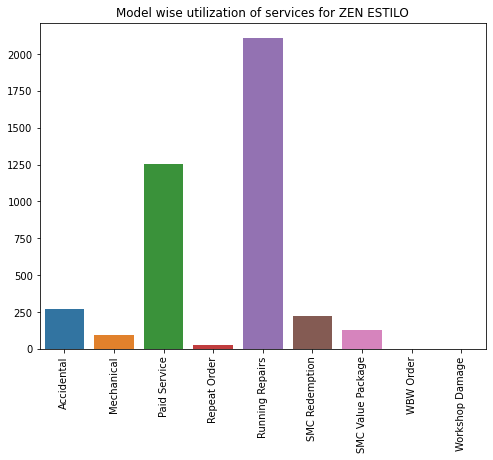

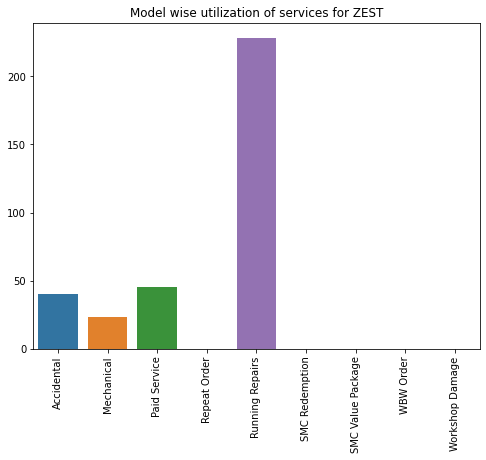

In [86]:
df_desc_model = invoice_data_1.groupby(['Model','Order Type']).describe().unstack()
df_desc_model.iloc[:,72:81].columns

for idx, row in df_desc_model.iloc[:,72:81].iterrows():
  order_count=[]
  order_type = ['Accidental','Mechanical','Paid Service','Repeat Order','Running Repairs','SMC Redemption','SMC Value Package','WBW Order','Workshop Damage']
  
  order_count.append(row[('Job Card No', 'count','Accidental')])
  order_count.append(row[('Job Card No', 'count','Mechanical')])
  order_count.append(row[('Job Card No', 'count','Paid Service')])
  order_count.append(row[('Job Card No', 'count','Repeat Order')])
  order_count.append(row[('Job Card No', 'count','Running Repairs')])
  order_count.append(row[('Job Card No', 'count','SMC Redemption')])
  order_count.append(row[('Job Card No', 'count','SMC Value Package')])
  order_count.append(row[('Job Card No', 'count','WBW Order')])
  order_count.append(row[('Job Card No', 'count','Workshop Damage')])

  plt.figure(figsize=(8,6))
  sns.barplot(x=order_type, y = order_count)
  plt.title('Model wise utilization of services for {}'.format(idx))
  plt.xticks(rotation=90)
  plt.show()

##### Service Structure ( City and National level)

Text(0.5, 1.0, 'Top cities in terms of services used')

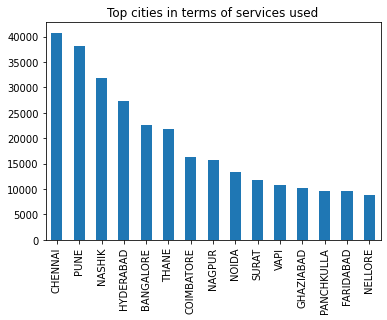

In [87]:
# top cities in terms of services used
invoice_data_1['CITY'].value_counts()[:15].plot(kind='bar')
plt.title('Top cities in terms of services used')

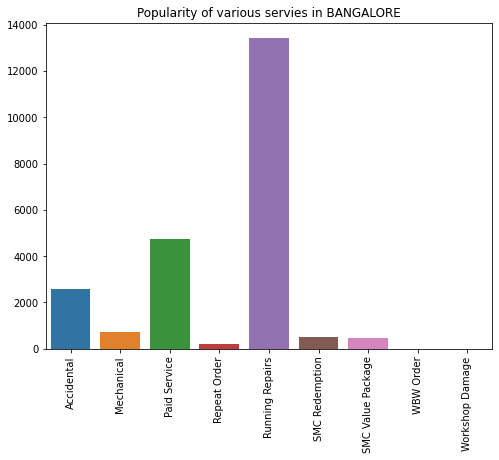

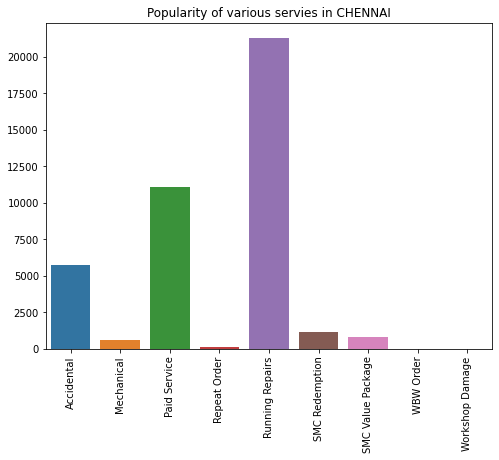

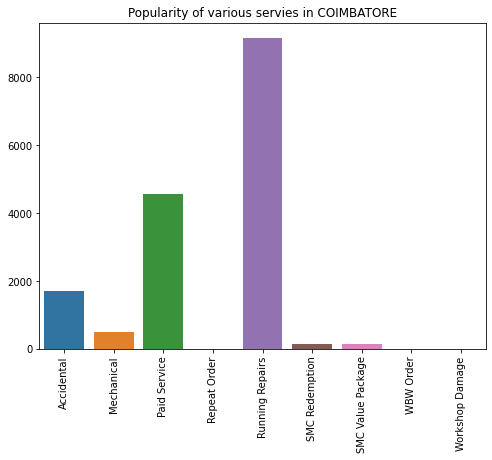

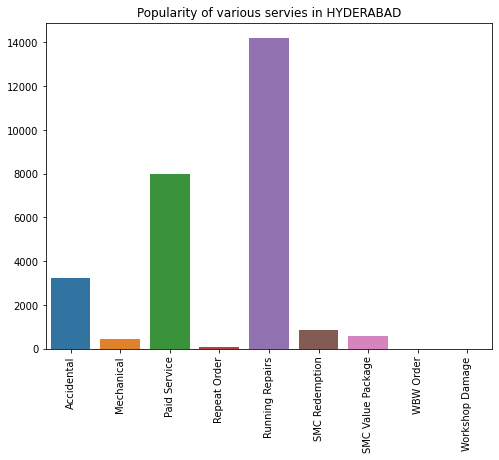

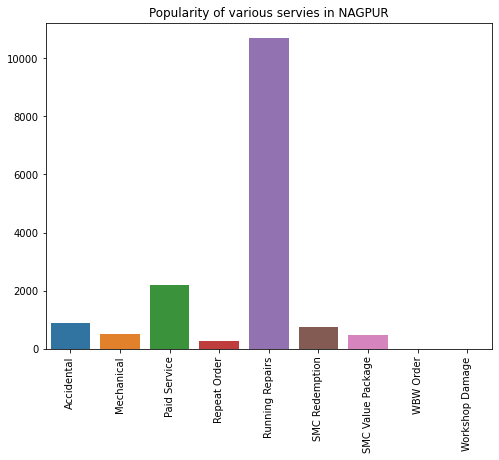

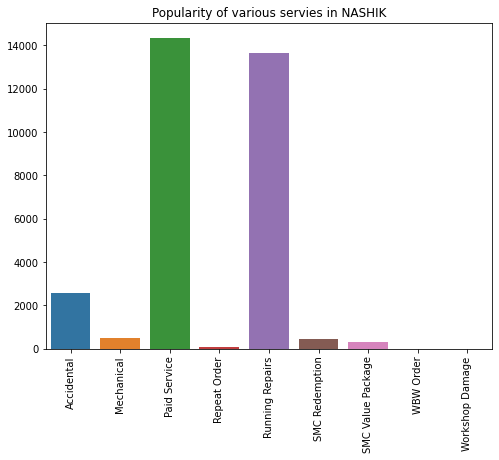

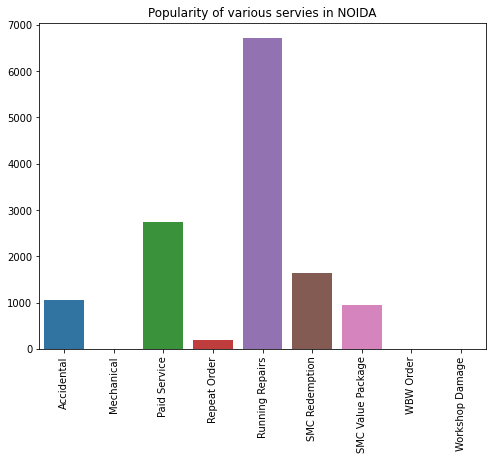

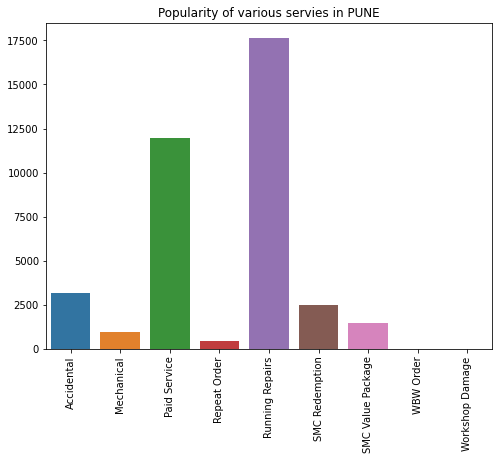

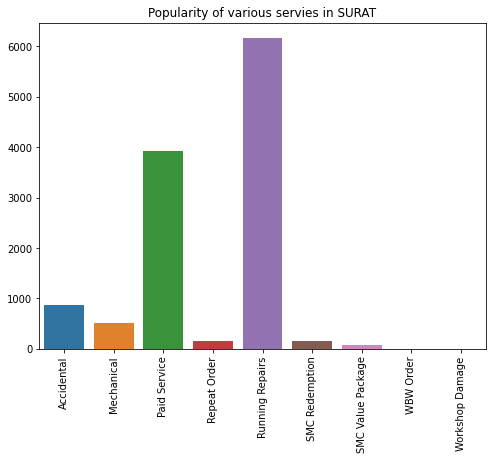

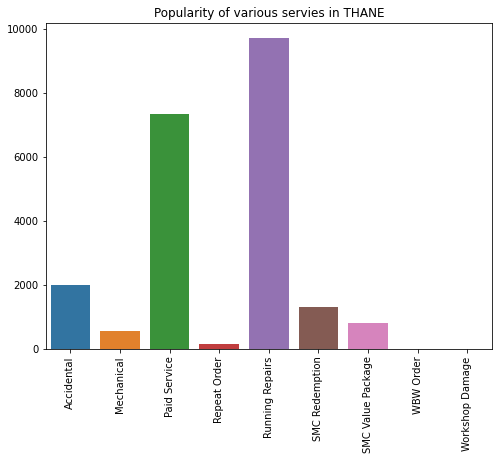

In [88]:
df_desc_city = invoice_data_1.groupby(['CITY','Order Type']).describe().unstack()
df_desc_city.columns

city_list = list(invoice_data_1['CITY'].value_counts()[:10].index)
order_type = ['Accidental','Mechanical','Paid Service','Repeat Order','Running Repairs','SMC Redemption','SMC Value Package','WBW Order','Workshop Damage']

for idx, row in df_desc_city.iterrows():
  order_count=[]
  if idx in city_list:
    order_count.append(row[('Job Card No', 'count','Accidental')])
    order_count.append(row[('Job Card No', 'count','Mechanical')])
    order_count.append(row[('Job Card No', 'count','Paid Service')])
    order_count.append(row[('Job Card No', 'count','Repeat Order')])
    order_count.append(row[('Job Card No', 'count','Running Repairs')])
    order_count.append(row[('Job Card No', 'count','SMC Redemption')])
    order_count.append(row[('Job Card No', 'count','SMC Value Package')])
    order_count.append(row[('Job Card No', 'count','WBW Order')])
    order_count.append(row[('Job Card No', 'count','Workshop Damage')])

    plt.figure(figsize=(8,6))
    sns.barplot(x = order_type ,  y=order_count)
    plt.title("Popularity of various servies in {}".format(idx))
    plt.xticks(rotation=90)
    plt.show()

Text(0.5, 1.0, 'Top 10 states utilizing the various services')

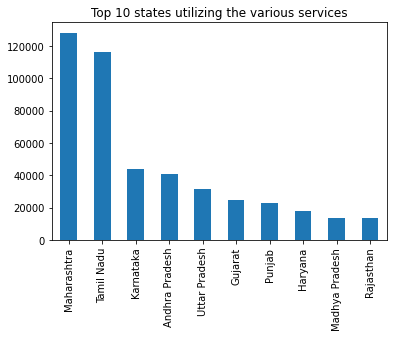

In [89]:
invoice_data_1['State'].value_counts()[:10].plot(kind='bar')
plt.title('Top 10 states utilizing the various services')

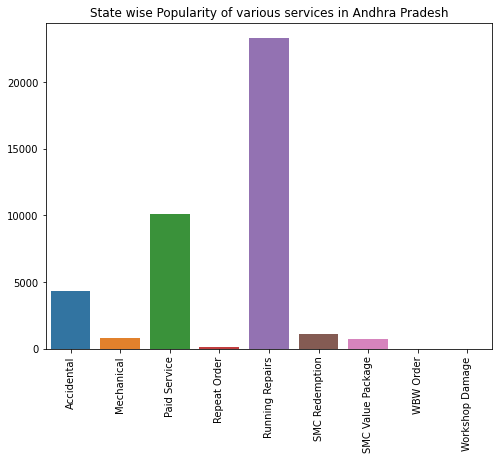

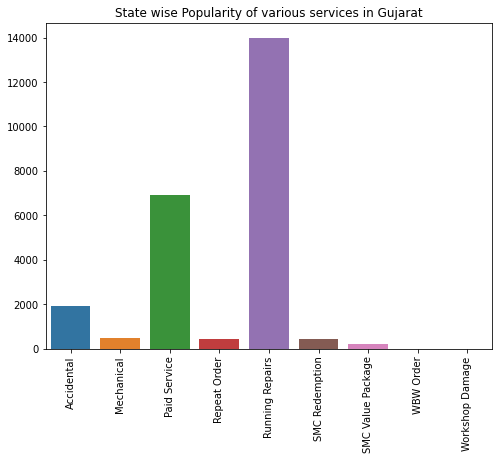

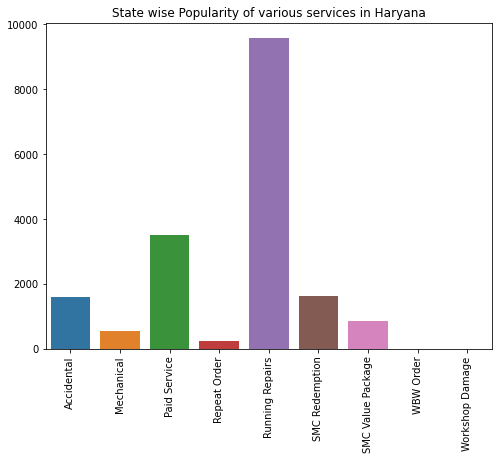

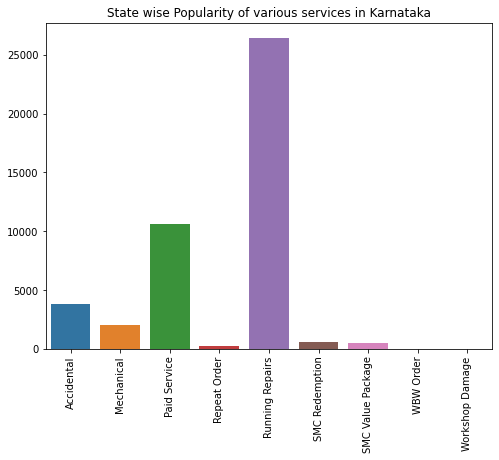

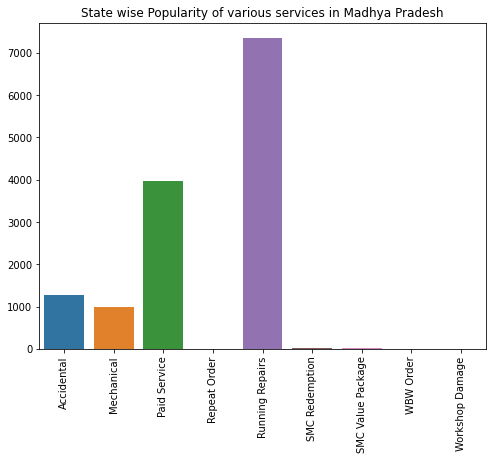

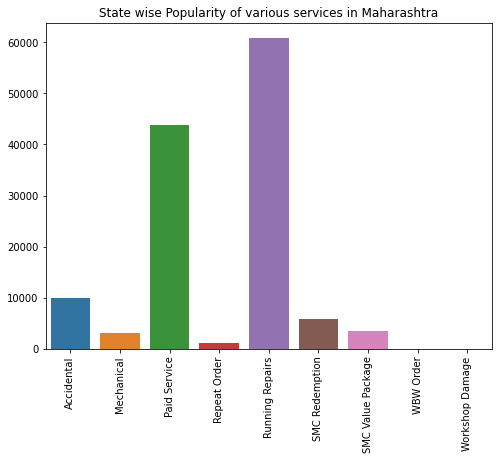

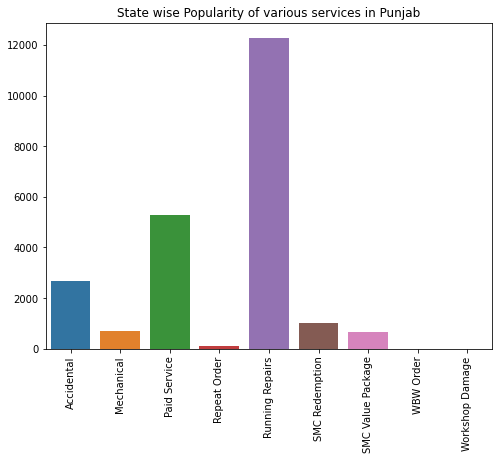

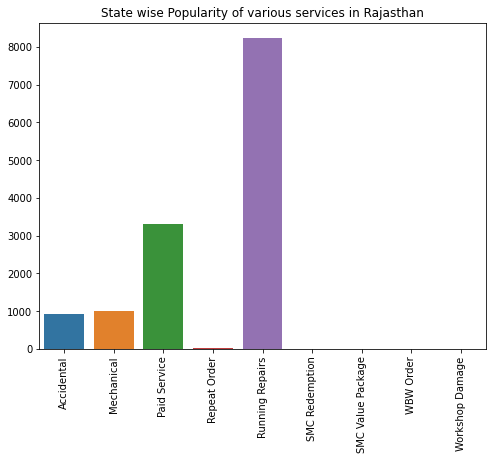

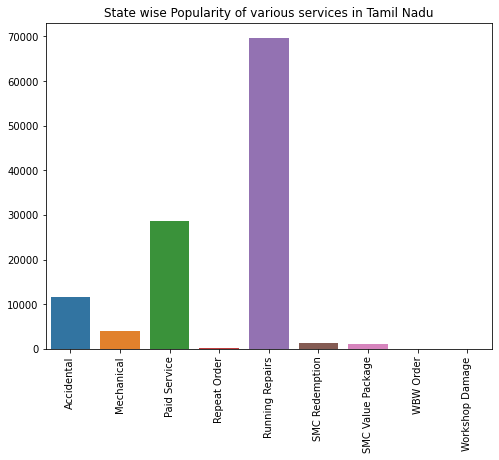

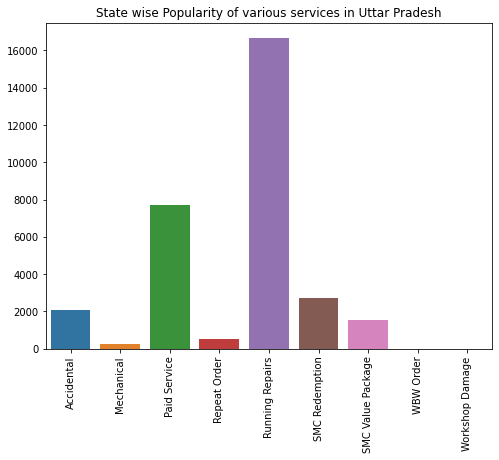

In [90]:
df_desc_state = invoice_data_1.groupby(['State','Order Type']).describe().unstack()

state_list = list(invoice_data_1['State'].value_counts()[:10].index)
order_type = ['Accidental','Mechanical','Paid Service','Repeat Order','Running Repairs','SMC Redemption','SMC Value Package','WBW Order','Workshop Damage']

for idx, row in df_desc_state.iterrows():
  order_count=[]
  if idx in state_list:
    order_count.append(row[('Job Card No', 'count','Accidental')])
    order_count.append(row[('Job Card No', 'count','Mechanical')])
    order_count.append(row[('Job Card No', 'count','Paid Service')])
    order_count.append(row[('Job Card No', 'count','Repeat Order')])
    order_count.append(row[('Job Card No', 'count','Running Repairs')])
    order_count.append(row[('Job Card No', 'count','SMC Redemption')])
    order_count.append(row[('Job Card No', 'count','SMC Value Package')])
    order_count.append(row[('Job Card No', 'count','WBW Order')])
    order_count.append(row[('Job Card No', 'count','Workshop Damage')])

    plt.figure(figsize=(8,6))
    sns.barplot(x = order_type ,  y=order_count)
    plt.title('State wise Popularity of various services in {}'.format(idx))
    plt.xticks(rotation=90)
    plt.show()

#### Revenue Generated( Local and National Level)

Text(0.5, 1.0, 'Top 15 Revenue Generating States')

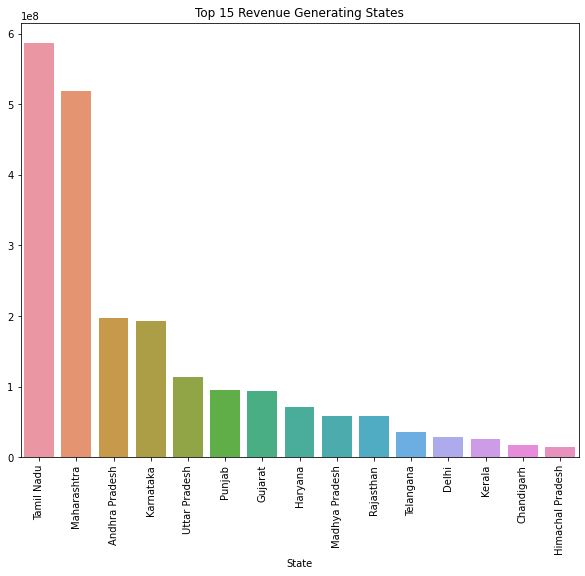

In [91]:
df_state_rev = invoice_data_1[['State','Total Value']]
df_desc_state_rev = df_state_rev.groupby(['State'])['Total Value'].apply(np.sum)

df_desc_state_rev.sort_values(axis=0, ascending= False, inplace= True)
df_desc_state_rev.values
plt.figure(figsize=(10,8))
sns.barplot(x = df_desc_state_rev[:15].index , y = df_desc_state_rev[:15].values )
plt.xticks(rotation=90)
plt.title('Top 15 Revenue Generating States')

Text(0.5, 1.0, 'Top 15 Revenue Generating Cities')

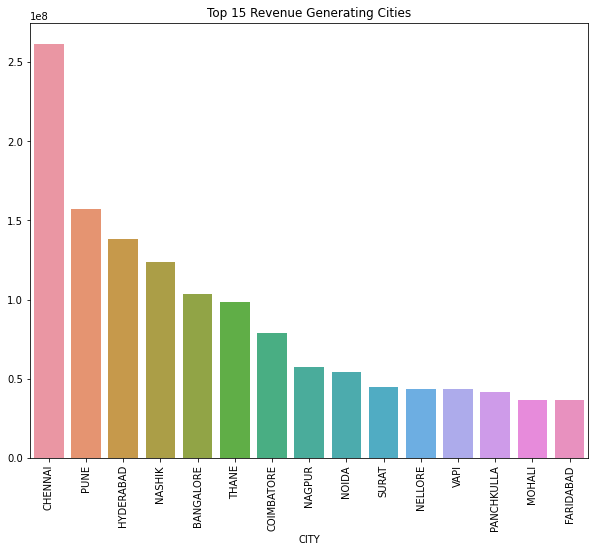

In [92]:
df_city_rev = invoice_data_1[['CITY','Total Value']]
df_desc_city_rev = df_city_rev.groupby(['CITY'])['Total Value'].apply(np.sum)

df_desc_city_rev.sort_values(axis=0, ascending= False, inplace= True)

plt.figure(figsize=(10,8))
sns.barplot(x = df_desc_city_rev[:15].index , y = df_desc_city_rev[:15].values )
plt.xticks(rotation=90)
plt.title('Top 15 Revenue Generating Cities')

Text(0.5, 1.0, 'Top 5 Revenue Generating Services')

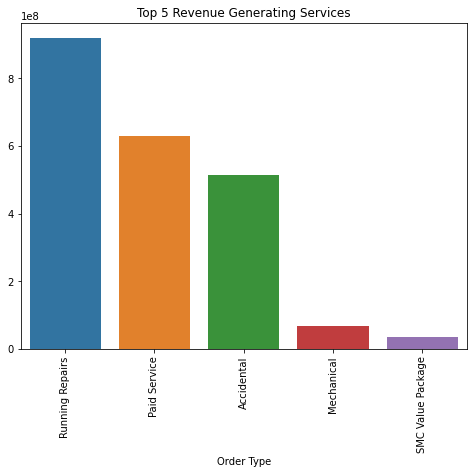

In [93]:
df_service_rev = invoice_data_1[['Order Type','Total Value']]
df_desc_service_rev = df_service_rev.groupby(['Order Type'])['Total Value'].apply(np.sum)

df_desc_service_rev.sort_values(axis=0, ascending= False, inplace= True)

plt.figure(figsize=(8,6))
sns.barplot(x = df_desc_service_rev[:5].index , y = df_desc_service_rev[:5].values )
plt.xticks(rotation=90)
plt.title('Top 5 Revenue Generating Services')

Text(0.5, 1.0, 'Comparison of Total Order Value for Different Cities')

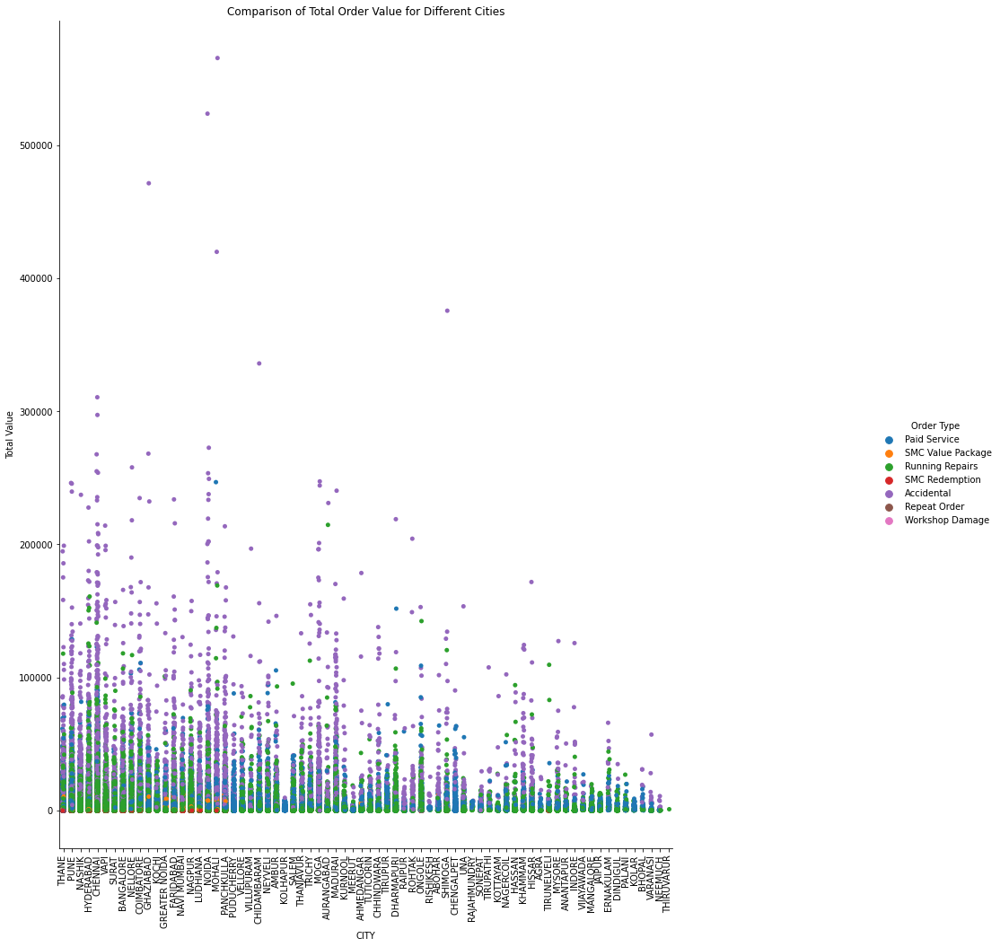

In [94]:
g = sns.catplot(x='CITY', y = 'Total Value', data = invoice_data_1.iloc[:150000], hue ='Order Type' )
g.fig.set_size_inches(18,15)
for ax in  g.axes.flat:
  for label in ax.get_xticklabels():
    label.set_rotation(90)

plt.title("Comparison of Total Order Value for Different Cities")

#### Revenue generated ( Order type and Vehicle make wise) 

Text(0.5, 1.0, 'Comparison of Total Order Value for Different Make of the vehicle')

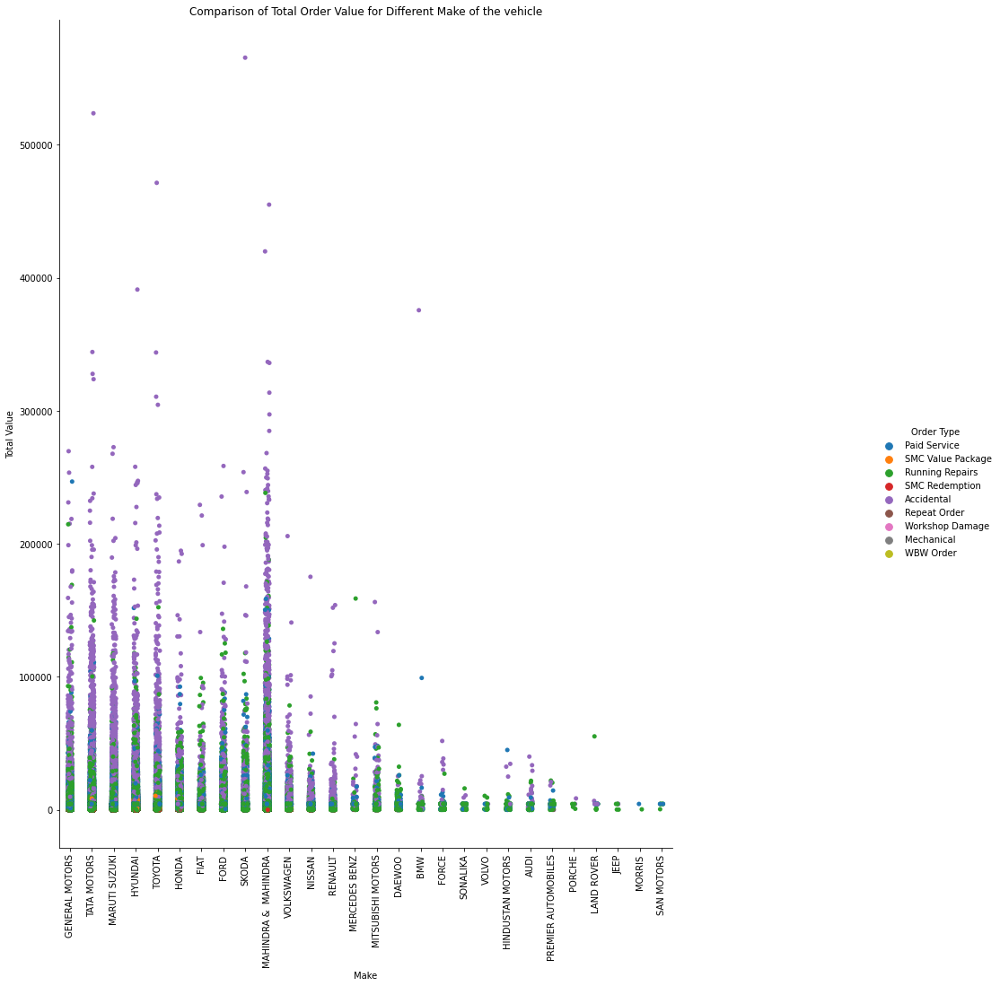

In [95]:
g = sns.catplot(x='Make', y = 'Total Value', data = invoice_data_1, hue ='Order Type' )
g.fig.set_size_inches(18,15)
for ax in  g.axes.flat:
  for label in ax.get_xticklabels():
    label.set_rotation(90)

plt.title("Comparison of Total Order Value for Different Make of the vehicle")

CPU times: user 18min 31s, sys: 30.7 s, total: 19min 2s
Wall time: 18min 30s


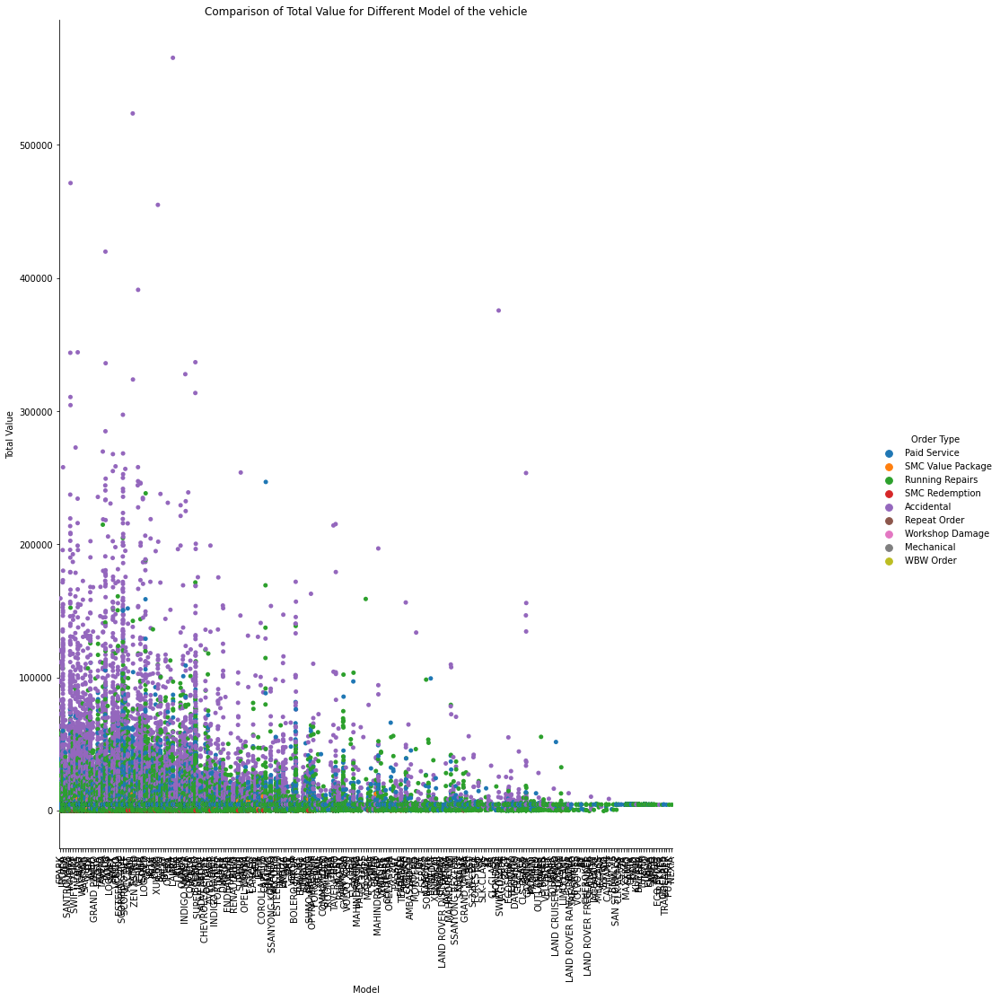

In [96]:
%%time
g = sns.catplot(x='Model', y = 'Total Value', data = invoice_data_1, hue ='Order Type' )
g.fig.set_size_inches(18,15)
for ax in  g.axes.flat:
  for label in ax.get_xticklabels():
    label.set_rotation(90)

plt.title("Comparison of Total Value for Different Model of the vehicle")

Text(0.5, 1.0, 'Comparison of Total Value for Different Model of the vehicle')

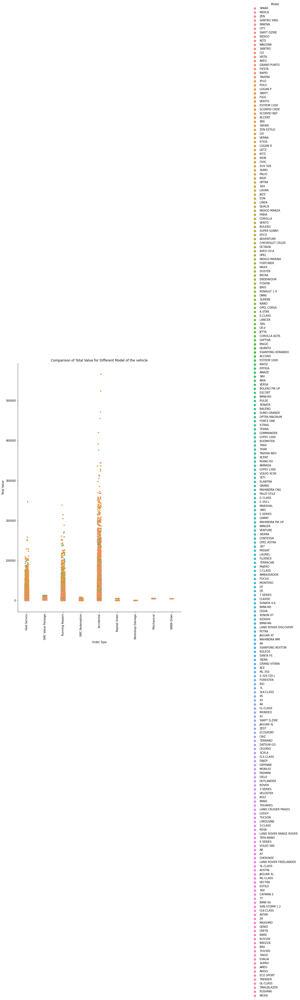

In [97]:
g = sns.catplot(x='Order Type', y = 'Total Value', data = invoice_data_1, hue ='Model' )
g.fig.set_size_inches(18,15)
for ax in  g.axes.flat:
  for label in ax.get_xticklabels():
    label.set_rotation(90)

plt.title("Comparison of Total Value for Different Model of the vehicle")

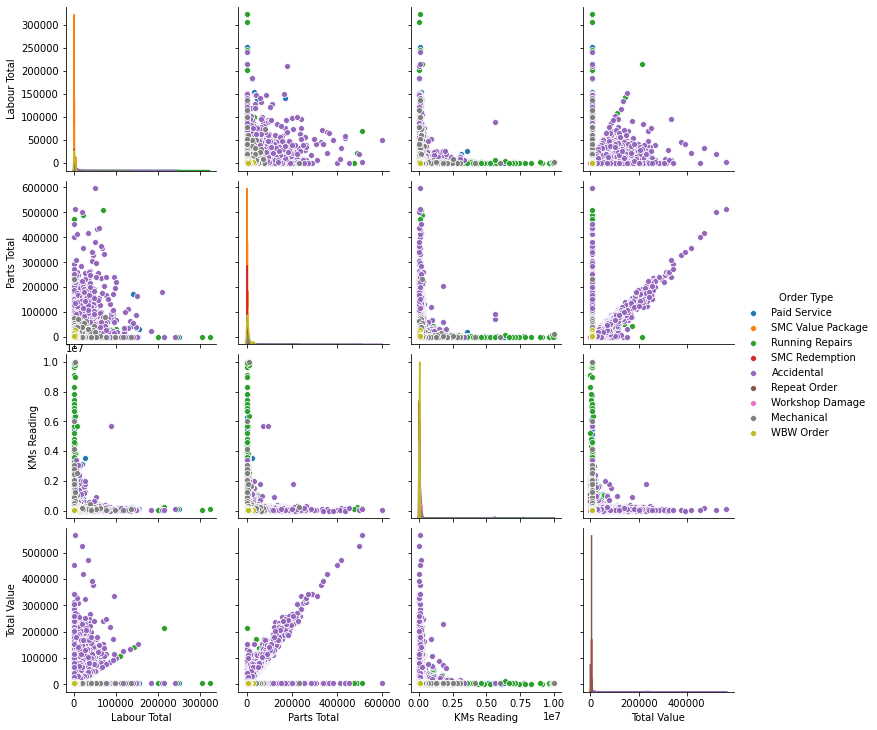

In [98]:
new_df = invoice_data_1[['Labour Total','Parts Total','KMs Reading','Order Type','Total Value']]
sns.pairplot(new_df, hue = 'Order Type')

#### Time taken for various services

In [0]:
#Feature Engineering - Adding Time to service(hours)
invoice_data_1['Time to service(hours)'] = ((invoice_data_1['Time Taken'].dt.components['days'] * 24 * 60) + invoice_data_1['Time Taken'].dt.components['hours']*60 + invoice_data_1['Time Taken'].dt.components['minutes'])/60 

Text(0.5, 1.0, 'Mean time taken by various services to be processed')

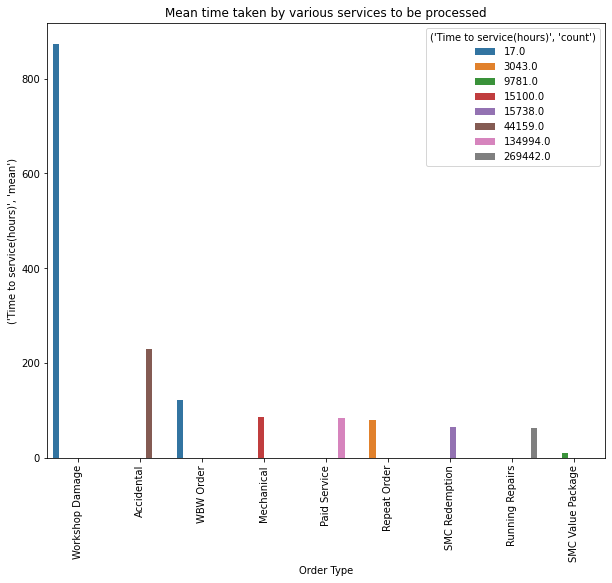

In [100]:
# time taken for various service 
df_service_time = invoice_data_1[['Order Type','Time to service(hours)']]
desc_df_service_time = df_service_time.groupby(['Order Type']).describe()
desc_df_service_time.columns
desc_df_service_time.sort_values(by=('Time to service(hours)','mean'),axis=0,ascending=False, inplace = True)

plt.figure(figsize=(10,8))
chart_service_time = sns.barplot(x= desc_df_service_time.index , y = ('Time to service(hours)',  'mean'), data= desc_df_service_time, hue= ('Time to service(hours)',  'count'))
chart_service_time.set_xticklabels(chart_service_time.get_xticklabels(), rotation = 90)
plt.title('Mean time taken by various services to be processed')

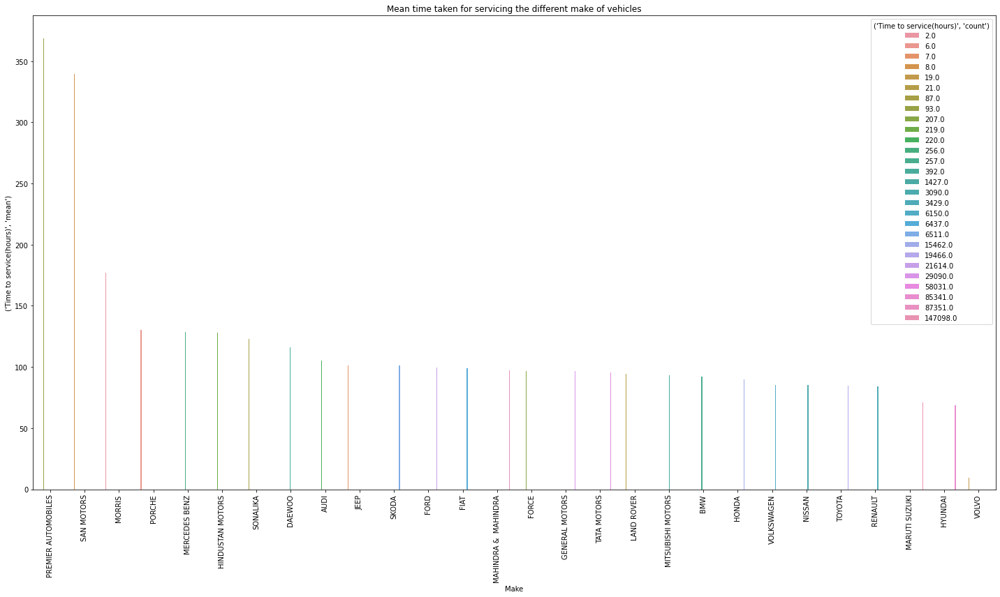

In [101]:
# time taken for various service 
df_service_time_make = invoice_data_1[['Make','Time to service(hours)']]
desc_df_service_time_make = df_service_time_make.groupby(['Make']).describe()
desc_df_service_time_make.columns
desc_df_service_time_make.sort_values(by=('Time to service(hours)','mean'),axis=0,ascending=False, inplace = True)

fig1, axes = plt.subplots(figsize=(20,12))
chart_service_time_make = sns.barplot(x= desc_df_service_time_make.index , y = ('Time to service(hours)',  'mean'), data= desc_df_service_time_make, hue= ('Time to service(hours)',  'count'))
chart_service_time_make.set_xticklabels(chart_service_time_make.get_xticklabels(), rotation = 90)
plt.title('Mean time taken for servicing the different make of vehicles')
fig1.tight_layout()

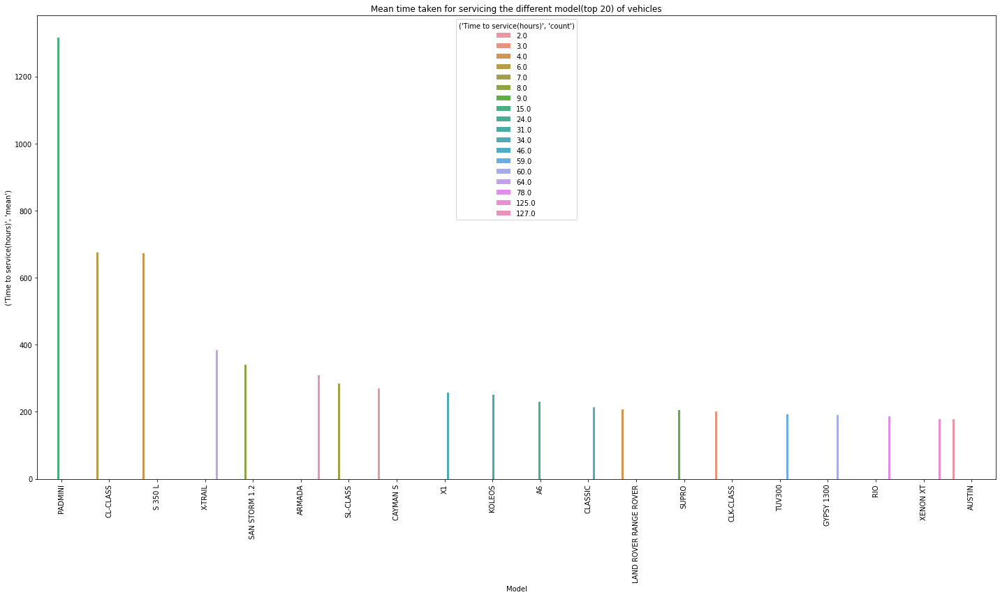

In [102]:
# time taken for various service 
df_service_time_model = invoice_data_1[['Model','Time to service(hours)']]
desc_df_service_time_model = df_service_time_model.groupby(['Model']).describe()
desc_df_service_time_model.columns
desc_df_service_time_model.sort_values(by=('Time to service(hours)','mean'),axis=0,ascending=False, inplace = True)

fig1, axes = plt.subplots(figsize=(20,12))
chart_service_time_model = sns.barplot(x= desc_df_service_time_model.iloc[:20].index , y = ('Time to service(hours)',  'mean'), data= desc_df_service_time_model.iloc[:20], hue= ('Time to service(hours)',  'count'))
chart_service_time_model.set_xticklabels(chart_service_time_model.get_xticklabels(), rotation = 90)
plt.title('Mean time taken for servicing the different model(top 20) of vehicles')
fig1.tight_layout()

Text(0.5, 1.0, 'Time taken to Process the different Service Types(State Wise distribution)')

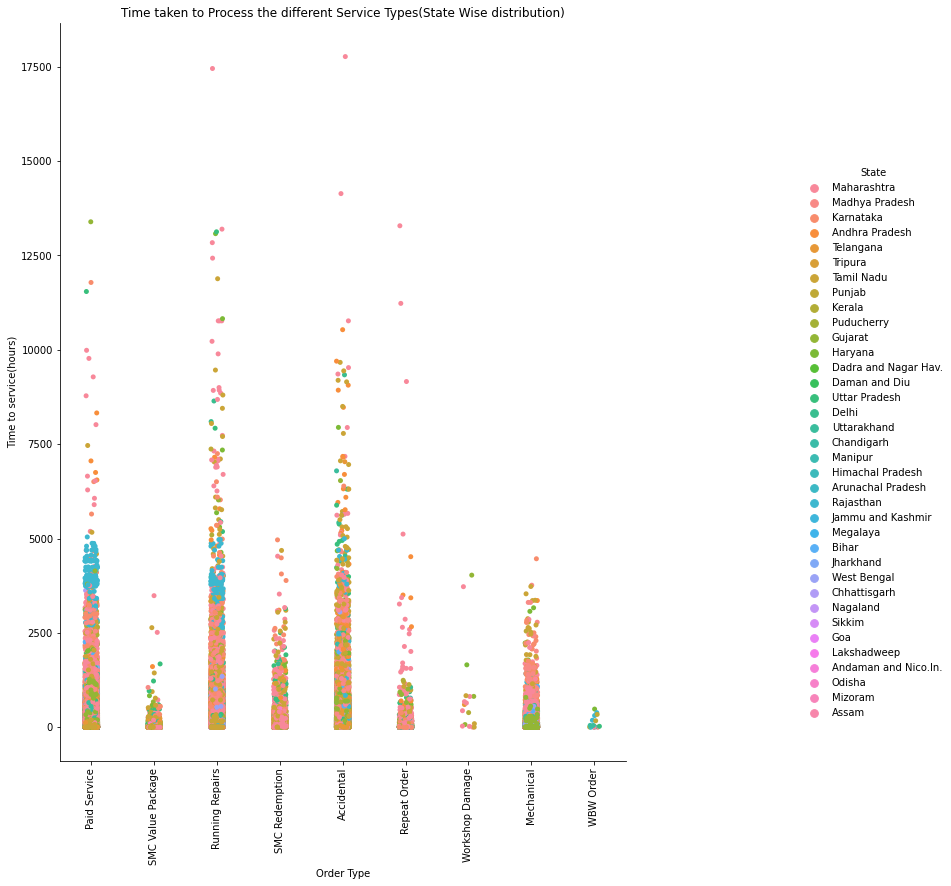

In [103]:
# time taken state wise distribution
g_time = sns.catplot(x='Order Type', y = 'Time to service(hours)', data = invoice_data_1, hue = 'State')
g_time.fig.set_size_inches(15,12)
for ax in  g_time.axes.flat:
  for label in ax.get_xticklabels():
    label.set_rotation(90)

plt.title("Time taken to Process the different Service Types(State Wise distribution)")

Text(0.5, 1.0, 'Time taken to Process the different Service Types(Vehicle Make Wise distribution)')

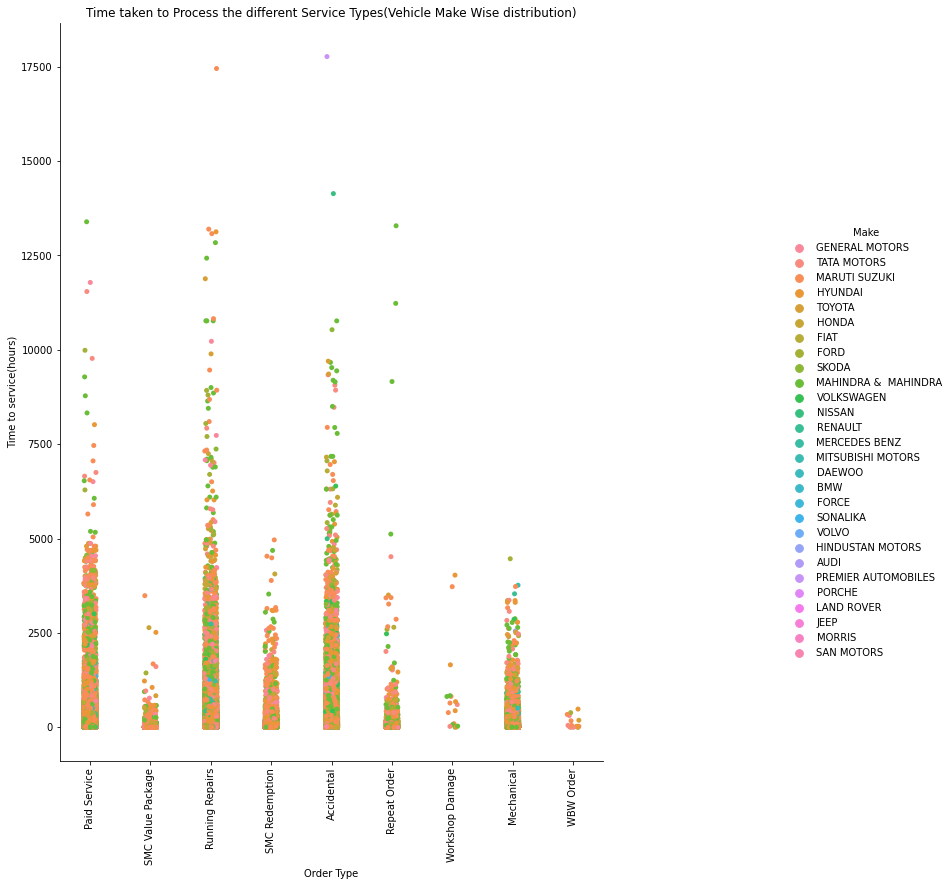

In [104]:
g_make_time = sns.catplot(x='Order Type', y = 'Time to service(hours)', data = invoice_data_1, hue = 'Make')
g_make_time.fig.set_size_inches(15,12)
for ax in  g_make_time.axes.flat:
  for label in ax.get_xticklabels():
    label.set_rotation(90)

plt.title("Time taken to Process the different Service Types(Vehicle Make Wise distribution)")

#### Costing for Various Services(Order Types)

In [105]:
# difference in each service /labour costing
invoice_data_1['Order Type'].value_counts()

Running Repairs      269442
Paid Service         134994
Accidental            44159
SMC Redemption        15738
Mechanical            15100
SMC Value Package      9781
Repeat Order           3043
WBW Order                17
Workshop Damage          17
Name: Order Type, dtype: int64

Text(0.5, 1.0, 'Difference of Mean Labour Costing among various services')

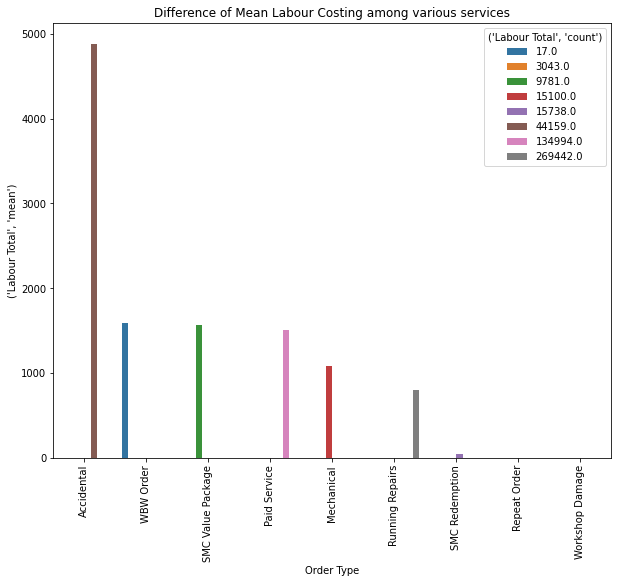

In [106]:
# mean labour costing for different Order types
df_service_labour = invoice_data_1[['Order Type','Labour Total']]
desc_df_service_labour = df_service_labour.groupby(['Order Type']).describe()

desc_df_service_labour.sort_values(by=('Labour Total',  'mean'),axis=0,ascending=False, inplace = True)
# print(desc_df_service_labour.columns)

plt.figure(figsize=(10,8))
chart_service_labour = sns.barplot(x= desc_df_service_labour.index , y = ('Labour Total',  'mean'), data= desc_df_service_labour, hue= ('Labour Total', 'count'))
chart_service_labour.set_xticklabels(chart_service_labour.get_xticklabels(), rotation = 90)
plt.title('Difference of Mean Labour Costing among various services')

Text(0.5, 1.0, 'Difference of Mean Parts Costing for various Services(Order Types)')

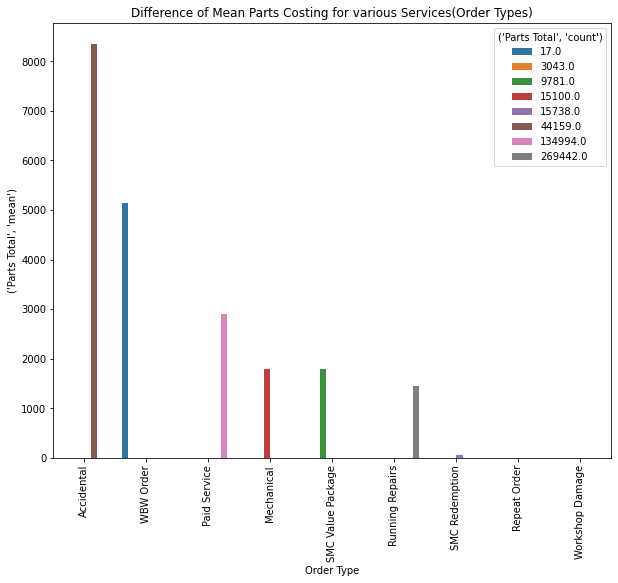

In [107]:
# Mean parts costing for Order types
df_service_parts = invoice_data_1[['Order Type','Parts Total']]
desc_df_service_parts = df_service_parts.groupby(['Order Type']).describe()

desc_df_service_parts.sort_values(by=('Parts Total',  'mean'),axis=0,ascending=False, inplace = True)
desc_df_service_parts.columns

plt.figure(figsize=(10,8))
chart_service_parts = sns.barplot(x= desc_df_service_parts.index , y = ('Parts Total',  'mean'), data= desc_df_service_parts ,hue= ('Parts Total',  'count'))
chart_service_parts.set_xticklabels(chart_service_parts.get_xticklabels(), rotation = 90)
plt.title('Difference of Mean Parts Costing for various Services(Order Types)')

Text(0.5, 1.0, 'Difference of Total Costing for various Services(Order Types)')

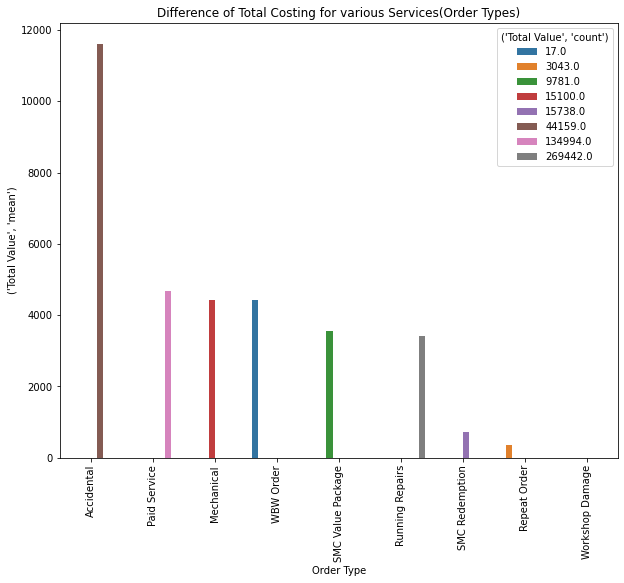

In [108]:
# total costing for Order types
df_service_cost = invoice_data_1[['Order Type','Total Value']]
desc_df_service_cost = df_service_cost.groupby(['Order Type']).describe()

desc_df_service_cost.sort_values(by=('Total Value',  'mean'),axis=0,ascending=False, inplace = True)
desc_df_service_cost.columns

plt.figure(figsize=(10,8))
chart_service_cost = sns.barplot(x= desc_df_service_cost.index , y = ('Total Value',  'mean'), data= desc_df_service_cost ,hue= ('Total Value',  'count'))
chart_service_cost.set_xticklabels(chart_service_cost.get_xticklabels(), rotation = 90)
plt.title('Difference of Total Costing for various Services(Order Types)')

In [0]:
# feature engineering - adding Year and Month column to check pattern(yearly and monthly)
invoice_data_1['Month of Order'] = invoice_data_1['Invoice_Date_Time'].dt.month
invoice_data_1['Year Of Order'] = invoice_data_1['Invoice_Date_Time'].dt.year

Text(0.5, 1.0, 'Average Visits Per Year')

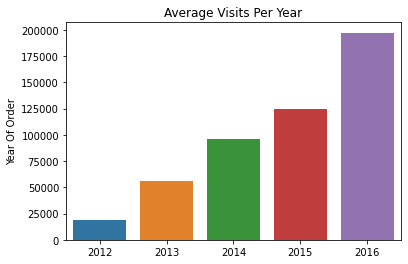

In [110]:
# average visits per year
year = invoice_data_1['Year Of Order'].value_counts()
sns.barplot(x = year.index , y = year)
plt.title('Average Visits Per Year')

Text(0.5, 1.0, 'Month wise distribution of Orders(Average Visit Per Month)')

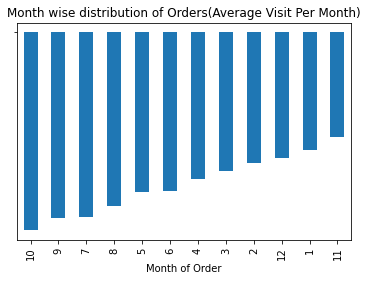

In [111]:
# montly pattern of orders
invoice_data_1['Month of Order'].value_counts().plot(kind='bar')
sns.barplot(x= invoice_data_1['Month of Order'].value_counts() )
plt.title('Month wise distribution of Orders(Average Visit Per Month)')

Text(0.5, 1.0, 'Average number of Services in a year')

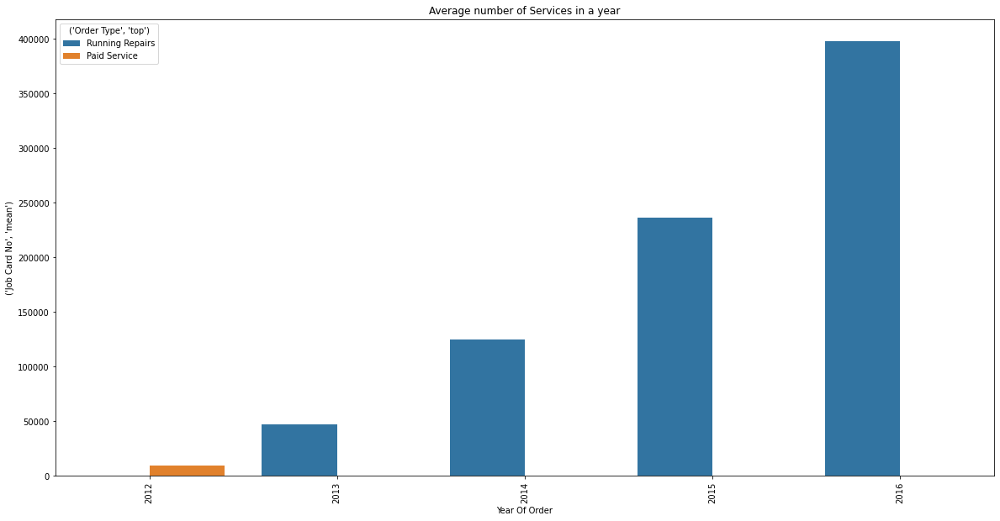

In [112]:
# Average number of services in a year
df_repairs = invoice_data_1[['Job Card No','Order Type','Year Of Order','Month of Order']]
df_desc_repair_year = df_repairs.groupby(['Year Of Order']).describe(include='all')
df_desc_repair_year

df_desc_repair_year.sort_values(by=('Job Card No',  'mean'), ascending=False, inplace = True)

plt.figure(figsize=(20,10))
sns.barplot(x = df_desc_repair_year.index , y = ('Job Card No',  'mean'), data = df_desc_repair_year, hue = ('Order Type', 'top') )
plt.xticks(rotation=90)
plt.title('Average number of Services in a year')

Text(0.5, 1.0, 'Average number of Services per Order Type')

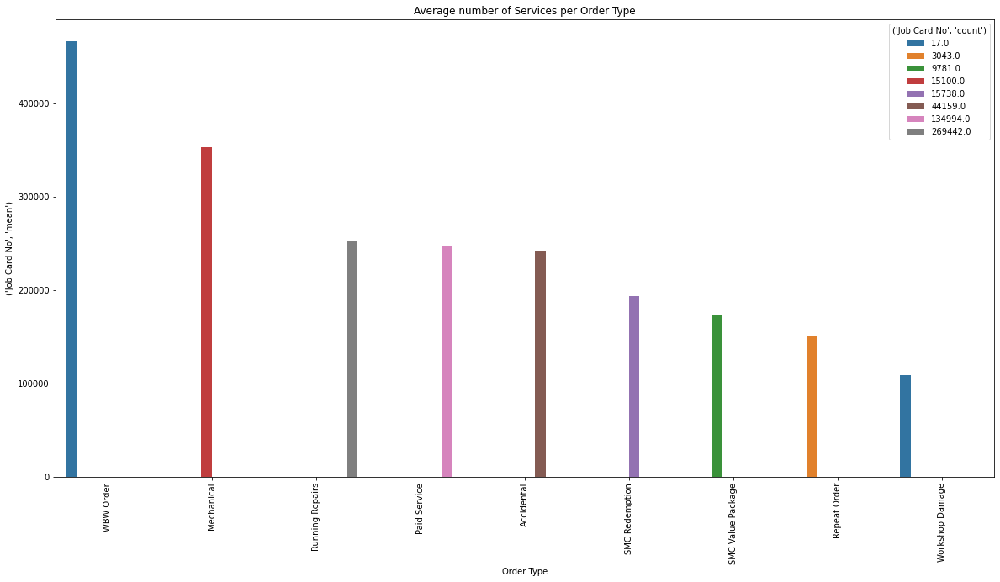

In [113]:
df_running_mean = df_repairs.groupby(['Order Type']).describe(include='all')

df_running_mean.sort_values(by=('Job Card No',  'mean'), ascending=False, inplace = True)
df_running_mean
plt.figure(figsize=(20,10))
sns.barplot(x = df_running_mean.index , y = ('Job Card No',  'mean'), data = df_running_mean, hue = ('Job Card No',  'count') )
plt.xticks(rotation=90)
plt.title('Average number of Services per Order Type')

Text(0.5, 1.0, 'Average number of Running Repiars Year per Year')

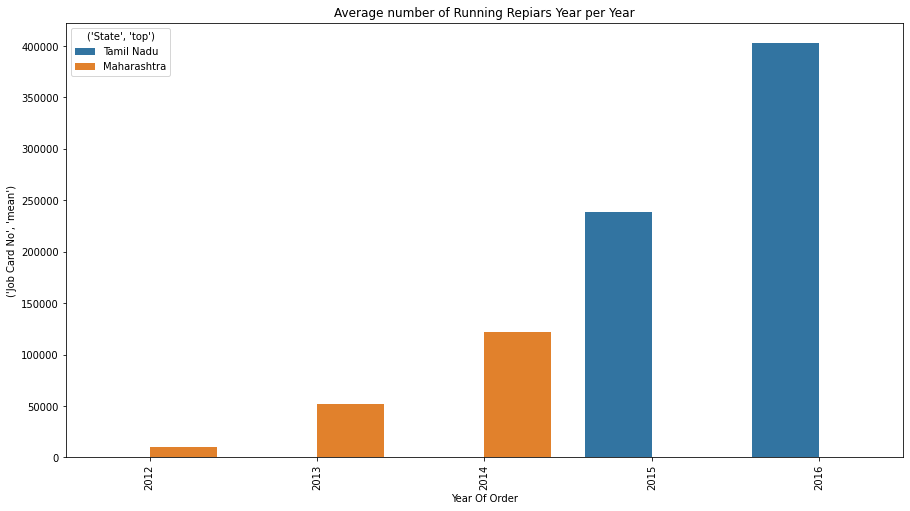

In [114]:
#average number of running repairs 
df_running = invoice_data_1[invoice_data_1['Order Type'] == 'Running Repairs'][['Job Card No','Order Type','State','Year Of Order','Month of Order']]
df_running_mean = df_running.groupby(['Year Of Order']).describe(include='all')
# df_running.shape
df_running_mean.sort_values(by=('Job Card No',  'mean'), ascending=False, inplace = True)
# df_running_mean
plt.figure(figsize=(15,8))
sns.barplot(x = df_running_mean.index , y = ('Job Card No',  'mean'), data = df_running_mean, hue = ('State',  'top') )
plt.xticks(rotation=90)
plt.title('Average number of Running Repiars Year per Year')

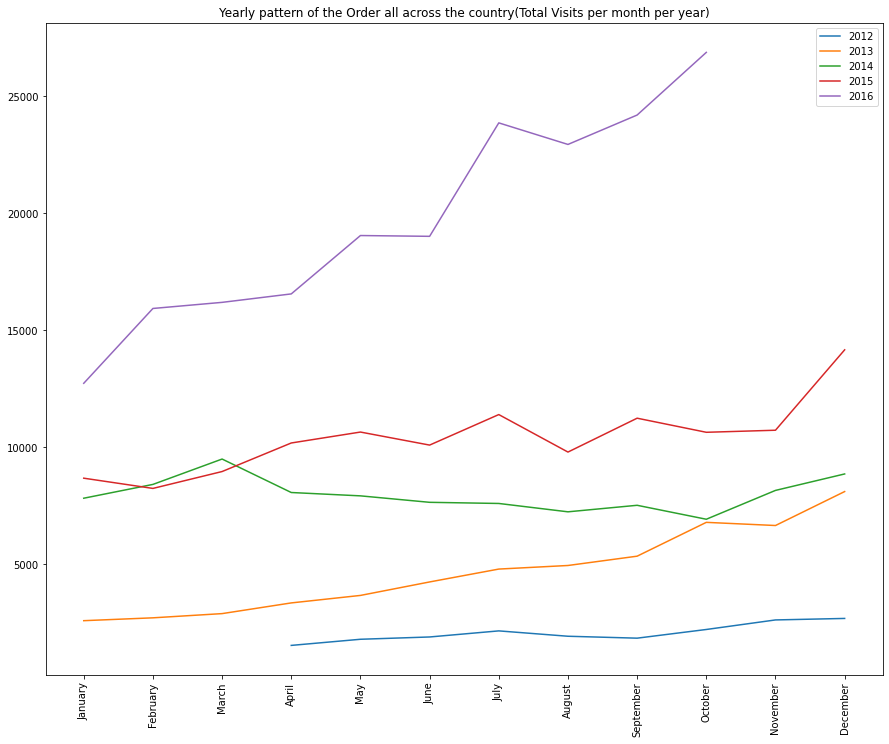

In [115]:
# yearly and montly pattern of orders 
df_year_month_total = invoice_data_1.groupby(['Year Of Order','Month of Order']).describe().unstack().iloc[:,:12]

year_2012 = df_year_month_total[df_year_month_total.index == 2012].values[0]
year_2013 = df_year_month_total[df_year_month_total.index == 2013].values[0]
year_2014 = df_year_month_total[df_year_month_total.index == 2014].values[0]
year_2015 = df_year_month_total[df_year_month_total.index == 2015].values[0]
year_2016 = df_year_month_total[df_year_month_total.index == 2016].values[0]

plt.figure(figsize=(15,12))

sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12] , y = year_2012 , label = '2012')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12] , y = year_2013,  label = '2013')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12] , y = year_2014,  label = '2014')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12] , y = year_2015,  label = '2015')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12] , y = year_2016,  label = '2016')
plt.legend()
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],['January','February','March','April','May','June','July','August','September','October','November','December'], rotation=90)
plt.title('Yearly pattern of the Order all across the country(Total Visits per month per year)')
plt.show()

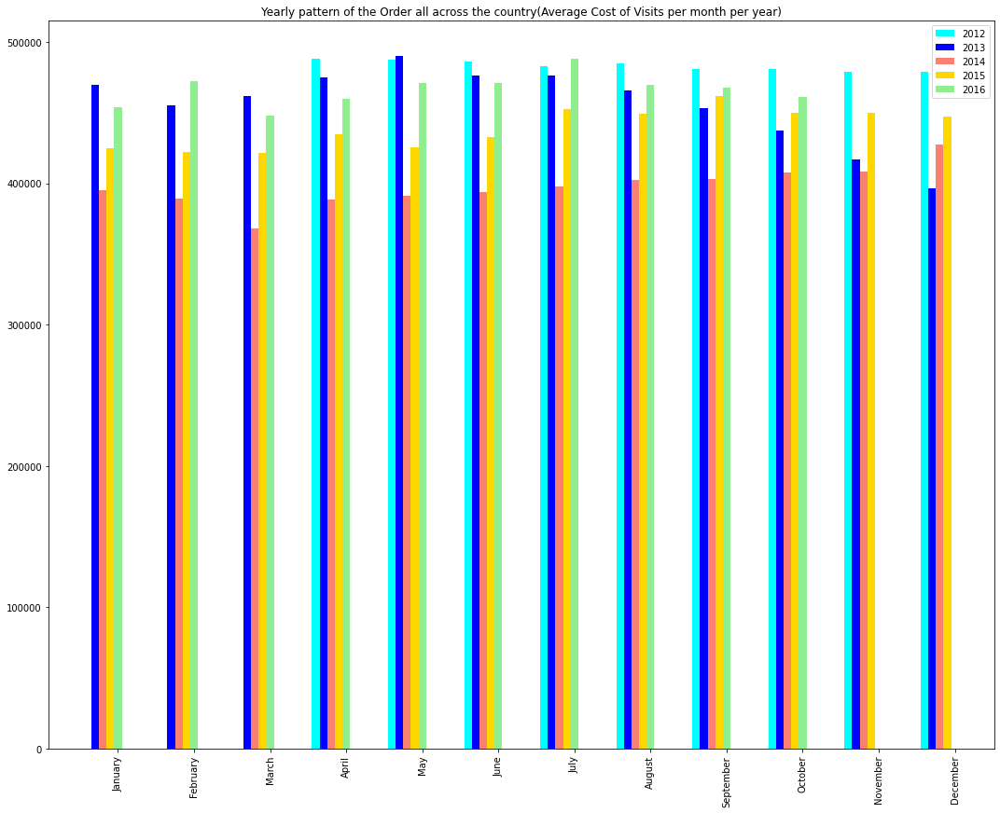

In [116]:
# yearly and montly pattern based on Average costs of visits
df_year_month_value_average = invoice_data_1.groupby(['Year Of Order','Month of Order']).describe().unstack().iloc[:,492:504]

year_2012 = df_year_month_value_average[df_year_month_value_average.index == 2012].values[0]
year_2013 = df_year_month_value_average[df_year_month_value_average.index == 2013].values[0]
year_2014 = df_year_month_value_average[df_year_month_value_average.index == 2014].values[0]
year_2015 = df_year_month_value_average[df_year_month_value_average.index == 2015].values[0]
year_2016 = df_year_month_value_average[df_year_month_value_average.index == 2016].values[0]

fig1, ax = plt.subplots(figsize=(15,12))

X = np.arange(12)
labels = ['January','February','March','April','May','June','July','August','September','October','November','December']
ax.bar(X + 0.00, year_2012, color = 'aqua', width = 0.10, label = '2012' , tick_label = labels)
ax.bar(X + 0.10, year_2013, color = 'blue', width = 0.10,label = '2013', tick_label = labels)
ax.bar(X + 0.20, year_2014, color = 'salmon', width = 0.10 , label = '2014', tick_label = labels)
ax.bar(X + 0.30, year_2015, color = 'gold', width = 0.10 , label = '2015' , tick_label = labels)
ax.bar(X + 0.40, year_2016, color = 'lightgreen', width = 0.10 ,label = '2016' , tick_label = labels)

ax.set_xticklabels(ax.xaxis.get_majorticklabels(),rotation=90)
fig1.tight_layout()
plt.legend()
plt.title('Yearly pattern of the Order all across the country(Average Cost of Visits per month per year)')
plt.show()

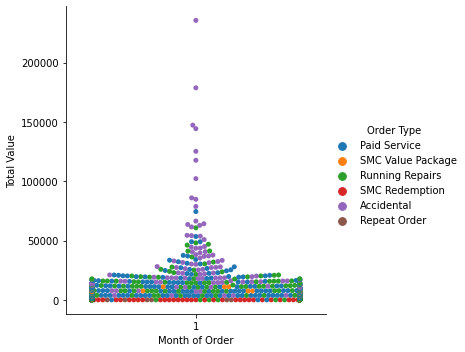

In [117]:
sns.catplot(x = 'Month of Order' , y = 'Total Value', hue='Order Type',kind='swarm', data = invoice_data_1.iloc[:2000])

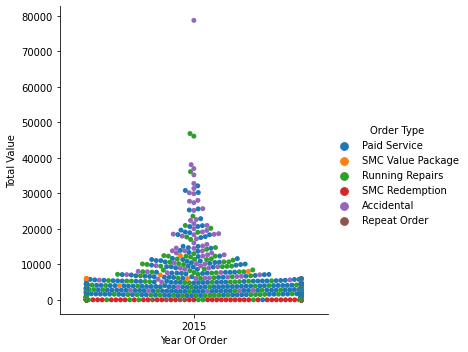

In [118]:
sns.catplot(x= 'Year Of Order' , y = 'Total Value', kind = 'swarm', hue='Order Type' , data = invoice_data_1.iloc[:1000])

###Invoice and JTD data

In [0]:
## No. of parts per invoice/order type/month/year/make / model/ state/ city

In [0]:
# Feature Engineering - adding columns of Invoice data and JTD data to get patterns
left = invoice_data_1[['Job Card No','Make','Model','Order Type','Labour Total','CITY','State','Month of Order','Year Of Order']]
right = jtd_data[['DBM Order','Order Quantity','Net value']]

df_parts_count = pd.merge(left ,right , how='inner',left_on=['Job Card No'], right_on=['DBM Order'])

#### Order Quantity (No. of parts) distribution

##### Average Number of Parts per Order Type

Text(0.5, 1.0, 'Average Number of parts used per Order type category.')

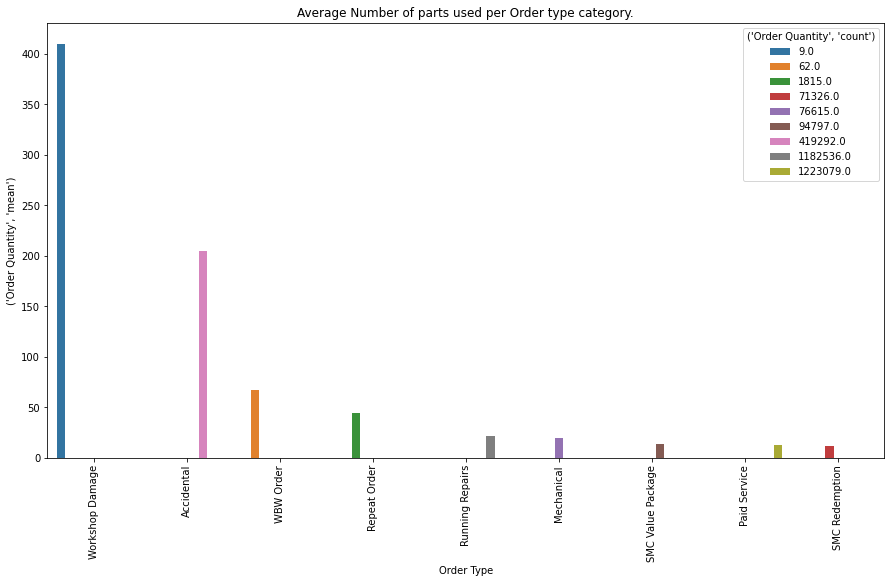

In [121]:
# No. of parts per order type
df_desc_order = df_parts_count.groupby(['Order Type']).describe()
df_desc_order.sort_values(by=('Order Quantity',  'mean'), axis=0,ascending=False, inplace=True)
df_desc_order.iloc[:,40:48]

plt.figure(figsize=(15,8))
sns.barplot(x=df_desc_order.index , y = ('Order Quantity', 'mean'), data = df_desc_order.iloc[:,40:48], hue=('Order Quantity', 'count'))
plt.xticks(rotation=90)
plt.title("Average Number of parts used per Order type category.")

##### Parts Utilization ( Make and Model wise)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]),
 <a list of 28 Text major ticklabel objects>)

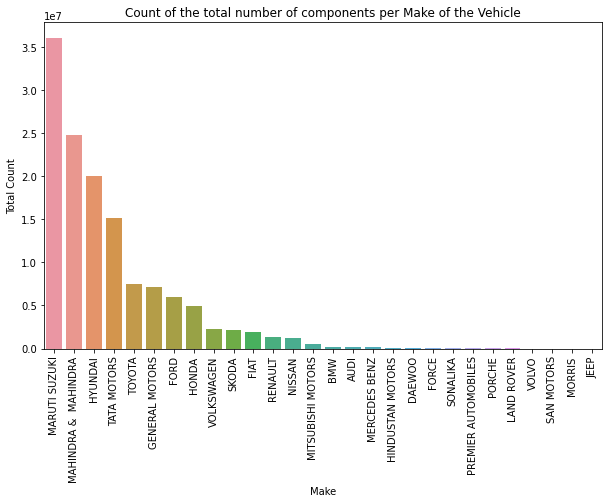

In [122]:
# 
total_parts_make = df_parts_count.groupby(['Make'])['Order Quantity'].apply(np.sum)
total_parts_make.sort_values(ascending=False,inplace=True)

plt.figure(figsize=(10,6))
sns.barplot(x = total_parts_make.index, y = total_parts_make.values.tolist())
plt.ylabel('Total Count')
plt.title('Count of the total number of components per Make of the Vehicle')
plt.xticks(rotation=90)

Text(0.5, 1.0, 'Average number of parts per Job Card(Invoice) per Make of the Vehicle')

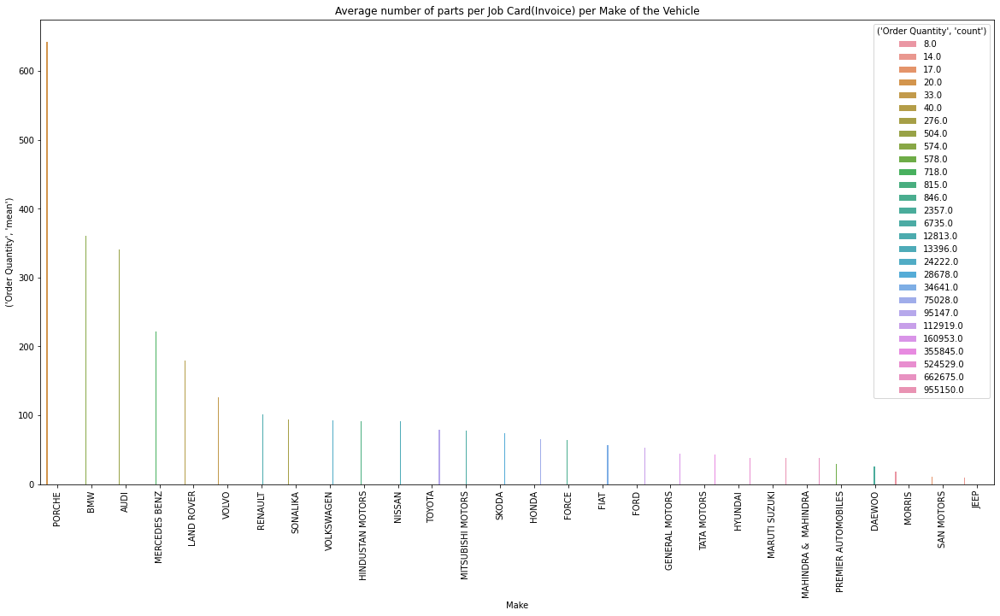

In [123]:
# no of parts per make
df_desc_make = df_parts_count.groupby(['Make']).describe()
df_desc_make_mean = df_desc_make.iloc[:,40:48]
df_desc_make_mean.columns
df_desc_make_mean.sort_values(by=('Order Quantity',  'mean'), ascending=False, inplace = True)

plt.figure(figsize=(20,10))
sns.barplot(x = df_desc_make_mean.index , y = ('Order Quantity',  'mean'), data = df_desc_make_mean, hue = ('Order Quantity', 'count') )
plt.xticks(rotation=90)
plt.title('Average number of parts per Job Card(Invoice) per Make of the Vehicle')

Text(0.5, 1.0, 'Average number of parts per Job Card(Invoice) per Model of the Vehicle')

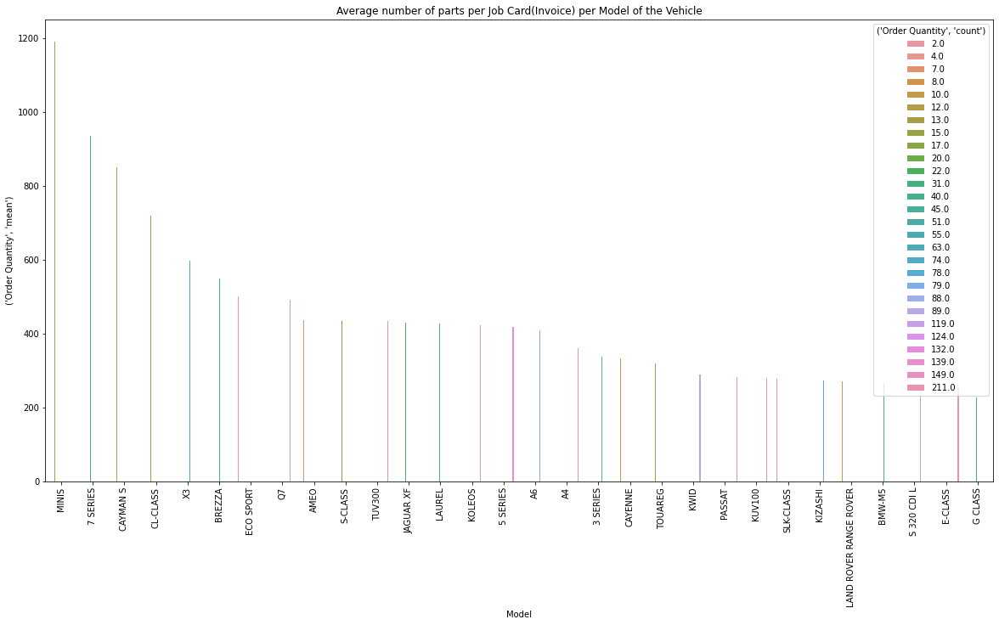

In [124]:
# no of parts per model
df_desc_model = df_parts_count.groupby(['Model']).describe()
df_desc_model_mean = df_desc_model.iloc[:,40:48]
# df_desc_model_mean.columns
df_desc_model_mean.sort_values(by=('Order Quantity',  'mean'), ascending=False, inplace = True)
# df_desc_model_mean.iloc[:30,:]
plt.figure(figsize=(20,10))
sns.barplot(x = df_desc_model_mean.iloc[:30,:].index , y = ('Order Quantity',  'mean'), data = df_desc_model_mean.iloc[:30,:], hue = ('Order Quantity', 'count') )
plt.xticks(rotation=90)
plt.title('Average number of parts per Job Card(Invoice) per Model of the Vehicle')

##### Mean number of parts used(State and city wise distribution) 

Text(0.5, 1.0, 'Average number of parts used per Job Card(Invoice) per State')

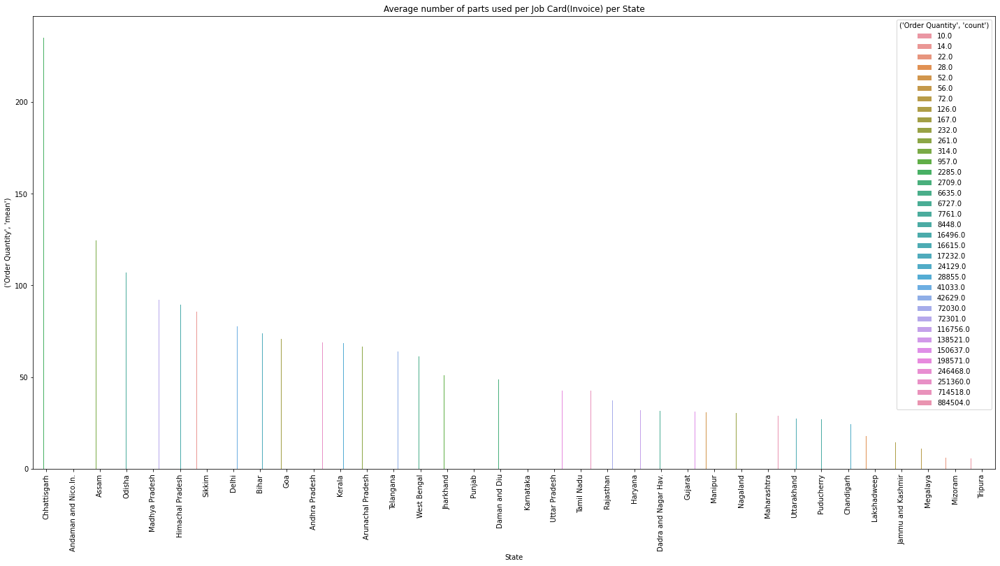

In [125]:
# no of parts per state
df_desc_state = df_parts_count.groupby(['State']).describe()
df_desc_state_mean = df_desc_state.iloc[:,40:48]
# df_desc_model_mean.columns
df_desc_state_mean.sort_values(by=('Order Quantity',  'mean'), ascending=False, inplace = True)

fig1, ax = plt.subplots(figsize=(20,10))
sns.barplot(x = df_desc_state_mean.index , y = ('Order Quantity',  'mean'), data = df_desc_state_mean, hue = ('Order Quantity', 'count') )
fig1.tight_layout()
plt.xticks(rotation=90)
plt.title('Average number of parts used per Job Card(Invoice) per State')


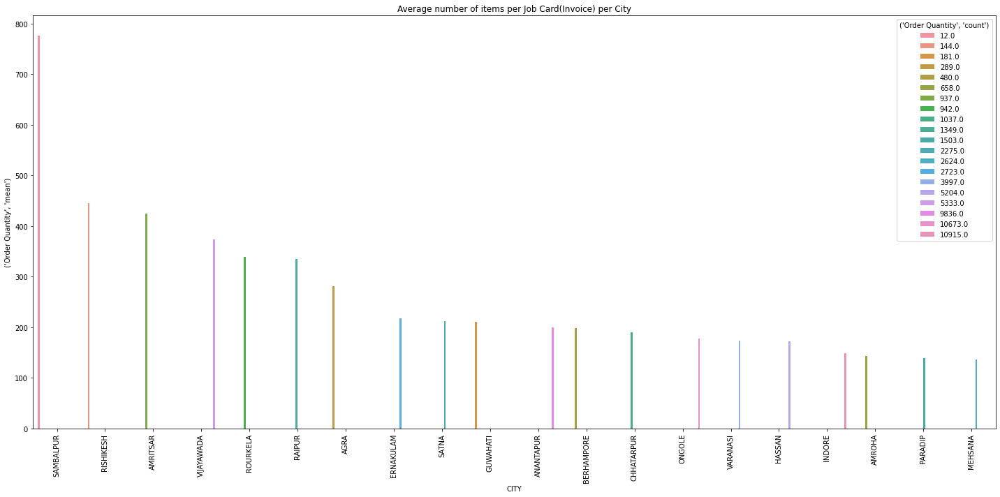

In [126]:
# no of parts per make
df_desc_city = df_parts_count.groupby(['CITY']).describe()
df_desc_city_mean = df_desc_city.iloc[:,40:48]
# df_desc_model_mean.columns
df_desc_city_mean.sort_values(by=('Order Quantity',  'mean'), ascending=False, inplace = True)

fig1, ax = plt.subplots(figsize=(20,10))
sns.barplot(x = df_desc_city_mean.iloc[:20,:].index , y = ('Order Quantity',  'mean'), data = df_desc_city_mean.iloc[:20,:], hue = ('Order Quantity', 'count') )

plt.xticks(rotation=90)
plt.title('Average number of items per Job Card(Invoice) per City')
fig1.tight_layout()

##### Parts Utilization ( year and month wise)

Text(0.5, 1.0, 'Average Number of parts used per Invoice per Year.')

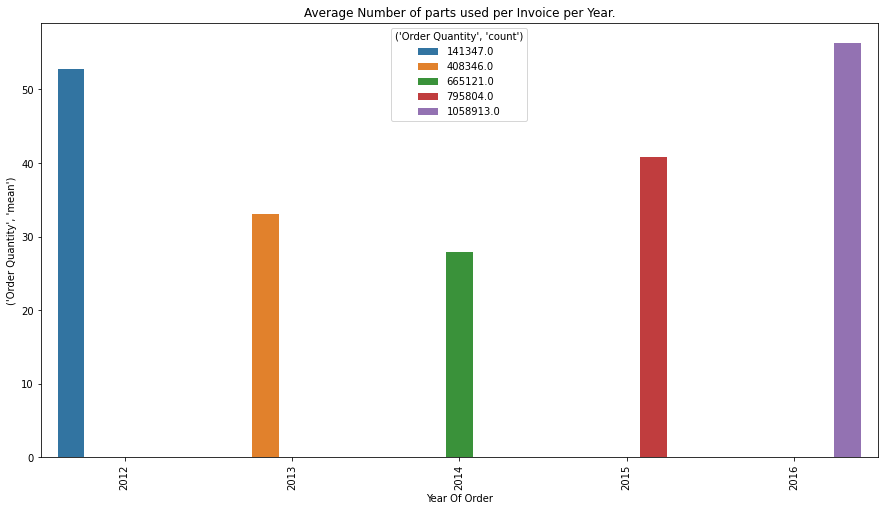

In [127]:
# no of parts used per year
df_desc_year = df_parts_count.groupby(['Year Of Order']).describe()
df_desc_year.iloc[:,32:40]

# fig, ax = plt.subplots(figsize=(15,8))
plt.figure(figsize=(15,8))
sns.barplot(x=df_desc_year.index , y = ('Order Quantity', 'mean'), data = df_desc_year.iloc[:,32:40], hue=('Order Quantity', 'count'))
plt.xticks(rotation=90)
plt.title("Average Number of parts used per Invoice per Year.")

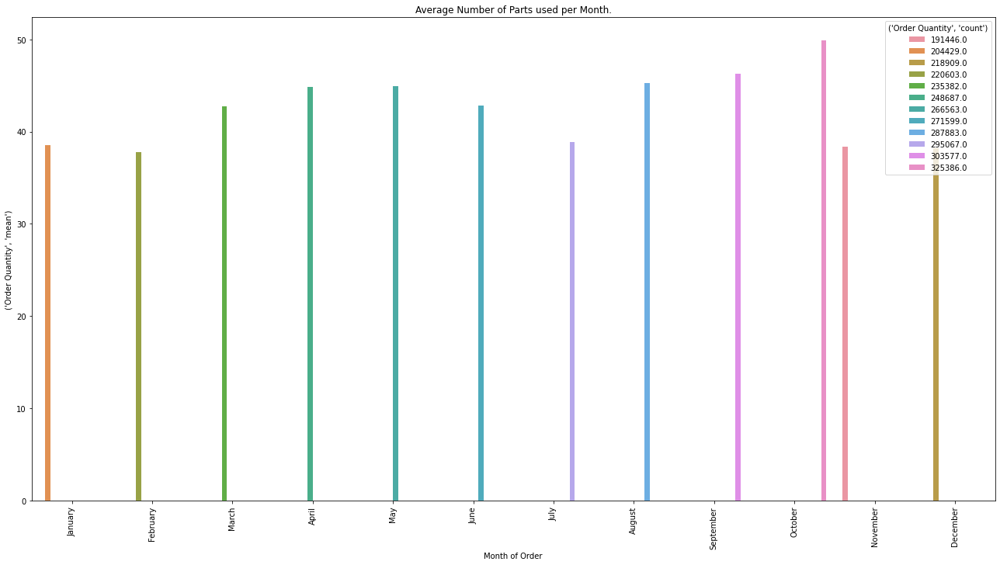

In [128]:
# mean no of parts per month(mean)
df_desc_month = df_parts_count.groupby(['Month of Order']).describe()
df_desc_month.iloc[:,32:40]

fig1, axes = plt.subplots(figsize=(18,10))

g = sns.barplot(x=df_desc_month.index , y = ('Order Quantity', 'mean'), data = df_desc_month.iloc[:,32:40], hue=('Order Quantity', 'count'))

labels = ['January','February','March','April','May','June','July','August','September','October','November','December']

g.set(xticklabels=labels)

plt.xticks(rotation=90)
fig1.tight_layout()
plt.title("Average Number of Parts used per Month.")
plt.show()

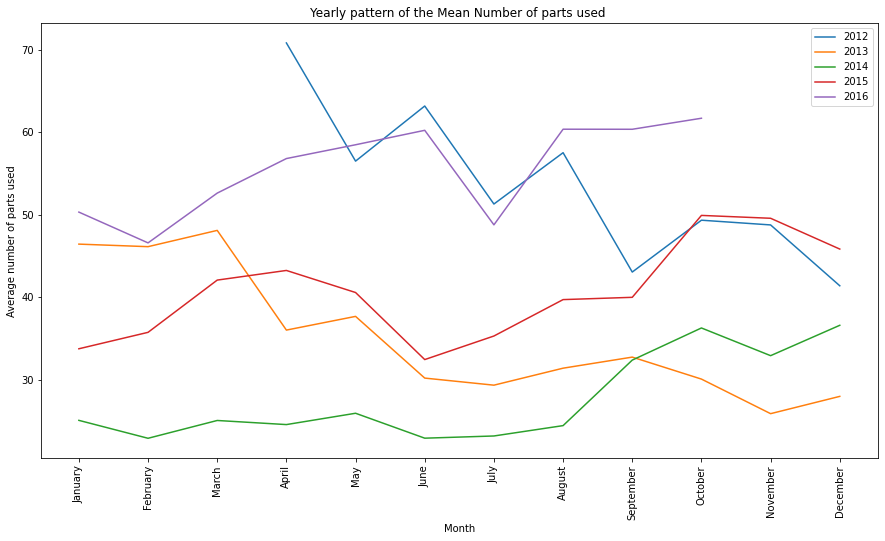

In [129]:
# no of parts per year/month
df_desc_year_month = df_parts_count.groupby(['Year Of Order', 'Month of Order']).describe().unstack().iloc[:,300:312]

year_2012 = df_desc_year_month[df_desc_year_month.index == 2012].values[0]
year_2013 = df_desc_year_month[df_desc_year_month.index == 2013].values[0]
year_2014 = df_desc_year_month[df_desc_year_month.index == 2014].values[0]
year_2015 = df_desc_year_month[df_desc_year_month.index == 2015].values[0]
year_2016 = df_desc_year_month[df_desc_year_month.index == 2016].values[0]

plt.figure(figsize=(15,8))
labels = ['January','February','March','April','May','June','July','August','September','October','November','December']

sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12] , y = year_2012, label ='2012')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12], y = year_2013, label = '2013')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12], y = year_2014, label = '2014')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12], y = year_2015, label = '2015')
sns.lineplot(x = [1,2,3,4,5,6,7,8,9,10,11,12], y = year_2016, label = '2016')
plt.xlabel('Month')
plt.ylabel('Average number of parts used')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],labels, rotation=90)
plt.title('Yearly pattern of the Mean Number of parts used ')
plt.show()


#### Cost of Parts distribution

Text(0.5, 1.0, 'Average Cost of Parts used per Order type category.')

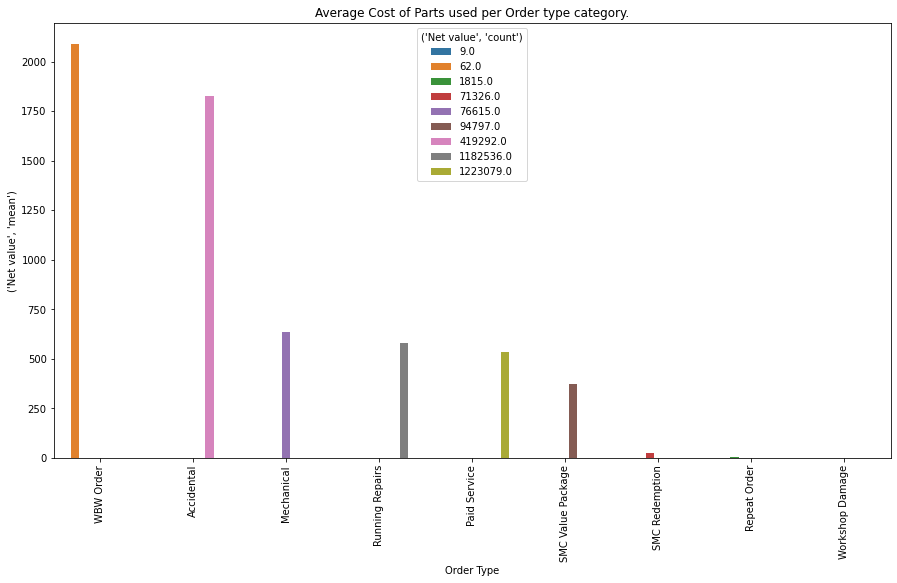

In [130]:
# mean net value of parts per order type

df_desc_order_value = df_parts_count.groupby(['Order Type']).describe()
df_desc_order_value.sort_values(by=('Net value',  'mean'), axis=0,ascending=False, inplace=True)
df_desc_order_value

plt.figure(figsize=(15,8))
sns.barplot(x=df_desc_order_value.index , y = ('Net value', 'mean'), data = df_desc_order_value.iloc[:,48:56], hue=('Net value', 'count'))
plt.xticks(rotation=90)
plt.title("Average Cost of Parts used per Order type category.")

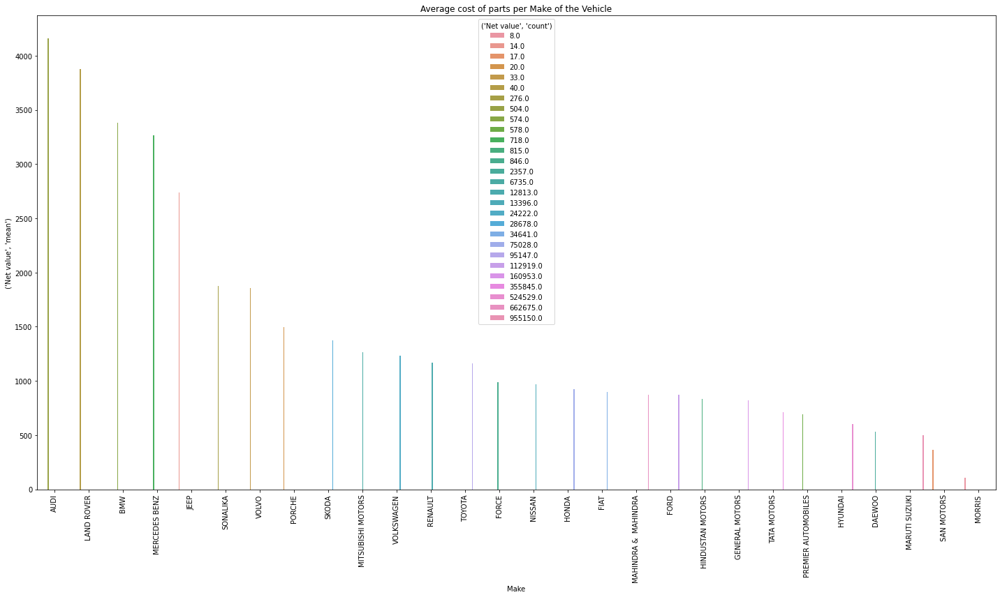

In [131]:
# cost of parts per make
df_desc_make_cost = df_parts_count.groupby(['Make']).describe()
df_desc_make_mean_cost = df_desc_make_cost.iloc[:,48:56]
df_desc_make_mean_cost.columns
df_desc_make_mean_cost.sort_values(by=('Net value',  'mean'), ascending=False, inplace = True)

fig1, ax = plt.subplots(figsize=(20,12))
sns.barplot(x = df_desc_make_mean_cost.index , y = ('Net value',  'mean'), data = df_desc_make_mean_cost, hue = ('Net value', 'count') )
plt.xticks(rotation=90)
plt.title('Average cost of parts per Make of the Vehicle')
fig1.tight_layout()

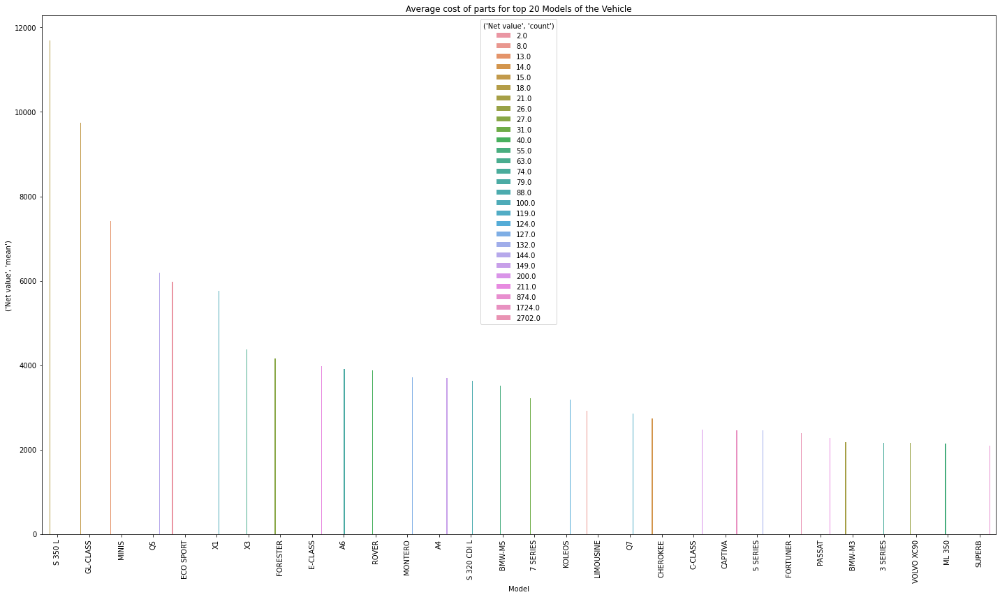

In [132]:
# cost of parts per model
df_desc_model_cost = df_parts_count.groupby(['Model']).describe()
df_desc_model_mean_cost = df_desc_model_cost.iloc[:,48:56]
df_desc_model_mean_cost.columns
df_desc_model_mean_cost.sort_values(by=('Net value',  'mean'), ascending=False, inplace = True)

fig1, ax = plt.subplots(figsize=(20,12))
sns.barplot(x = df_desc_model_mean_cost.iloc[:30,:].index , y = ('Net value',  'mean'), data = df_desc_model_mean_cost.iloc[:30,:], hue = ('Net value', 'count') )
plt.xticks(rotation=90)
plt.title('Average cost of parts for top 20 Models of the Vehicle')
fig1.tight_layout()

#### Labour Cost distribution

Text(0.5, 1.0, 'Average labour Costs per Order type category.')

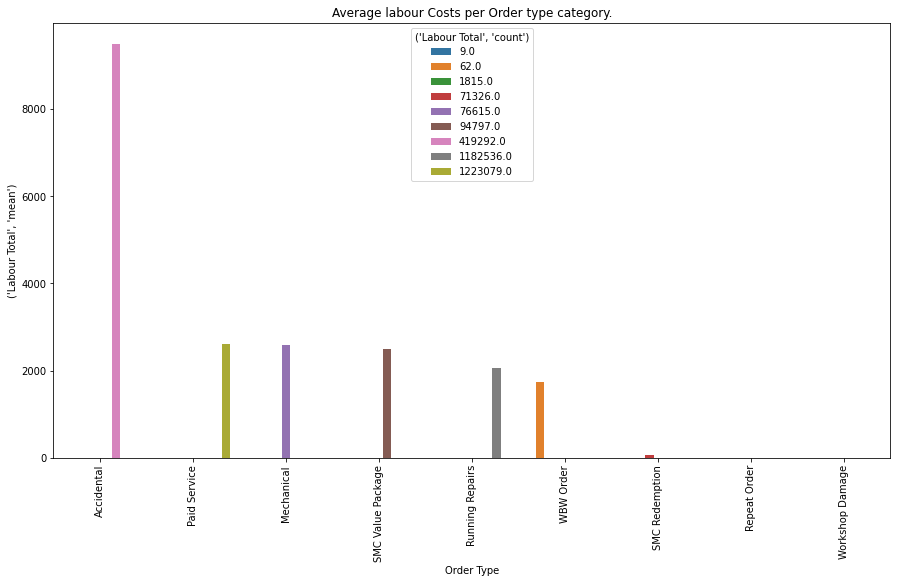

In [133]:
# Mean Labour Cost per Order Type

df_desc_order_labour = df_parts_count.groupby(['Order Type']).describe()
df_desc_order_labour.sort_values(by=('Labour Total',  'mean'), axis=0,ascending=False, inplace=True)
df_desc_order_labour = df_desc_order_labour.iloc[:,8:16]
df_desc_order_labour

plt.figure(figsize=(15,8))
sns.barplot(x=df_desc_order_labour.index , y = ('Labour Total', 'mean'), data = df_desc_order_labour, hue=('Labour Total', 'count'))
plt.xticks(rotation=90)
plt.title("Average labour Costs per Order type category.")

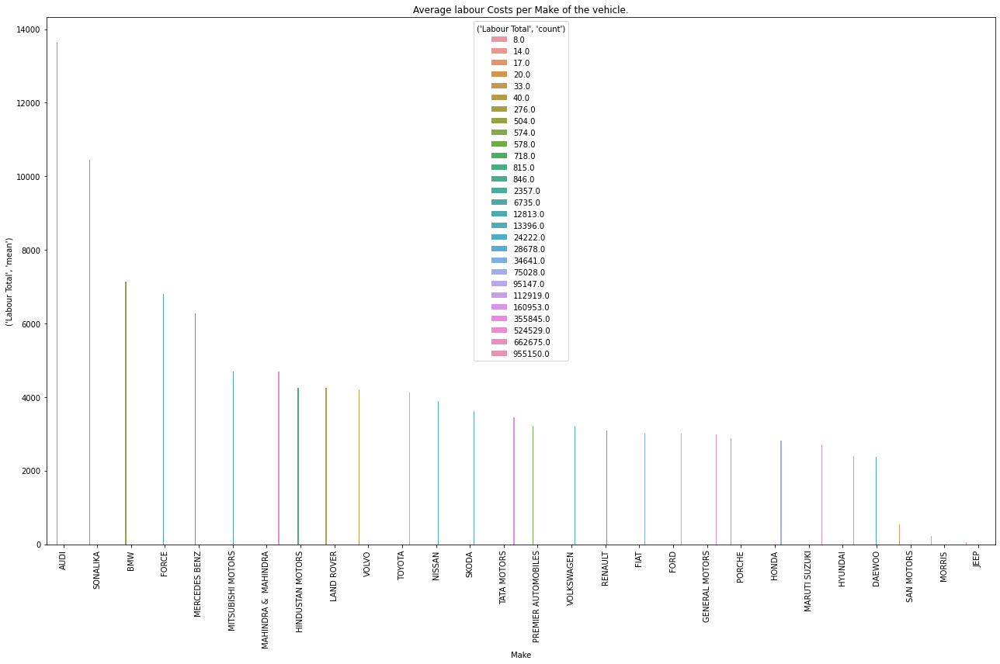

In [134]:
# Mean Labour Cost per Make

df_desc_labour_make = df_parts_count.groupby(['Make']).describe()
df_desc_labour_make.sort_values(by=('Labour Total',  'mean'), axis=0,ascending=False, inplace=True)
df_desc_labour_make = df_desc_labour_make.iloc[:,8:16]
df_desc_labour_make

fig1, axes = plt.subplots(figsize=(18,12))
sns.barplot(x=df_desc_labour_make.index , y = ('Labour Total', 'mean'), data = df_desc_labour_make, hue=('Labour Total', 'count'))
plt.xticks(rotation=90)

plt.title("Average labour Costs per Make of the vehicle.")
fig1.tight_layout()

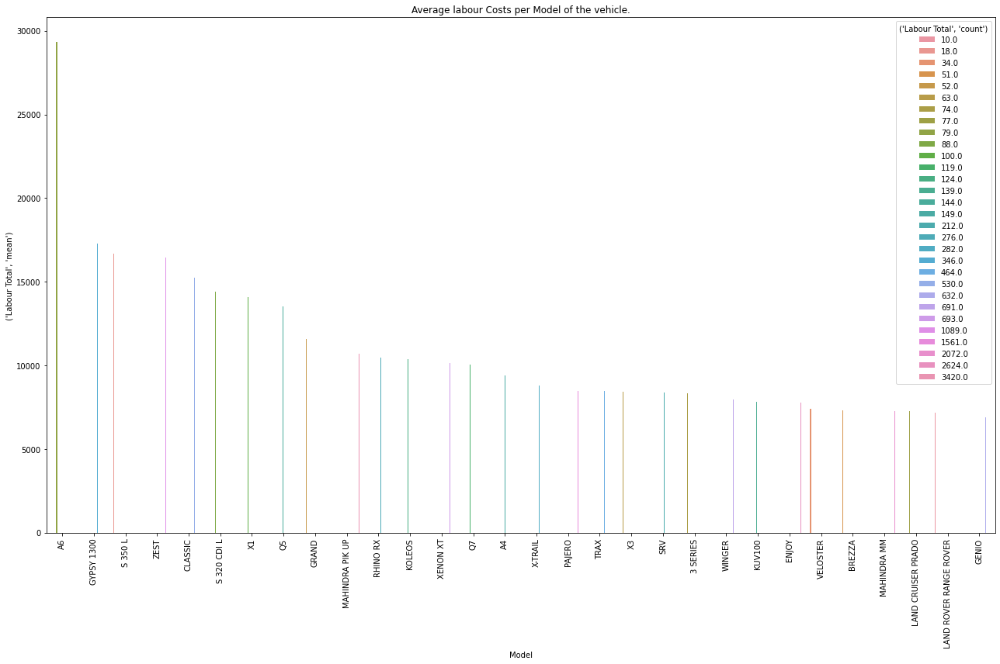

In [135]:
# Mean Labour Cost per Model

df_desc_labour_model = df_parts_count.groupby(['Model']).describe()
df_desc_labour_model.sort_values(by=('Labour Total',  'mean'), axis=0,ascending=False, inplace=True)
df_desc_labour_model = df_desc_labour_model.iloc[:30,8:16]
df_desc_labour_model

fig1, axes = plt.subplots(figsize=(18,12))
sns.barplot(x=df_desc_labour_model.index , y = ('Labour Total', 'mean'), data = df_desc_labour_model, hue=('Labour Total', 'count'))
plt.xticks(rotation=90)

plt.title("Average labour Costs per Model of the vehicle.")
fig1.tight_layout()

## Market Segmentation

In [137]:
customer_data.head()

,Business Partner,Customer No.,Partner Type,Data Origin,Title
0,31,1,1.0,Z001,2.0
1,32,2,1.0,Z005,2.0
2,34,4,1.0,Z005,2.0
3,35,5,1.0,Z005,2.0
4,42,7,1.0,Z008,2.0


In [0]:
customer_data[['Partner Type','Title']] = customer_data[['Partner Type','Title']].astype('int')

In [0]:
## drop duplicates customer id from the records
filtered_data = invoice_data_1[['State','Customer No.']].drop_duplicates()

### RFM using K-Means ( Customer Segmentation)

In [0]:
rfm_all = invoice_data_1[['Customer No.','Invoice No','Invoice_Date_Time','Total Value']]

rfm_all['Invoice_Date_Time'] = pd.to_datetime(rfm_all['Invoice_Date_Time'])

#### Calculate recency

In [0]:
tx_user = pd.DataFrame(rfm_all['Customer No.'].unique())
tx_user.columns = ['Customer No.']
# get the max purchase date of each customer and create a dataframe with it
tx_max_purchase = rfm_all.groupby('Customer No.').Invoice_Date_Time.max().reset_index()
tx_max_purchase.columns = ['Customer No.','MaxPurchaseDate']

#we take our observation point as the max invoice date in our dataset
tx_max_purchase['Recency'] = (tx_max_purchase['MaxPurchaseDate'].max() - tx_max_purchase['MaxPurchaseDate']).dt.days

In [0]:
tx_user = pd.merge(left = tx_user , right = tx_max_purchase[['Customer No.','Recency']], on = 'Customer No.')

Text(0.5, 1.0, 'Distribution Of Recency')

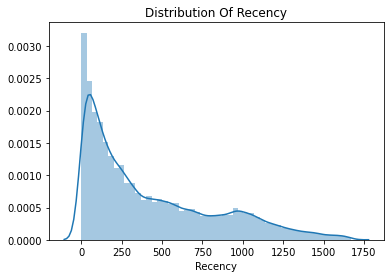

In [144]:
sns.distplot(tx_user['Recency'],hist=True,kde = True)
plt.title('Distribution Of Recency')

In [0]:
# we'll apply K-means clustering to assign a recency score
# getting the number of clusters using elbow method
from sklearn.cluster import KMeans

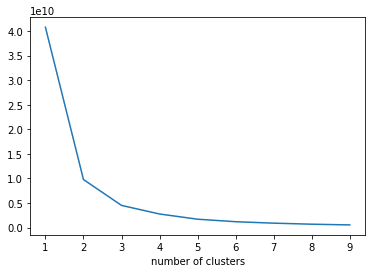

In [146]:
sse = {}
tx_recency = tx_user[['Recency']]
for k in range(1,10):
  kmeans = KMeans(n_clusters=k , max_iter= 500).fit(tx_recency)
  tx_recency['clusters'] = kmeans.labels_
  sse[k] = kmeans.inertia_
plt.figure()
plt.plot(list(sse.keys()),list(sse.values()))
plt.xlabel("number of clusters")
plt.show()

In [0]:
# we'll take number of clusters as 4

kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user[['Recency']])
tx_user['RecencyCluster'] = kmeans.predict(tx_user[['Recency']])

In [148]:
#function for ordering cluster numbers
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

tx_user = order_cluster('RecencyCluster','Recency', tx_user, False)
tx_user.head()

,Customer No.,Recency,RecencyCluster
0,67849,668,1
1,41390,667,1
2,84629,667,1
3,56291,667,1
4,84587,667,1


In [149]:
tx_user.groupby(['RecencyCluster']).describe()
# we see that the customers in Cluster 3 are most recent ones while those in Cluster 0 are most inactive ones.

Recency                           ...                        
                   count         mean         std  ...     50%     75%     max
RecencyCluster                                     ...                        
0                23725.0  1276.361138  159.858196  ...  1237.0  1389.0  1673.0
1                43001.0   863.331690  121.912062  ...   868.0   969.0  1068.0
2                60107.0   449.980352  108.441921  ...   444.0   541.0   656.0
3               126640.0   110.626769   80.055871  ...    97.0   173.0   280.0

[4 rows x 8 columns]

#### Calculate frequency

Text(0.5, 1.0, 'Distribution Of Frequency')

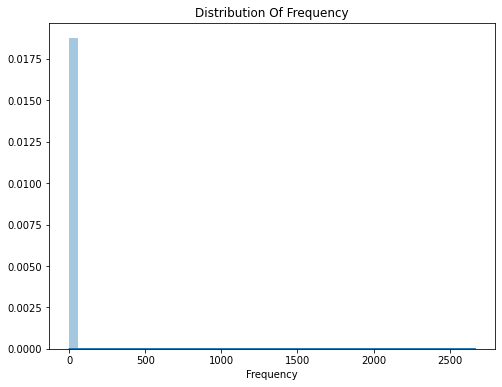

In [150]:
tx_frequency = rfm_all.groupby(['Customer No.'])['Invoice_Date_Time'].count().reset_index()
tx_frequency.columns = ['Customer No.','Frequency']
tx_user = pd.merge(left= tx_user, right = tx_frequency, on = 'Customer No.')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_user['Frequency'], hist= True , kde= True)
plt.title('Distribution Of Frequency')

In [151]:
#k-means
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user[['Frequency']])
tx_user['FrequencyCluster'] = kmeans.predict(tx_user[['Frequency']])

#order the frequency cluster
tx_user = order_cluster('FrequencyCluster', 'Frequency',tx_user,True)

#see details of each cluster
tx_user.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,235550.0,1.504203,0.832583,1.0,1.0,1.0,2.0,4.0
1,17915.0,7.384929,4.755479,5.0,5.0,6.0,8.0,157.0
2,7.0,429.571429,161.590900,251.0,328.5,360.0,525.5,688.0
3,1.0,2668.000000,NaN,2668.0,2668.0,2668.0,2668.0,2668.0


#### Calculate Revenue

Text(0.5, 1.0, 'Distribution Of Revenue')

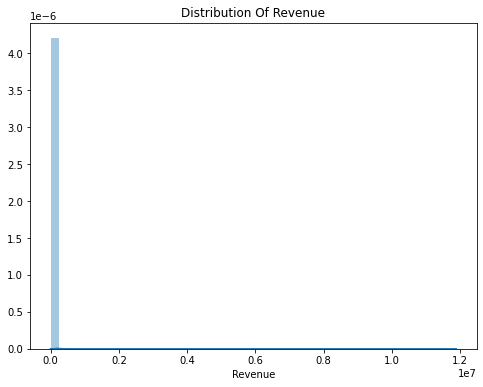

In [152]:
## Revenue
# tx_revenue = rfm_all[['Total Value']]
tx_revenue = rfm_all.groupby(['Customer No.'])['Total Value'].sum().reset_index()
tx_revenue.columns = ['Customer No.','Revenue']
tx_user = pd.merge(left= tx_user, right = tx_revenue, on = 'Customer No.')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_user['Revenue'], hist= True , kde= True)
plt.title('Distribution Of Revenue')

In [153]:
#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user[['Revenue']])
tx_user['RevenueCluster'] = kmeans.predict(tx_user[['Revenue']])


#order the cluster numbers
tx_user = order_cluster('RevenueCluster', 'Revenue',tx_user,True)

#show details of the dataframe
tx_user.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,247902.0,6.768114e+03,7197.979051,0.000000e+00,2.846875e+03,4.418122e+03,8.836243e+03,4.527655e+04
1,5556.0,8.360218e+04,53717.043860,4.529173e+04,5.320226e+04,6.588220e+04,9.142809e+04,7.413375e+05
2,14.0,1.487658e+06,576207.324543,8.545627e+05,1.014913e+06,1.427024e+06,1.633583e+06,2.872595e+06
3,1.0,1.188277e+07,NaN,1.188277e+07,1.188277e+07,1.188277e+07,1.188277e+07,1.188277e+07


In [154]:
# calculate the overall score
tx_user['OverallScore'] = tx_user['RecencyCluster'] + tx_user['FrequencyCluster'] + tx_user['RevenueCluster']
tx_user.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()
# customer with score of 9 is the best customer whereas customer with score of is the  worst

,Recency,Frequency,Revenue
OverallScore,,,
0,1277.458108,1.367989,4.876364e+03
1,873.300567,1.588979,5.753585e+03
2,471.779039,1.711052,7.101933e+03
3,128.287665,1.723790,7.990137e+03
4,149.437756,6.883383,3.182204e+04
5,122.748349,12.970938,8.522500e+04
6,124.750000,105.250000,1.514823e+06
7,78.000000,429.571429,1.660379e+06
9,48.000000,2668.000000,1.188277e+07


In [0]:
# name these scores as , HIgh(6+), Mid (3-5), Low(0-2)
tx_user['Segment'] = 'Low-Value'
tx_user.loc[tx_user['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_user.loc[tx_user['OverallScore']>5,'Segment'] = 'High-Value' 

In [156]:
tx_user.head()

,Customer No.,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment
0,67849,668,1,5,1,74525.25,1,3,Mid-Value
1,1026,661,1,18,1,97036.72,1,3,Mid-Value
2,28350,660,1,5,1,49425.83,1,3,Mid-Value
3,33650,657,1,11,1,127720.48,1,3,Mid-Value
4,27163,668,1,5,1,54912.58,1,3,Mid-Value


(-0.1, 3500000.0)

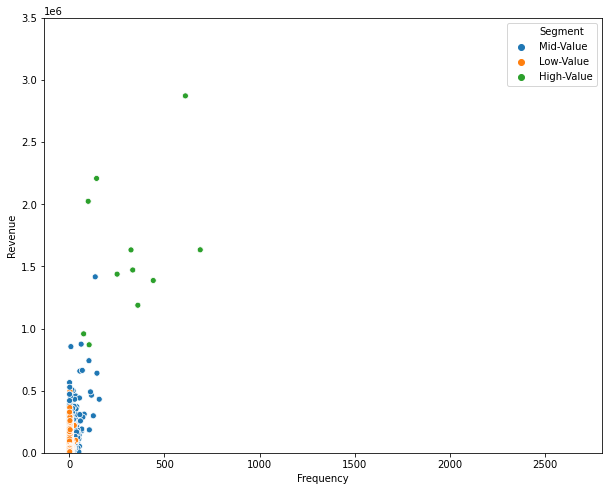

In [157]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Frequency', y = 'Revenue', data = tx_user, hue='Segment')
plt.ylim([-0.1,3500000])

(-0.1, 4000000.0)

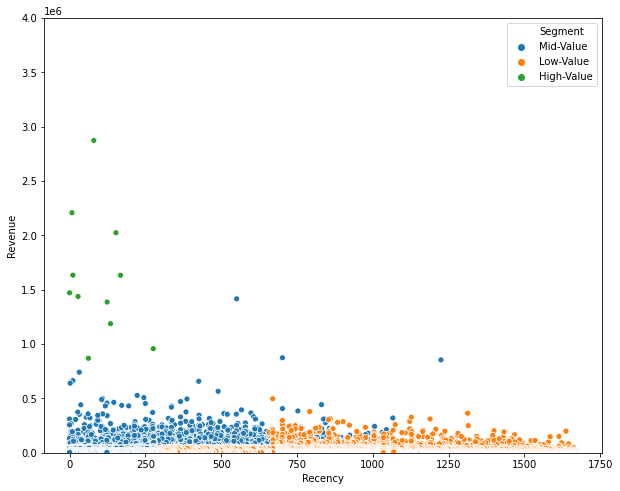

In [158]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Revenue', data = tx_user, hue='Segment')
plt.ylim([-0.1,4000000])

(-0.1, 1000.0)

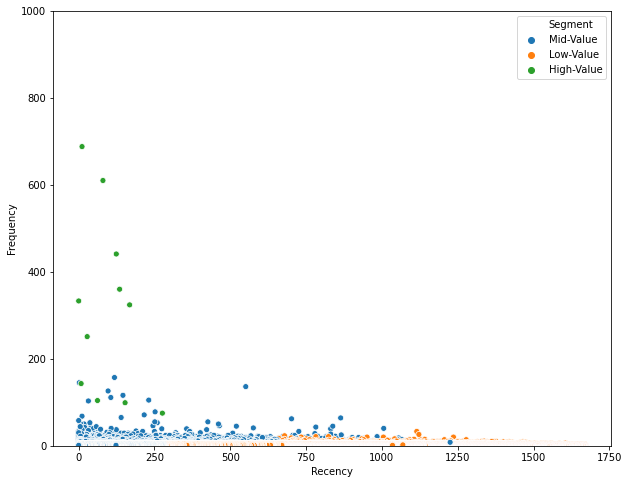

In [159]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Frequency', data = tx_user, hue='Segment')
plt.ylim([-0.1,1000])

#### Calculate RFM state wise

In [0]:
rfm_state = invoice_data_1[['State','Invoice No','Invoice_Date_Time','Total Value']]

rfm_state['Invoice_Date_Time'] = pd.to_datetime(rfm_state['Invoice_Date_Time'])

In [0]:
# calculate recency
tx_state = pd.DataFrame(rfm_state['State'].unique())
tx_state.columns = ['State']
# get the max purchase date of each customer and create a dataframe with it
tx_max_state_purchase = rfm_state.groupby('State').Invoice_Date_Time.max().reset_index()
tx_max_state_purchase.columns = ['State','MaxPurchaseDate']


In [0]:
#we take our observation point as the max invoice date in our dataset
tx_max_state_purchase['Recency'] = (tx_max_state_purchase['MaxPurchaseDate'].max() - tx_max_state_purchase['MaxPurchaseDate']).dt.days

tx_state = pd.merge(left = tx_state , right = tx_max_state_purchase[['State','Recency']], on = 'State')

Text(0.5, 1.0, 'Statewise Distribution Of Recency')

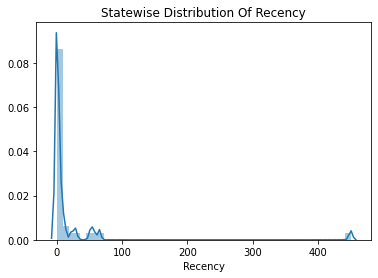

In [163]:
sns.distplot(tx_state['Recency'],hist=True,kde = True)
plt.title('Statewise Distribution Of Recency')

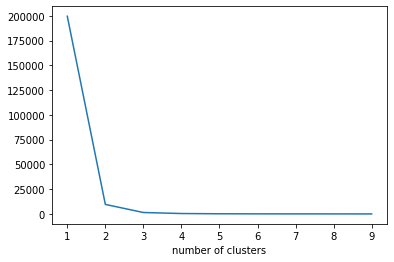

In [164]:
# we'll apply K-means clustering to assign a recency score
# getting the number of clusters using elbow method

sse_state = {}
tx_state_recency = tx_state[['Recency']]
for k in range(1,10):
  kmeans = KMeans(n_clusters=k , max_iter= 500).fit(tx_state_recency)
  tx_state_recency['clusters'] = kmeans.labels_
  sse_state[k] = kmeans.inertia_
plt.figure()
plt.plot(list(sse_state.keys()),list(sse_state.values()))
plt.xlabel("number of clusters")
plt.show()

In [0]:
# we'll take number of clusters as 3

kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_state[['Recency']])
tx_state['RecencyCluster'] = kmeans.predict(tx_state[['Recency']])

In [166]:
tx_state = order_cluster('RecencyCluster','Recency', tx_state, False)


tx_state.groupby(['RecencyCluster']).describe()

Recency                         ...                      
                 count        mean        std  ...    50%     75%    max
RecencyCluster                                 ...                      
0                  1.0  450.000000        NaN  ...  450.0  450.00  450.0
1                  4.0   50.500000  15.329710  ...   54.0   58.25   65.0
2                 31.0    2.483871   4.938765  ...    0.0    2.00   23.0

[3 rows x 8 columns]

Text(0.5, 1.0, 'Distribution Of Frequency')

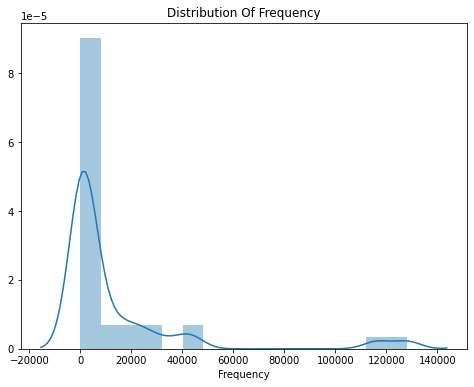

In [167]:
# Apply the same for frequency

tx_state_frequency = rfm_state.groupby(['State'])['Invoice_Date_Time'].count().reset_index()
tx_state_frequency.columns = ['State','Frequency']
tx_state = pd.merge(left= tx_state, right = tx_state_frequency, on = 'State')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_state['Frequency'], hist= True , kde= True)
plt.title('Distribution Of Frequency')

In [168]:
#k-means
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_state[['Frequency']])
tx_state['FrequencyCluster'] = kmeans.predict(tx_state[['Frequency']])

#order the frequency cluster
tx_state = order_cluster('FrequencyCluster', 'Frequency',tx_state,True)

#see details of each cluster
tx_state.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,28.0,2374.714286,3771.986674,2.0,17.75,529.0,3272.50,13597.0
1,6.0,30230.000000,10419.534730,17971.0,23156.50,27967.5,38334.50,44131.0
2,2.0,122209.500000,8351.638193,116304.0,119256.75,122209.5,125162.25,128115.0


Text(0.5, 1.0, 'Distribution Of Revenue State wise')

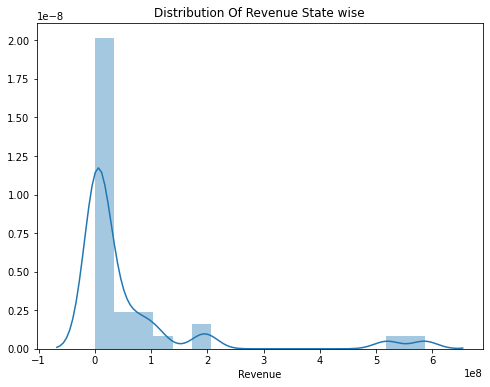

In [169]:
## Revenue
tx_state_revenue = rfm_state.groupby(['State'])['Total Value'].sum().reset_index()
tx_state_revenue.columns = ['State','Revenue']
tx_state = pd.merge(left= tx_state, right = tx_state_revenue, on = 'State')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_state['Revenue'], hist= True , kde= True)
plt.title('Distribution Of Revenue State wise')

In [170]:
#apply clustering
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_state[['Revenue']])
tx_state['RevenueCluster'] = kmeans.predict(tx_state[['Revenue']])


#order the cluster numbers
tx_state = order_cluster('RevenueCluster', 'Revenue',tx_state,True)

#show details of the dataframe
tx_state.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,29.0,1.295887e+07,2.005593e+07,7.022332e+03,9.242098e+04,2.365467e+06,1.466175e+07,7.163393e+07
1,5.0,1.387212e+08,5.194939e+07,9.376839e+07,9.594501e+07,1.139988e+08,1.926484e+08,1.972452e+08
2,2.0,5.528097e+08,4.728951e+07,5.193710e+08,5.360904e+08,5.528097e+08,5.695291e+08,5.862485e+08


In [171]:
# calculate the overall score of states
tx_state['OverallScore'] = tx_state['RecencyCluster'] + tx_state['FrequencyCluster'] + tx_state['RevenueCluster']
tx_state.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()

,Recency,Frequency,Revenue
OverallScore,,,
0,450.00000,7.000000,2.169130e+04
1,50.50000,5.750000,2.585680e+04
2,3.26087,2889.652174,1.321949e+07
3,0.00000,17971.000000,7.163393e+07
4,0.40000,32681.800000,1.387212e+08
6,0.00000,122209.500000,5.528097e+08


In [0]:
# name these scores as , HIgh(6+), Mid (3-5), Low(0-2)
tx_state['Segment'] = 'Low-Value'
tx_state.loc[tx_state['OverallScore']>1,'Segment'] = 'Mid-Value' 
tx_state.loc[tx_state['OverallScore']>3,'Segment'] = 'High-Value'

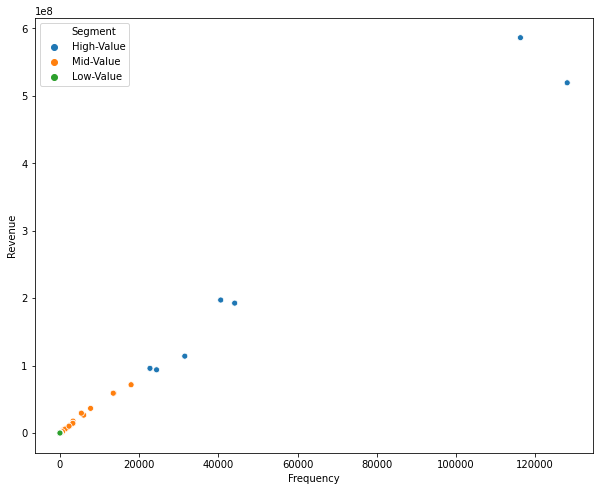

In [173]:
# plotting the  clusters
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Frequency', y = 'Revenue', data = tx_state, hue='Segment')

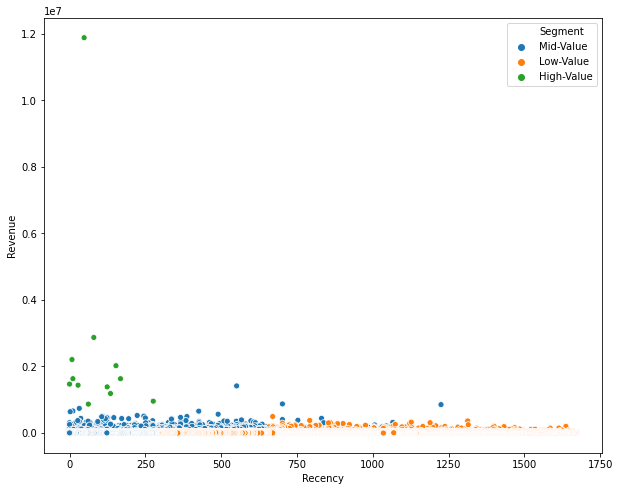

In [174]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Revenue', data = tx_user, hue='Segment')

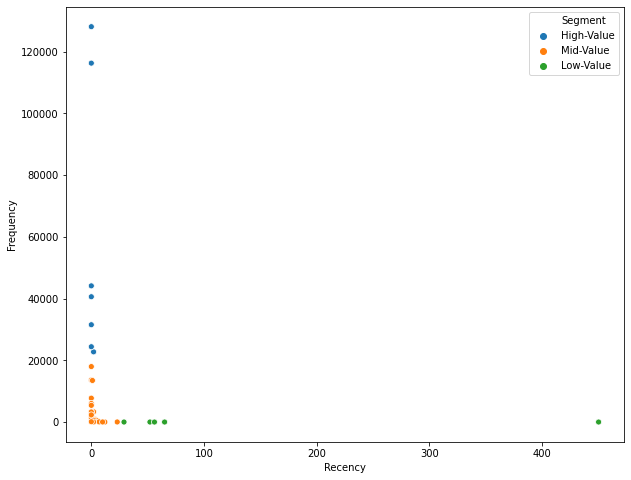

In [175]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Frequency', data = tx_state, hue='Segment')

#### Getting the RFM on the basis of City

In [0]:
rfm_city = invoice_data_1[['CITY','Customer No.','Invoice No','Invoice_Date_Time','Total Value']]

rfm_city['Invoice_Date_Time'] = pd.to_datetime(rfm_city['Invoice_Date_Time'])

In [0]:
# calculate recency
tx_city = pd.DataFrame(rfm_city['CITY'].unique())
tx_city.columns = ['CITY']
# get the max purchase date of each city and create a dataframe with it
tx_max_purchase_city = rfm_city.groupby('CITY').Invoice_Date_Time.max().reset_index()
tx_max_purchase_city.columns = ['CITY','MaxPurchaseDate']

In [178]:
#we take our observation point as the max invoice date in our dataset
tx_max_purchase_city['Recency'] = (tx_max_purchase_city['MaxPurchaseDate'].max() - tx_max_purchase_city['MaxPurchaseDate']).dt.days

tx_city = pd.merge(left = tx_city , right = tx_max_purchase_city[['CITY','Recency']], on = 'CITY')

tx_city['Recency'].describe()

count     162.000000
mean       37.938272
std       131.693730
min         0.000000
25%         0.000000
50%         2.000000
75%         2.000000
max      1225.000000
Name: Recency, dtype: float64

Text(0.5, 1.0, 'Distribution Of Recency City wise')

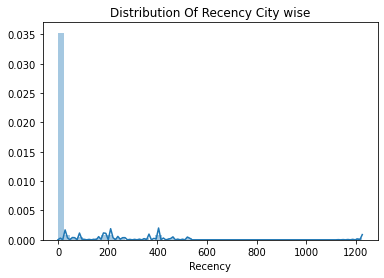

In [179]:
sns.distplot(tx_city['Recency'],hist=True,kde = True)
plt.title('Distribution Of Recency City wise')

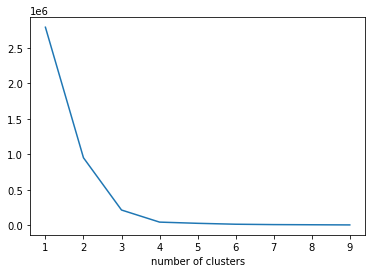

In [180]:
# we'll apply K-means clustering to assign a recency score
# getting the number of clusters using elbow method
sse_city = {}
tx_recency_city = tx_city[['Recency']]
for k in range(1,10):
  kmeans = KMeans(n_clusters=k , max_iter= 500).fit(tx_recency_city)
  tx_recency_city['clusters'] = kmeans.labels_
  sse_city[k] = kmeans.inertia_
plt.figure()
plt.plot(list(sse_city.keys()),list(sse_city.values()))
plt.xlabel("number of clusters")
plt.show()

In [181]:
# we'll take number of clusters as 4

kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_city[['Recency']])
tx_city['RecencyCluster'] = kmeans.predict(tx_city[['Recency']])

tx_city = order_cluster('RecencyCluster','Recency', tx_city, False)

tx_user.groupby(['RecencyCluster']).describe()

Recency                                   ... OverallScore               
                   count         mean         std     min  ...          25%  50%  75%  max
RecencyCluster                                             ...                            
0                23725.0  1276.361138  159.858196  1069.0  ...          0.0  0.0  0.0  3.0
1                43001.0   863.331690  121.912062   657.0  ...          1.0  1.0  1.0  4.0
2                60107.0   449.980352  108.441921   281.0  ...          2.0  2.0  2.0  5.0
3               126640.0   110.626769   80.055871     0.0  ...          3.0  3.0  3.0  9.0

[4 rows x 48 columns]

Text(0.5, 1.0, 'Distribution Of Frequency')

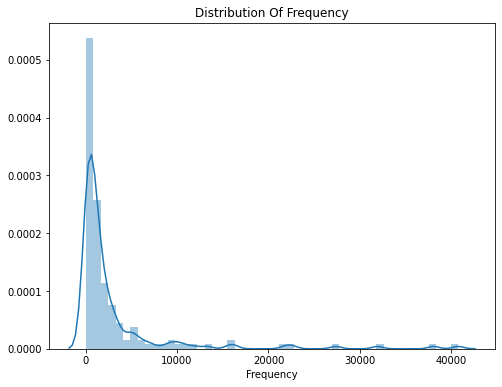

In [182]:
# Apply the same for frequency and Revenue

tx_frequency_city = rfm_city.groupby(['CITY'])['Invoice_Date_Time'].count().reset_index()
tx_frequency_city.columns = ['CITY','Frequency']
tx_city = pd.merge(left= tx_city, right = tx_frequency_city, on = 'CITY')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_city['Frequency'], hist= True , kde= True)
plt.title('Distribution Of Frequency')

In [183]:
#k-means
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_city[['Frequency']])
tx_city['FrequencyCluster'] = kmeans.predict(tx_city[['Frequency']])

#order the frequency cluster
tx_city = order_cluster('FrequencyCluster', 'Frequency',tx_city,True)

#see details of each cluster
tx_city.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,136.0,1044.029412,971.143343,8.0,258.25,769.5,1525.00,4078.0
1,18.0,7534.611111,2747.159584,4427.0,5185.50,6596.5,9551.75,13297.0
2,5.0,20778.600000,4850.395582,15778.0,16217.00,21871.0,22644.00,27383.0
3,3.0,36929.000000,4528.400490,31938.0,35006.00,38074.0,39424.50,40775.0


Text(0.5, 1.0, 'Distribution Of Revenue')

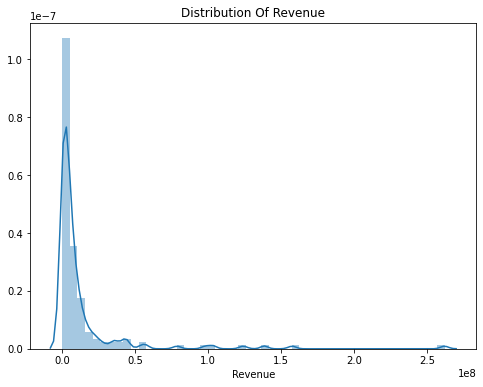

In [184]:
## Revenue
tx_revenue_city = rfm_city.groupby(['CITY'])['Total Value'].sum().reset_index()
tx_revenue_city.columns = ['CITY','Revenue']
tx_city = pd.merge(left= tx_city, right = tx_revenue_city, on = 'CITY')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_city['Revenue'], hist= True , kde= True)
plt.title('Distribution Of Revenue')

In [185]:
#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_city[['Revenue']])
tx_city['RevenueCluster'] = kmeans.predict(tx_city[['Revenue']])


#order the cluster numbers
tx_city = order_cluster('RevenueCluster', 'Revenue',tx_city,True)

#show details of the dataframe
tx_city.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,142.0,5.033201e+06,4.981714e+06,3.534497e+04,1.175644e+06,3.572876e+06,6.942797e+06,2.250898e+07
1,14.0,4.120687e+07,1.483801e+07,2.352720e+07,3.148249e+07,3.922154e+07,4.440527e+07,7.865799e+07
2,5.0,1.243413e+08,2.452431e+07,9.830108e+07,1.035191e+08,1.240232e+08,1.384181e+08,1.574450e+08
3,1.0,2.617155e+08,NaN,2.617155e+08,2.617155e+08,2.617155e+08,2.617155e+08,2.617155e+08


In [0]:
# calculate the overall score
tx_city['OverallScore'] = tx_city['RecencyCluster'] + tx_city['FrequencyCluster'] + tx_city['RevenueCluster']
tx_city.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()


# name these scores as , HIgh(6+), Mid (3-5), Low(0-2)
tx_city['Segment'] = 'Low-Value'
tx_city.loc[tx_city['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_city.loc[tx_city['OverallScore']>6,'Segment'] = 'High-Value'

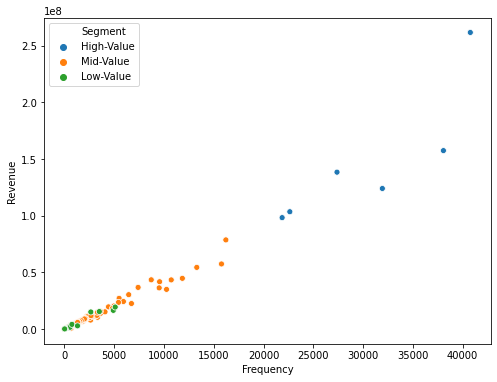

In [187]:
plt.figure(figsize=(8,6))
sns.scatterplot(x = 'Frequency', y = 'Revenue', data = tx_city, hue='Segment')

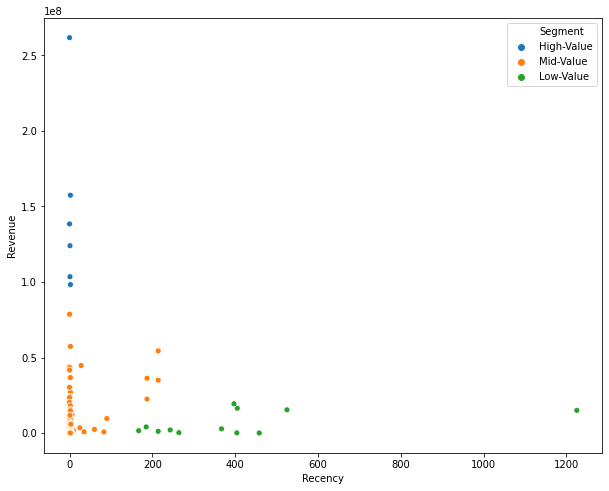

In [188]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Revenue', data = tx_city, hue='Segment')

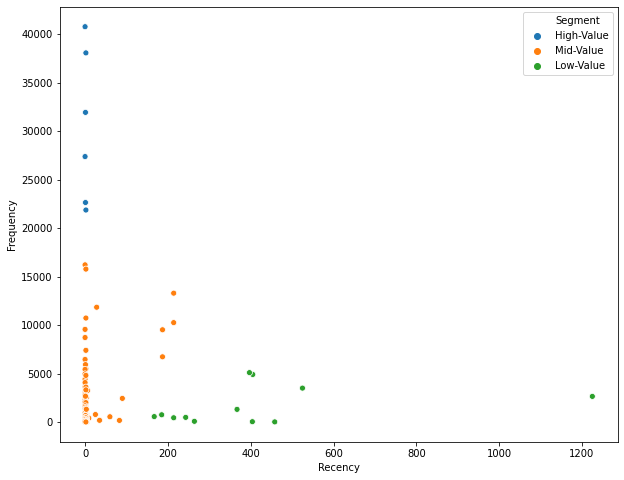

In [189]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Frequency', data = tx_city, hue='Segment')

#### RFM on the basis of vehicle make

In [0]:
rfm_make = invoice_data_1[['Make','Invoice No','Invoice_Date_Time','Total Value']]

rfm_make['Invoice_Date_Time'] = pd.to_datetime(rfm_make['Invoice_Date_Time'])

In [191]:
# calculate recency
tx_make = pd.DataFrame(rfm_make['Make'].unique())
tx_make.columns = ['Make']
# get the max purchase date of each customer and create a dataframe with it
tx_max_purchase_make = rfm_make.groupby('Make').Invoice_Date_Time.max().reset_index()
tx_max_purchase_make.columns = ['Make','MaxPurchaseDate']

#we take our observation point as the max invoice date in our dataset
tx_max_purchase_make['Recency'] = (tx_max_purchase_make['MaxPurchaseDate'].max() - tx_max_purchase_make['MaxPurchaseDate']).dt.days

tx_make = pd.merge(left = tx_make , right = tx_max_purchase_make[['Make','Recency']], on = 'Make')

tx_make['Recency'].describe()

count    28.000000
mean      2.571429
std       5.087593
min       0.000000
25%       0.000000
50%       0.000000
75%       3.000000
max      24.000000
Name: Recency, dtype: float64

Text(0.5, 1.0, 'Distribution Of Recency')

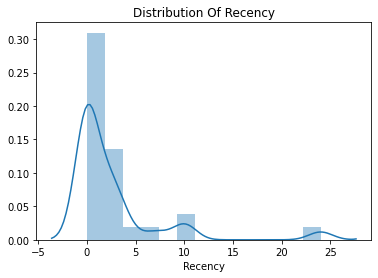

In [192]:
sns.distplot(tx_make['Recency'],hist=True,kde = True)
plt.title('Distribution Of Recency')

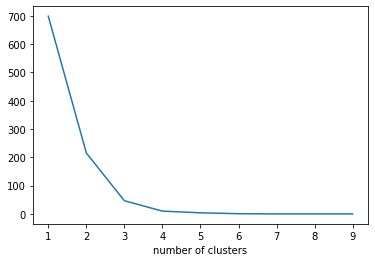

In [193]:
# we'll apply K-means clustering to assign a recency score
# getting the number of clusters using elbow method
sse_make = {}
tx_recency_make = tx_make[['Recency']]
for k in range(1,10):
  kmeans = KMeans(n_clusters=k , max_iter= 500).fit(tx_recency_make)
  tx_recency_make['clusters'] = kmeans.labels_
  sse_make[k] = kmeans.inertia_
plt.figure()
plt.plot(list(sse_make.keys()),list(sse_make.values()))
plt.xlabel("number of clusters")
plt.show()

In [194]:
# we'll take number of clusters as 4

kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_make[['Recency']])
tx_make['RecencyCluster'] = kmeans.predict(tx_make[['Recency']])

tx_make = order_cluster('RecencyCluster','Recency', tx_make, False)


tx_make.groupby(['RecencyCluster']).describe()

Recency                                                
                 count    mean       std   min   25%   50%   75%   max
RecencyCluster                                                        
0                  1.0  24.000       NaN  24.0  24.0  24.0  24.0  24.0
1                  3.0   9.000  1.732051   7.0   8.5  10.0  10.0  10.0
2                  8.0   2.625  0.744024   2.0   2.0   2.5   3.0   4.0
3                 16.0   0.000  0.000000   0.0   0.0   0.0   0.0   0.0

Text(0.5, 1.0, 'Distribution Of Frequency')

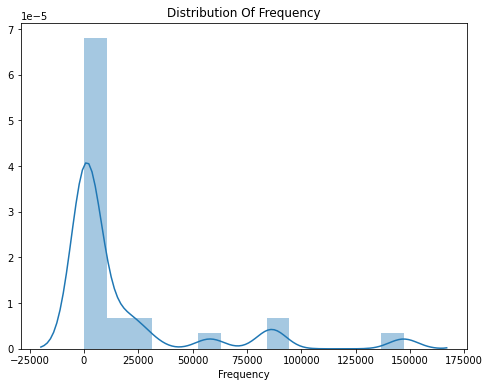

In [195]:
# Apply the same for frequency and Revenue

tx_frequency_make = rfm_make.groupby(['Make'])['Invoice_Date_Time'].count().reset_index()
tx_frequency_make.columns = ['Make','Frequency']
tx_make = pd.merge(left= tx_make, right = tx_frequency_make, on = 'Make')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_make['Frequency'], hist= True , kde= True)
plt.title('Distribution Of Frequency')

In [196]:

#k-means
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_make[['Frequency']])
tx_make['FrequencyCluster'] = kmeans.predict(tx_make[['Frequency']])

#order the frequency cluster
tx_make = order_cluster('FrequencyCluster', 'Frequency',tx_make,True)

#see details of each cluster
tx_make.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,20.0,1441.900000,2337.938586,2.0,20.5,219.5,1842.75,6511.0
1,4.0,21408.000000,5720.776171,15462.0,18465.0,20540.0,23483.00,29090.0
2,3.0,76907.666667,16378.535751,58031.0,71686.0,85341.0,86346.00,87351.0
3,1.0,147098.000000,NaN,147098.0,147098.0,147098.0,147098.00,147098.0


Text(0.5, 1.0, 'Distribution Of Revenue')

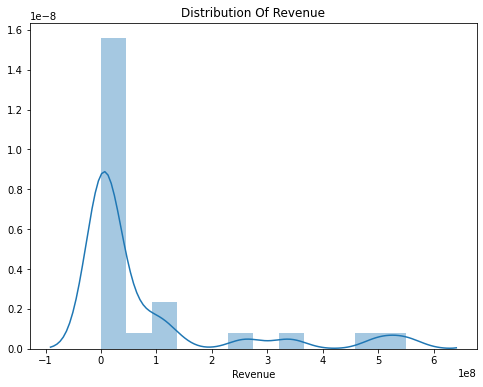

In [197]:
## Revenue

tx_revenue_make = rfm_make.groupby(['Make'])['Total Value'].sum().reset_index()
tx_revenue_make.columns = ['Make','Revenue']
tx_make = pd.merge(left= tx_make, right = tx_revenue_make, on = 'Make')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_make['Revenue'], hist= True , kde= True)
plt.title('Distribution Of Revenue')

In [198]:
#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_make[['Revenue']])
tx_make['RevenueCluster'] = kmeans.predict(tx_make[['Revenue']])


#order the cluster numbers
tx_make = order_cluster('RevenueCluster', 'Revenue',tx_make,True)

#show details of the dataframe
tx_make.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,20.0,6.618351e+06,1.098940e+07,4.771282e+03,1.109279e+05,9.403765e+05,8.272647e+06,3.407416e+07
1,4.0,9.740090e+07,2.301354e+07,6.862426e+07,8.966598e+07,9.803908e+07,1.057740e+08,1.249012e+08
2,2.0,3.005650e+08,5.582512e+07,2.610907e+08,2.808279e+08,3.005650e+08,3.203022e+08,3.400393e+08
3,2.0,5.259660e+08,3.411984e+07,5.018396e+08,5.139028e+08,5.259660e+08,5.380292e+08,5.500924e+08


In [0]:
# # calculate the overall score
tx_make['OverallScore'] = tx_make['RecencyCluster'] + tx_make['FrequencyCluster'] + tx_make['RevenueCluster']
tx_make.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()

# # name these scores as , HIgh(6+), Mid (3-5), Low(0-2)
tx_make['Segment'] = 'Low-Value'
tx_make.loc[tx_make['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_make.loc[tx_make['OverallScore']>6,'Segment'] = 'High-Value'

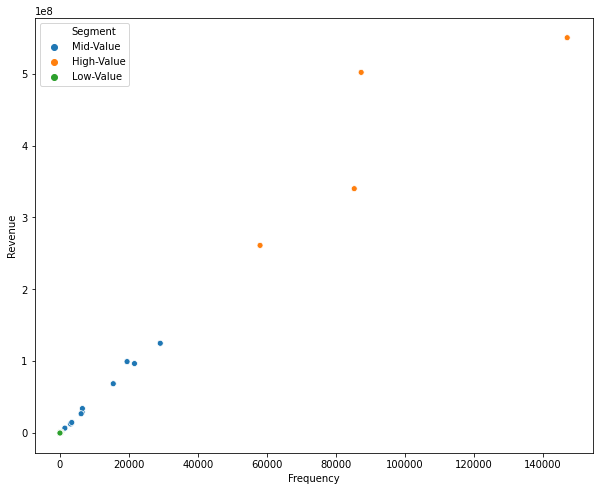

In [200]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Frequency', y = 'Revenue', data = tx_make, hue='Segment')

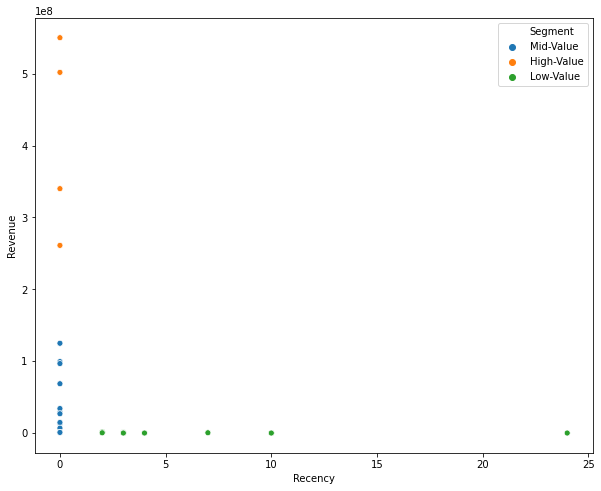

In [201]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Revenue', data = tx_make, hue='Segment')

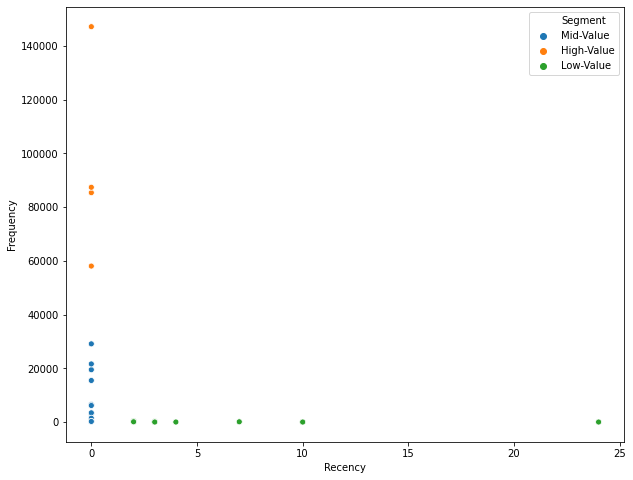

In [202]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Frequency', data = tx_make, hue='Segment')

#### Calculate RFM based on Models

In [0]:
rfm_models = invoice_data_1[['Model','Invoice No','Invoice_Date_Time','Total Value']]

rfm_models['Invoice_Date_Time'] = pd.to_datetime(rfm_models['Invoice_Date_Time'])

In [204]:
# calculate recency
tx_models = pd.DataFrame(rfm_models['Model'].unique())
tx_models.columns = ['Model']
# get the max purchase date of each customer and create a dataframe with it
tx_max_purchase_model = rfm_models.groupby('Model').Invoice_Date_Time.max().reset_index()
tx_max_purchase_model.columns = ['Model','MaxPurchaseDate']

#we take our observation point as the max invoice date in our dataset
tx_max_purchase_model['Recency'] = (tx_max_purchase_model['MaxPurchaseDate'].max() - tx_max_purchase_model['MaxPurchaseDate']).dt.days

tx_models = pd.merge(left = tx_models , right = tx_max_purchase_model[['Model','Recency']], on = 'Model')

tx_models['Recency'].describe()

count     245.000000
mean       36.110204
std       146.803985
min         0.000000
25%         0.000000
50%         2.000000
75%        10.000000
max      1670.000000
Name: Recency, dtype: float64

Text(0.5, 1.0, 'Distribution Of Recency')

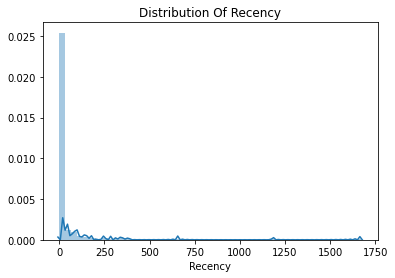

In [205]:
sns.distplot(tx_models['Recency'],hist=True,kde = True)
plt.title('Distribution Of Recency')

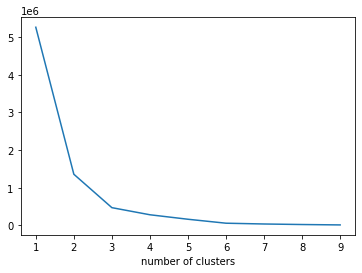

In [206]:
# we'll apply K-means clustering to assign a recency score
# getting the number of clusters using elbow method
sse_model = {}
tx_recency_models = tx_models[['Recency']]
for k in range(1,10):
  kmeans = KMeans(n_clusters=k , max_iter= 500).fit(tx_recency_models)
  tx_recency_models['clusters'] = kmeans.labels_
  sse_model[k] = kmeans.inertia_
plt.figure()
plt.plot(list(sse_model.keys()),list(sse_model.values()))
plt.xlabel("number of clusters")
plt.show()

In [207]:
# we'll take number of clusters as 6

kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_models[['Recency']])
tx_models['RecencyCluster'] = kmeans.predict(tx_models[['Recency']])

tx_models = order_cluster('RecencyCluster','Recency', tx_models, False)


tx_models.groupby(['RecencyCluster']).describe()

Recency                           ...                         
                 count         mean         std  ...     50%      75%     max
RecencyCluster                                   ...                         
0                  2.0  1426.000000  345.068109  ...  1426.0  1548.00  1670.0
1                  8.0   353.000000  132.086552  ...   328.5   361.75   656.0
2                 19.0   109.000000   34.575200  ...   100.0   136.00   175.0
3                216.0     5.092593    9.675706  ...     2.0     4.25    53.0

[4 rows x 8 columns]

Text(0.5, 1.0, 'Distribution Of Frequency')

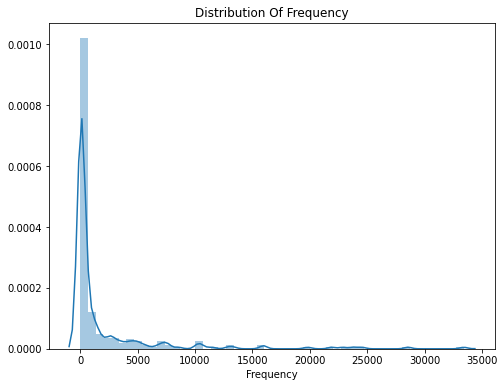

In [208]:
# Apply the same for frequency and Revenue

tx_frequency_models = rfm_models.groupby(['Model'])['Invoice_Date_Time'].count().reset_index()
tx_frequency_models.columns = ['Model','Frequency']
tx_models = pd.merge(left= tx_models, right = tx_frequency_models, on = 'Model')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_models['Frequency'], hist= True , kde= True)
plt.title('Distribution Of Frequency')

In [209]:
#k-means
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_models[['Frequency']])
tx_models['FrequencyCluster'] = kmeans.predict(tx_models[['Frequency']])

#order the frequency cluster
tx_models = order_cluster('FrequencyCluster', 'Frequency',tx_models,True)

#see details of each cluster
tx_models.groupby('FrequencyCluster')['Frequency'].describe()


,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,198.0,293.707071,488.626070,1.0,10.00,66.0,336.75,2328.0
1,30.0,4652.100000,1695.628545,2577.0,3288.25,4402.0,5693.75,7709.0
2,10.0,11971.300000,2507.776751,8564.0,10337.75,11067.0,13232.00,16004.0
3,7.0,24980.142857,4592.403635,19810.0,22377.50,23771.0,26551.50,33422.0


Text(0.5, 1.0, 'Distribution Of Revenue across Models')

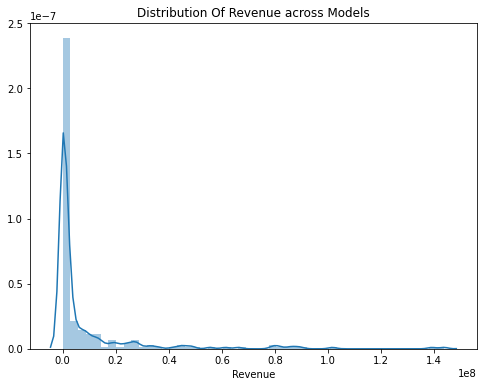

In [210]:
## Revenue

tx_revenue_model = rfm_models.groupby(['Model'])['Total Value'].sum().reset_index()
tx_revenue_model.columns = ['Model','Revenue']
tx_models = pd.merge(left= tx_models, right = tx_revenue_model, on = 'Model')

# plot
plt.figure(figsize=(8,6))
sns.distplot(tx_models['Revenue'], hist= True , kde= True)
plt.title('Distribution Of Revenue across Models')

In [211]:
#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_models[['Revenue']])
tx_models['RevenueCluster'] = kmeans.predict(tx_models[['Revenue']])


#order the cluster numbers
tx_models = order_cluster('RevenueCluster', 'Revenue',tx_models,True)

#show details of the dataframe
tx_models.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,209.0,1.923314e+06,3.327422e+06,0.000000e+00,4.427318e+04,3.389054e+05,2.021238e+06,1.426389e+07
1,24.0,2.925782e+07,1.001944e+07,1.625157e+07,2.129475e+07,2.694771e+07,3.410903e+07,4.890420e+07
2,10.0,7.879979e+07,1.405187e+07,5.553460e+07,6.943598e+07,8.091477e+07,8.685486e+07,1.016746e+08
3,2.0,1.414373e+08,3.223373e+06,1.391580e+08,1.402976e+08,1.414373e+08,1.425769e+08,1.437165e+08


In [0]:
# calculate the overall score
tx_models['OverallScore'] = tx_models['RecencyCluster'] + tx_models['FrequencyCluster'] + tx_models['RevenueCluster']
tx_models.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()


# name these scores as , HIgh(6+), Mid (3-5), Low(0-2)
tx_models['Segment'] = 'Low-Value'
tx_models.loc[tx_models['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_models.loc[tx_models['OverallScore']>6,'Segment'] = 'High-Value'

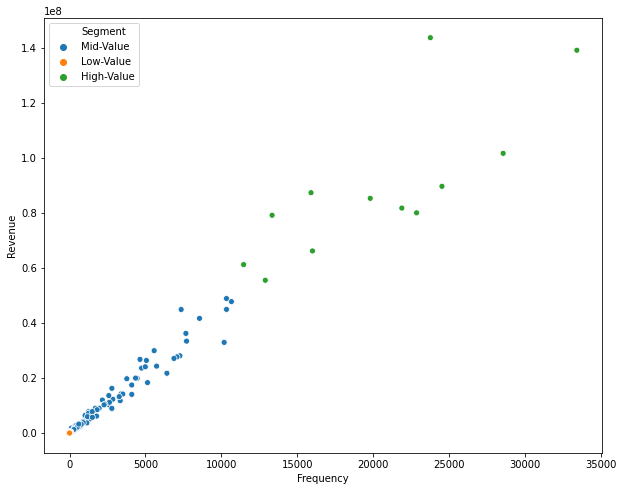

In [213]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Frequency', y = 'Revenue', data = tx_models, hue='Segment')

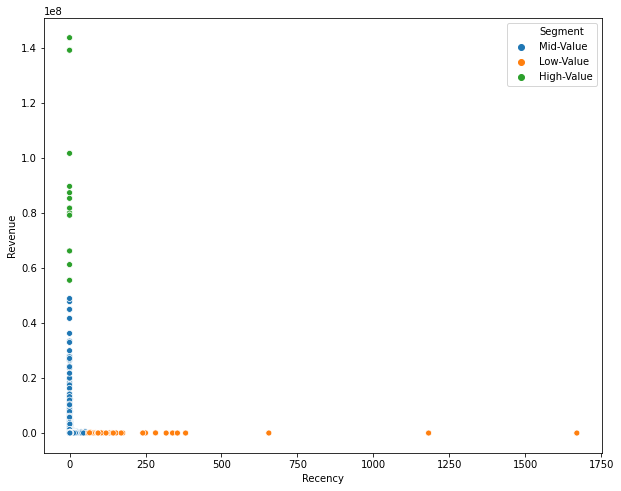

In [214]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Revenue', data = tx_models, hue='Segment')

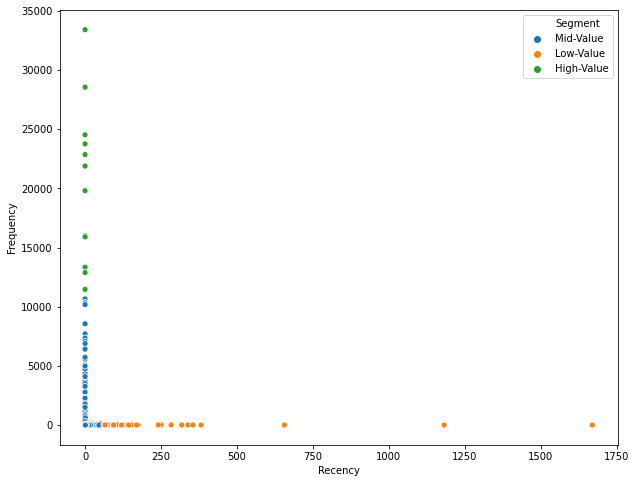

In [215]:
plt.figure(figsize=(10,8))
sns.scatterplot(x = 'Recency', y = 'Frequency', data = tx_models, hue='Segment')

#### Customer Life Time Value Prediction

In [0]:
from datetime import datetime, timedelta, date
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
from sklearn.model_selection import KFold, cross_val_score, train_test_split

In [0]:
tx_invoice = invoice_data_1[['Customer No.','Invoice No','Invoice_Date_Time','Total Value']]
tx_invoice['Invoice_Date_Time'] = pd.to_datetime(tx_invoice['Invoice_Date_Time'])

In [218]:
min(tx_invoice['Invoice_Date_Time'])
tx_invoice['Invoice_Date_Time'].dt.date

0         2015-01-02
1         2015-01-03
2         2015-01-03
3         2015-01-03
4         2015-01-03
             ...    
492309    2016-06-30
492310    2016-06-30
492311    2016-06-30
492312    2016-06-30
492313    2016-06-30
Name: Invoice_Date_Time, Length: 492291, dtype: object

In [0]:
# create a 3months and 6 months dataframe
tx_3m = tx_invoice[(tx_invoice['Invoice_Date_Time'].dt.date < date(2012,10,2)) & (tx_invoice['Invoice_Date_Time'].dt.date >= date(2012,7,2))].reset_index(drop=True)
tx_6m = tx_invoice[(tx_invoice['Invoice_Date_Time'].dt.date < date(2012,10,2)) & (tx_invoice['Invoice_Date_Time'].dt.date >= date(2012,4,2))].reset_index(drop=True)

In [0]:
# create tx_user to assign clustering
tx_user_ltv = pd.DataFrame(tx_3m['Customer No.'].unique())
tx_user_ltv.columns = ['Customer No.']

In [0]:
# calculate recency score
tx_max_purchase_ltv = tx_3m.groupby('Customer No.')['Invoice_Date_Time'].max().reset_index()
tx_max_purchase_ltv.columns = ['Customer No.','MaxPurchaseDate']

tx_max_purchase_ltv['Recency'] = (tx_max_purchase_ltv['MaxPurchaseDate'].max() - tx_max_purchase_ltv['MaxPurchaseDate']).dt.days

tx_user_ltv = pd.merge(left = tx_user_ltv , right = tx_max_purchase_ltv[['Customer No.','Recency']], on = 'Customer No.')

In [222]:
# we'll take number of clusters as 4
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user_ltv[['Recency']])
tx_user_ltv['RecencyCluster'] = kmeans.predict(tx_user_ltv[['Recency']])

tx_user_ltv = order_cluster('RecencyCluster','Recency', tx_user_ltv, False)


tx_user_ltv.groupby(['RecencyCluster']).describe()

Recency                                                   
                 count       mean       std   min   25%   50%   75%   max
RecencyCluster                                                           
0                771.0  80.678340  5.818715  71.0  76.0  80.0  86.0  91.0
1               1048.0  59.707061  6.870550  48.0  53.0  62.0  66.0  70.0
2               1088.0  34.399816  6.890194  23.0  30.0  34.0  40.0  47.0
3               1137.0   9.486368  6.754631   0.0   3.0   9.0  16.0  21.0

In [223]:
# Apply the same for frequency

tx_frequency_ltv = tx_3m.groupby(['Customer No.'])['Invoice_Date_Time'].count().reset_index()
tx_frequency_ltv.columns = ['Customer No.','Frequency']
tx_user_ltv = pd.merge(left= tx_user_ltv, right = tx_frequency_ltv, on = 'Customer No.')

#k-means
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user_ltv[['Frequency']])
tx_user_ltv['FrequencyCluster'] = kmeans.predict(tx_user_ltv[['Frequency']])

#order the frequency cluster
tx_user_ltv = order_cluster('FrequencyCluster', 'Frequency',tx_user_ltv,True)

#see details of each cluster
tx_user_ltv.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,4038.0,1.252848,0.700126,1.0,1.0,1.0,1.0,13.0
1,4.0,32.500000,15.438048,18.0,24.0,29.0,37.5,54.0
2,1.0,94.000000,NaN,94.0,94.0,94.0,94.0,94.0
3,1.0,679.000000,NaN,679.0,679.0,679.0,679.0,679.0


In [224]:
## Revenue

tx_revenue_ltv = tx_3m.groupby(['Customer No.'])['Total Value'].sum().reset_index()
tx_revenue_ltv.columns = ['Customer No.','Revenue']
tx_user_ltv = pd.merge(left= tx_user_ltv, right = tx_revenue_ltv, on = 'Customer No.')

#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(tx_user_ltv[['Revenue']])
tx_user_ltv['RevenueCluster'] = kmeans.predict(tx_user_ltv[['Revenue']])


#order the cluster numbers
tx_user_ltv = order_cluster('RevenueCluster', 'Revenue',tx_user_ltv,True)

#show details of the dataframe
tx_user_ltv.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,3696.0,3.558038e+03,3546.501062,0.00,8.984500e+02,2330.185,5.041548e+03,15936.61
1,335.0,2.844641e+04,13959.609955,15947.63,1.862960e+04,23583.710,3.274462e+04,94445.14
2,12.0,1.769048e+05,83397.753036,108027.04,1.183737e+05,143032.155,1.920414e+05,340701.42
3,1.0,3.388183e+06,NaN,3388183.30,3.388183e+06,3388183.300,3.388183e+06,3388183.30


In [0]:
# calculate the overall score
tx_user_ltv['OverallScore'] = tx_user_ltv['RecencyCluster'] + tx_user_ltv['FrequencyCluster'] + tx_user_ltv['RevenueCluster']
tx_user_ltv.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()


# # name these scores as , HIgh(6+), Mid (3-5), Low(0-2)
tx_user_ltv['Segment'] = 'Low-Value'
tx_user_ltv.loc[tx_user_ltv['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_user_ltv.loc[tx_user_ltv['OverallScore']>5,'Segment'] = 'High-Value'

In [0]:
#calculate revenue and create a new dataframe for it
tx_6m['Revenue'] = tx_6m['Total Value']

tx_user_6m = tx_6m.groupby('Customer No.')['Revenue'].sum().reset_index()
tx_user_6m.columns = ['Customer No.','m6_Revenue']

In [0]:
#We will merge our 3 months and 6 months dataframes to see correlations between LTV and the feature set we have.
tx_merge = pd.merge(left = tx_user_ltv, right = tx_user_6m, on='Customer No.', how='left')
tx_merge = tx_merge.fillna(0)

Text(0.5, 1.0, 'Life Time Value')

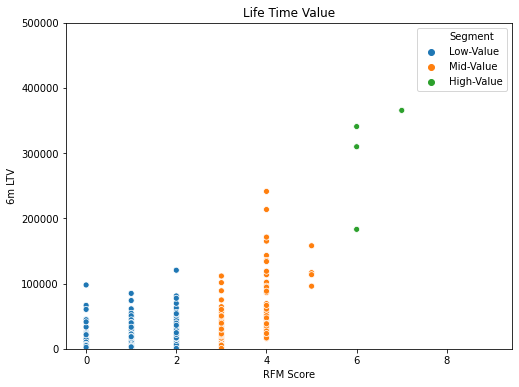

In [228]:
plt.figure(figsize=(8,6))
sns.scatterplot(x = 'OverallScore', y= 'm6_Revenue', data = tx_merge , hue= 'Segment')
plt.xlabel('RFM Score')
plt.ylabel('6m LTV')
plt.ylim([-0.1,500000])
plt.title('Life Time Value')

In [0]:
# #Positive correlation is quite visible here. High RFM score means high LTV
# Before building the machine learning model, we need to identify what is the type of this machine learning problem. 
#LTV itself is a regression problem. A machine learning model can predict the $ value of the LTV. But here, we want LTV segments. 
#Because it makes it more actionable and easy to communicate with other people. By applying K-means clustering, 
# we can identify our existing LTV groups and build segments on top of it.
# Considering business part of this analysis, we need to treat customers differently based on their predicted LTV. 
#For this example, we will apply clustering and have 3 segments (number of segments really depends on your business dynamics and goals):
# Low LTV
# Mid LTV
# High LTV
# We are going to apply K-means clustering to decide segments and observe their characteristics:

In [0]:
# remove outliers
tx_merge = tx_merge[tx_merge['m6_Revenue'] < tx_merge['m6_Revenue'].quantile(0.99)]

In [231]:
# creating 3 clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_merge[['m6_Revenue']])
tx_merge['LTVCluster'] = kmeans.predict(tx_merge[['m6_Revenue']])

# order cluster number based on LTV
tx_merge = order_cluster('LTVCluster','m6_Revenue',tx_merge, True)

# creating a new cluster dataframe
tx_cluster = tx_merge.copy()

#see details of the cluster
tx_cluster.groupby('LTVCluster')['m6_Revenue'].describe()
# CLuster 3 is the best with average of 38K , whereas 0 is the worst with 2.8K

,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,3039.0,2881.347957,2303.408558,0.00,930.925,2329.70,4333.670,8813.00
1,785.0,14744.810739,4761.552874,8824.82,10705.150,13583.60,18163.720,26859.16
2,179.0,39038.852514,9464.070311,26997.76,30837.100,36529.51,45004.265,62691.12


In [232]:
# Feature engineering
# convert categorical columns to numerical
tx_class = pd.get_dummies(tx_cluster)

# calculate and show correlation
corr_matrix = tx_class.corr()
corr_matrix['LTVCluster'].sort_values(ascending=False)

LTVCluster           1.000000
m6_Revenue           0.898707
Revenue              0.774814
RevenueCluster       0.620862
Frequency            0.340574
                       ...   
Customer No._667    -0.008332
Customer No._3625   -0.008332
Recency             -0.103266
Segment_Low-Value   -0.178142
FrequencyCluster          NaN
Name: LTVCluster, Length: 4014, dtype: float64

In [0]:
# create X and y for training
X = tx_class.drop(['LTVCluster','m6_Revenue'], axis=1)
y = tx_class['LTVCluster']

# splitting into train and test set
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size = 0.5, random_state = 0)

In [0]:
# building the model
ltv_xgb_model = xgb.XGBClassifier(max_depth = 5, learning_rate= 0.1, objective='multi:softprob', n_jobs=-1).fit(X_train, y_train)

In [235]:
accuracy_train = ltv_xgb_model.score(X_train, y_train)
print('Accuracy of XGB classifier on train set is {}'.format(accuracy_train))

Accuracy of XGB classifier on train set is 0.9365317341329336


In [236]:
accuracy_test = ltv_xgb_model.score(X_test[X_train.columns], y_test)
print('Accuracy of the XGB classifier on test set is {}'.format(accuracy_test))

Accuracy of the XGB classifier on test set is 0.9175824175824175


In [237]:
tx_class['LTVCluster'].value_counts(normalize = True)

0    0.759181
1    0.196103
2    0.044716
Name: LTVCluster, dtype: float64

In [0]:
## We used XGB Classifier to do the multiclass classification. And got the accuracy of 93.8 % on training set and 
## 92% on test set. But we would first need to check our benchmark. Biggest cluster is the 0 cluster and comprises 75% of the total base.
# It means , if we predict all Clusters as 0 , then we would be correct 75% of the time
# So , an accuracy of 93% on training set and 92% on test set seems good for now.
# to check where our predictions are going wrong , we can look at the classification report below

In [239]:
# classification report
y_pred = ltv_xgb_model.predict(X_test)
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      1524
           1       0.91      0.69      0.78       378
           2       0.91      0.62      0.74       100

    accuracy                           0.92      2002
   macro avg       0.91      0.77      0.83      2002
weighted avg       0.92      0.92      0.91      2002



In [0]:
# Precision and recall are acceptable for cluster 0(Low LTV Customers)
# Precision is acceptable for both cluster 1(Mid LTV customers ) and cluster 2(High  LTV Customers), but Recall seems to be on the lower side.

# Time series forecasting

In [0]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

#### Pre process data

In [0]:
# taking only the columns - Invoice date and Total value - that are relevant for time series
ts_data = invoice_data_1[['Invoice_Date_Time','Total Value']]

ts_data['Invoice_Date'] = pd.to_datetime(ts_data['Invoice_Date_Time'].dt.date)

ts_data.drop(columns=['Invoice_Date_Time'], axis=1, inplace= True)

#sorting
ts_data = ts_data.sort_values(by='Invoice_Date', ascending=True)

# reset the index
ts_data = ts_data.groupby('Invoice_Date')['Total Value'].sum().reset_index()

# indexing with time series data
ts_data = ts_data.set_index('Invoice_Date')

In [0]:
#Our current datetime data can be tricky to work with, therefore, 
#we will use the averages daily sales value for that month instead, and we are using the start of each month as the timestamp.

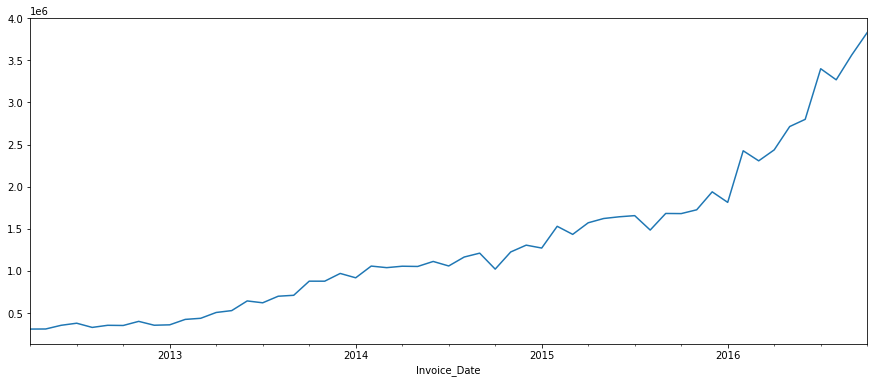

In [244]:
ts_date_y = ts_data['Total Value'].resample('MS').mean()

plt.figure(figsize=(15,6))
ts_date_y.plot()
plt.show()

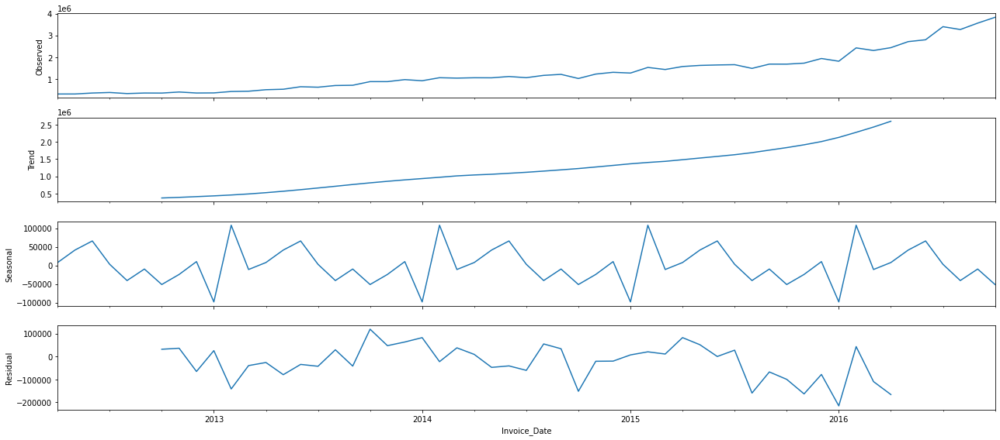

In [245]:
from pylab import rcParams
rcParams['figure.figsize'] = (18,8) 

decomposition = sm.tsa.seasonal_decompose(ts_date_y, model ='additive')
fig = decomposition.plot()
plt.show()

#### Check Stationarity

In [0]:
# check Stationarity of data
# Stationarity check  -- constant mean , constant variance , autocovariance that does not depend on time

In [0]:
def test_stationarity(ts):
  # determine rolling statistics
  rol_mean = ts.rolling(window=12).mean()
  rol_std = ts.rolling(window=12).std()

  # plotting the rolling statistics
  plt.plot(ts, color='blue', label ='original')
  plt.plot(rol_mean, color='red' , label = 'rolling mean')
  plt.plot(rol_std , color='black' , label = 'rolling std' )
  plt.title('Rolling mean and Standard deviation')
  plt.legend()
  plt.show()

  # perform dicky fuller test
  df_test = adfuller(ts, autolag = 'AIC')
  df_output = pd.Series(df_test[:4], index = ['Test Statistic', 'p-value','#Lags used','Number of observations used'])

  for key, value in df_test[4].items():
    df_output['Critical value {} '.format(key)] = value

  print(df_output)

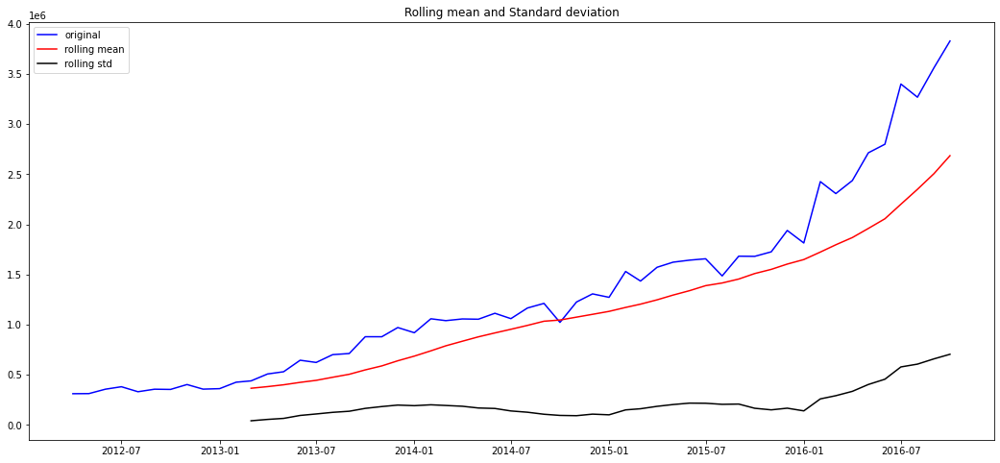

Test Statistic                  1.698002
p-value                         0.998124
#Lags used                     11.000000
Number of observations used    43.000000
Critical value 1%              -3.592504
Critical value 5%              -2.931550
Critical value 10%             -2.604066
dtype: float64


In [248]:
test_stationarity(ts_date_y)
# Though the variation in standard deviation is small, mean is clearly increasing with time and this is not a stationary series. 
# Also, the test statistic is way more than the critical values. Note that the signed values should be compared and not the absolute values.

In [0]:
## applying log transformation to reduce the trend

#### Log transform

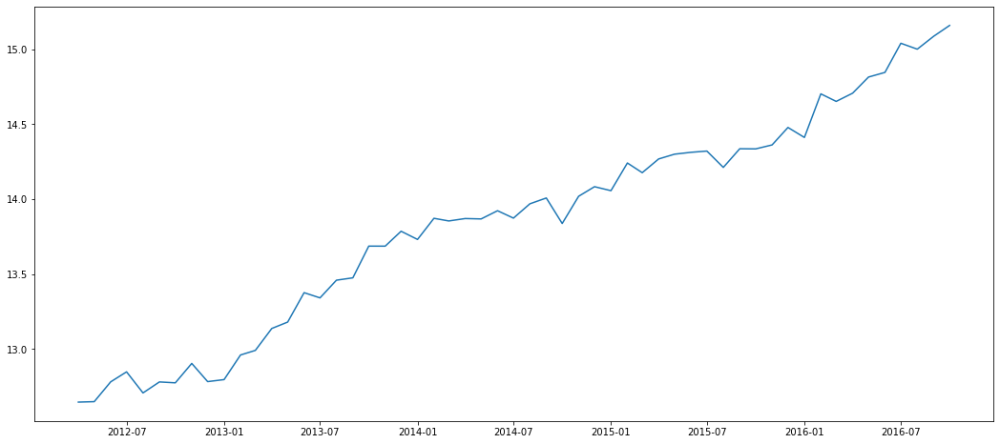

In [250]:
ts_log = np.log(ts_date_y)

plt.plot(ts_log)

#### Moving averages

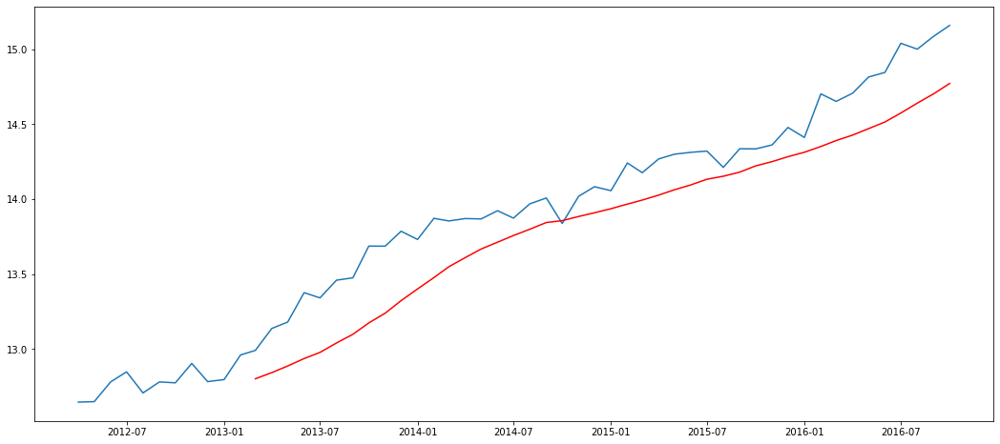

In [251]:
# Moving Averages
moving_avg = ts_log.rolling(window=12).mean()
plt.plot(ts_log)
plt.plot(moving_avg, color='red')
plt.show()

In [0]:
#The red line shows the rolling mean. Lets subtract this from the original series. 
#Note that since we are taking average of last 12 values, rolling mean is not defined for first 11 values.

In [253]:
ts_log_moving_avg_diff = ts_log - moving_avg
ts_log_moving_avg_diff.head(12)

Invoice_Date
2012-04-01        NaN
2012-05-01        NaN
2012-06-01        NaN
2012-07-01        NaN
2012-08-01        NaN
2012-09-01        NaN
2012-10-01        NaN
2012-11-01        NaN
2012-12-01        NaN
2013-01-01        NaN
2013-02-01        NaN
2013-03-01    0.18922
Freq: MS, Name: Total Value, dtype: float64

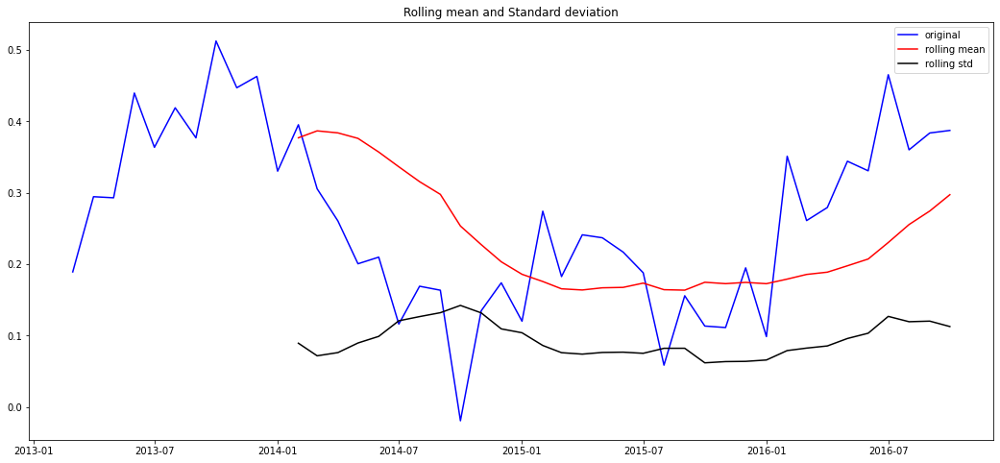

Test Statistic                 -1.971417
p-value                         0.299245
#Lags used                     10.000000
Number of observations used    33.000000
Critical value 1%              -3.646135
Critical value 5%              -2.954127
Critical value 10%             -2.615968
dtype: float64


In [254]:
# drop the NaN values and check the plot to test staionarity
ts_log_moving_avg_diff.dropna(inplace=True)
test_stationarity(ts_log_moving_avg_diff)

In [0]:
## the test statistic is not smaller than the Critical value of 5% , and so the null hypothesis cannot be rejected. and the series is not a stationary series
## A weighted moving average technique such as Exponential Weighted Moving Average where weights are assigned to all the previous values with a decay factor.

In [256]:
# checking the mean
X = ts_log.values
print(len(X)//2)
X1, X2 = X[:len(X)//2], X[len(X)//2:]
mean_1, mean_2 = X1.mean(), X2.mean()
var_1 , var_2 = X1.var(), X2.var()
std_1, std_2 = X1.std(), X2.std()
print(mean_1, mean_2)
print(std_1, std_2)
print(var_1, var_2)

27
13.254273618350737 14.414025072246245
0.45326269241453254 0.3728803372592794
0.2054470683348711 0.13903974591459395


In [0]:
#  the variation in the mean , standard deviation and covariance is not much , we'll try other transformation techniques 

####exponentially weighted moving average

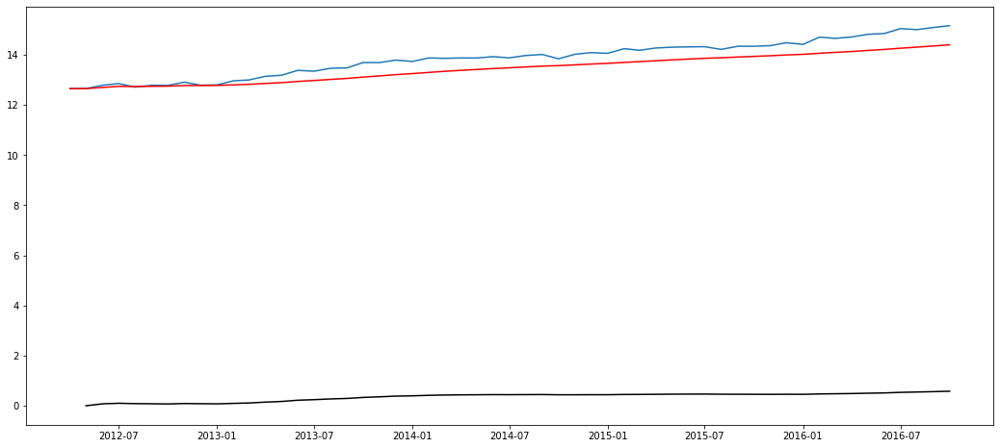

In [258]:
exp_weighted_avg = ts_log.ewm(halflife=12)
plt.plot(ts_log)
plt.plot(exp_weighted_avg.mean(), color='red')
plt.plot(exp_weighted_avg.std(), color = 'black')
plt.show()

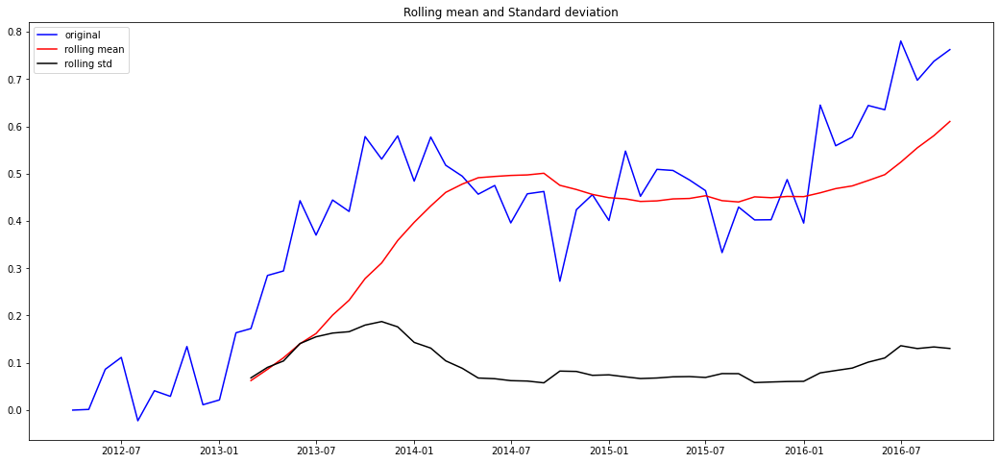

Test Statistic                 -0.912693
p-value                         0.783764
#Lags used                      3.000000
Number of observations used    51.000000
Critical value 1%              -3.565624
Critical value 5%              -2.920142
Critical value 10%             -2.598015
dtype: float64


In [259]:
ts_log_ews_diff = ts_log - exp_weighted_avg.mean()
test_stationarity(ts_log_ews_diff)

In [0]:
# the exponential weighted moving average has poor statistics as compared to moving average , 
# so we would be taking the log moving average to eliminate the trend and seasonality 

### Eliminating the trend and seasonality

In [0]:
# two ways of removing trend and seasonality :
# Differencing - taking the difference with a particular time lag
# Decomposition - modelling both trend and seasonality and removing them from the model

####Differencing

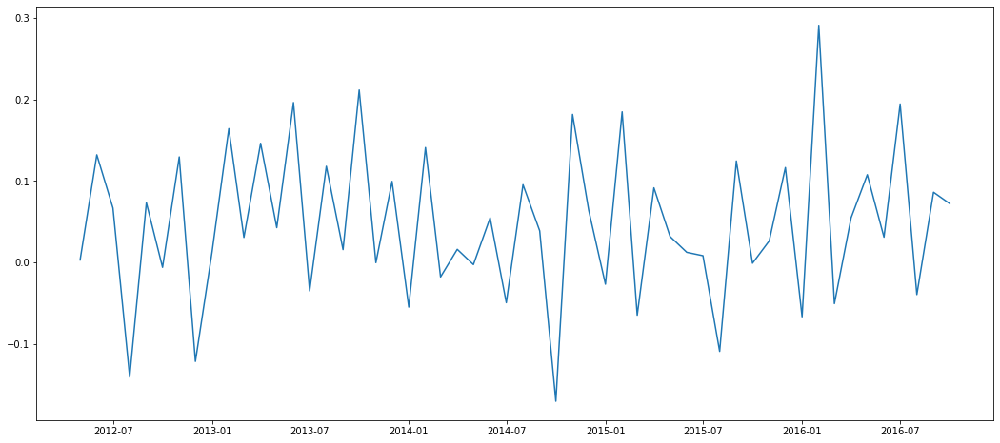

In [262]:
ts_log_diff = ts_log - ts_log.shift()
plt.plot(ts_log_diff)

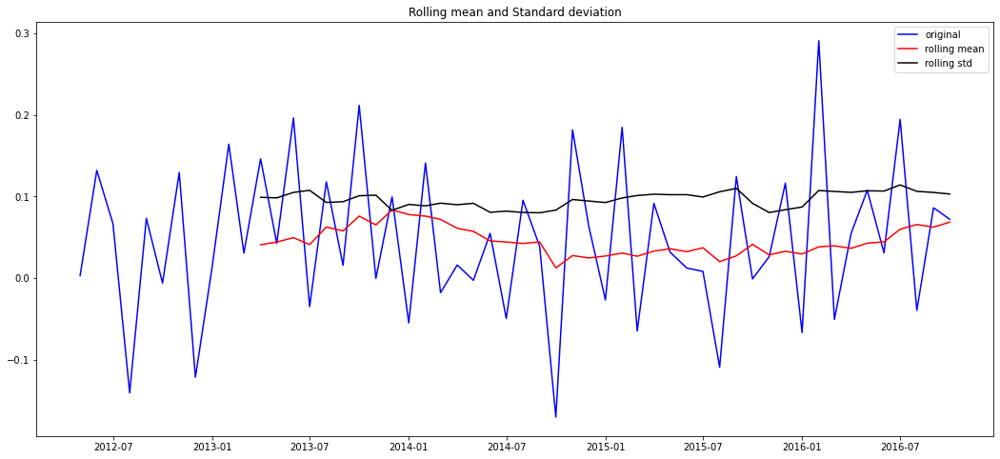

Test Statistic                 -3.887441
p-value                         0.002129
#Lags used                      2.000000
Number of observations used    51.000000
Critical value 1%              -3.565624
Critical value 5%              -2.920142
Critical value 10%             -2.598015
dtype: float64


In [263]:
# the trend seems to be reduces considerably
ts_log_diff.dropna(inplace=True)
test_stationarity(ts_log_diff)

In [0]:
# We can see that the mean and std variations have small variations with time. 
# Also, the Dickey-Fuller test statistic is less than the 1% critical value, thus the TS is stationary with 99% confidence

#### Decomposing

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose

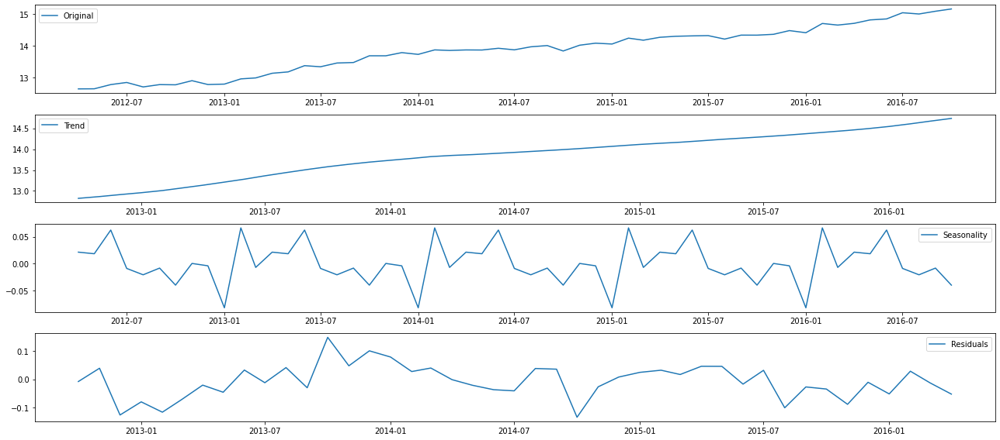

In [266]:
decomposition = seasonal_decompose(ts_log)

trend = decomposition.trend

seasonal = decomposition.seasonal

residual = decomposition.resid

plt.subplot(411)
plt.plot(ts_log, label ='Original')
plt.legend(loc='best')

plt.subplot(412)
plt.plot(trend, label ='Trend')
plt.legend(loc='best')

plt.subplot(413)
plt.plot(seasonal , label ='Seasonality')
plt.legend(loc='best')

plt.subplot(414)
plt.plot(residual, label = 'Residuals')
plt.legend(loc='best')

plt.tight_layout()

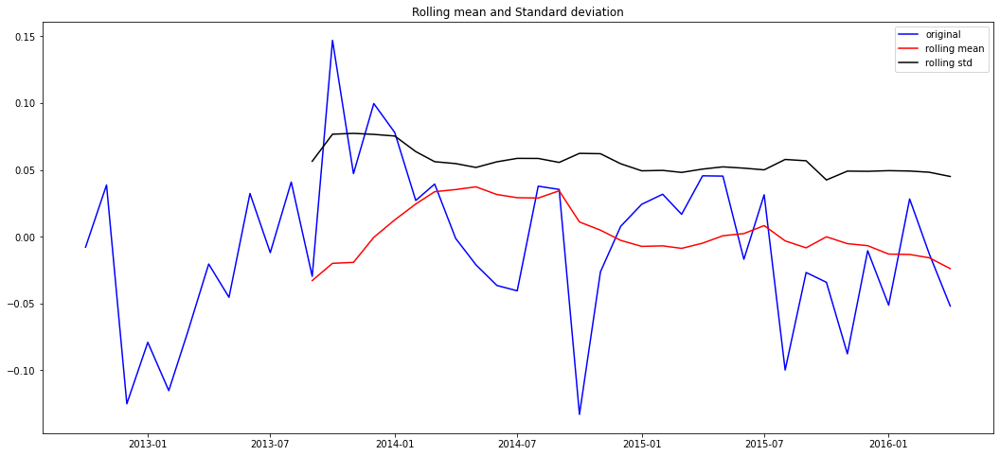

Test Statistic                 -2.589636
p-value                         0.095158
#Lags used                      1.000000
Number of observations used    41.000000
Critical value 1%              -3.600983
Critical value 5%              -2.935135
Critical value 10%             -2.605963
dtype: float64


In [267]:
# here trend and seasonality are separated from data and we can model the residuals
ts_log_decompose = residual
ts_log_decompose.dropna(inplace=True)
test_stationarity(ts_log_decompose)

In [0]:
## test statistic is higher than the critical value , so null hypothesis can't be rejected
## we'll be using the one for Differencing

## Forecasting Time Series

In [0]:
#ACF and PACF plots
from statsmodels.tsa.stattools import acf, pacf

####ACF and PACF plots

In [0]:
lag_acf = acf(ts_log_diff, nlags=20)
lag_pacf = pacf(ts_log_diff, nlags=20, method='ols')

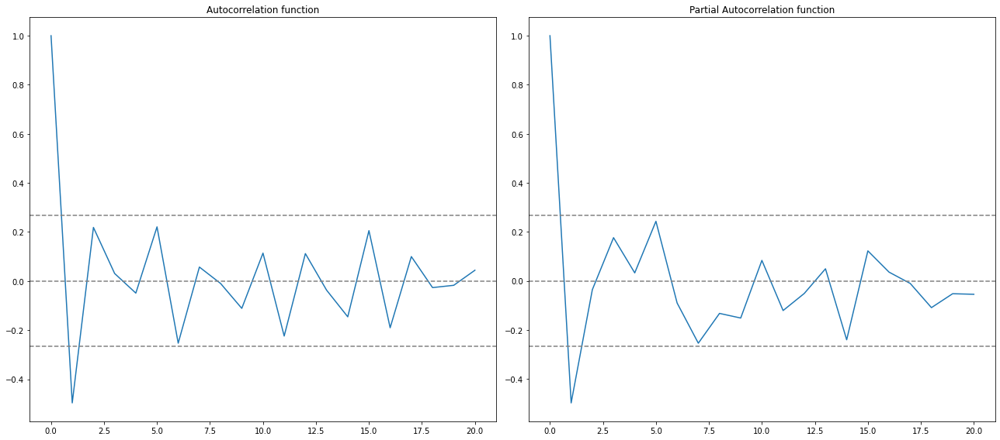

In [271]:
#Plot ACF
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0, linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_diff)), linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_log_diff)), linestyle='--',color='gray')
plt.title('Autocorrelation function')

#Plot PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y = -1.96/np.sqrt(len(ts_log_diff)), linestyle='--', color='gray')
plt.axhline( y =1.96/np.sqrt(len(ts_log_diff)), linestyle='--', color='gray')
plt.title('Partial Autocorrelation function')
plt.tight_layout()

In [0]:
# #In this plot, the two dotted lines on either sides of 0 are the confidence interevals. These can be used to determine the ‘p’ and ‘q’ values as:

# p – The lag value where the PACF chart crosses the upper confidence interval for the first time. If you notice closely, in this case p=2.
# q – The lag value where the ACF chart crosses the upper confidence interval for the first time. If you notice closely, in this case q=2. 


# from the above plot , p and q values can be inferred as 1

### ARIMA model

In [0]:
from statsmodels.tsa.arima_model import ARIMA

#### AR Model

Text(0.5, 1.0, 'RSS: 0.8639164435169286')

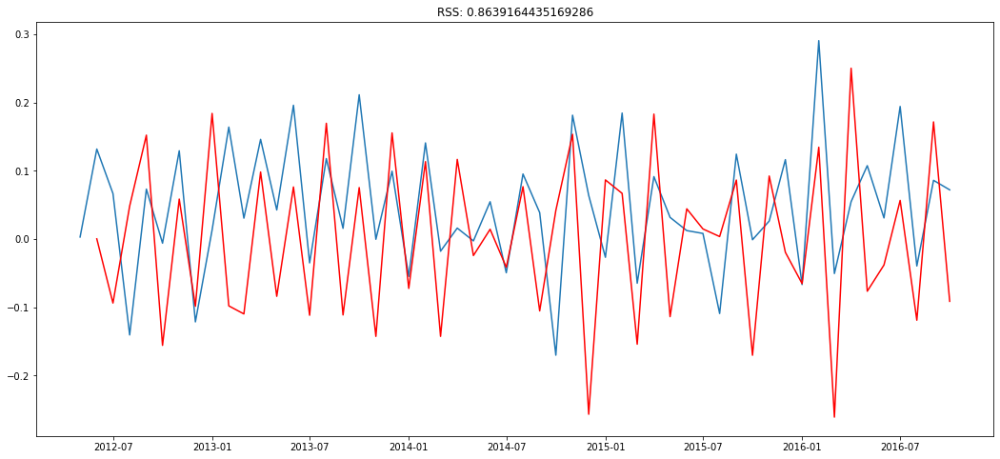

In [274]:
model = ARIMA(ts_log_diff, order = (1,1,0))
results_AR = model.fit(disp = 0)
plt.plot(ts_log_diff)
plt.plot(results_AR.fittedvalues , color ='red')
title = (results_AR.fittedvalues - ts_log_diff)
title.dropna(inplace=True, axis=0)
plt.title('RSS: {}'.format(sum((title)** 2)))

#### MA Model

Text(0.5, 1.0, 'RSS : 0.5958665526641226')

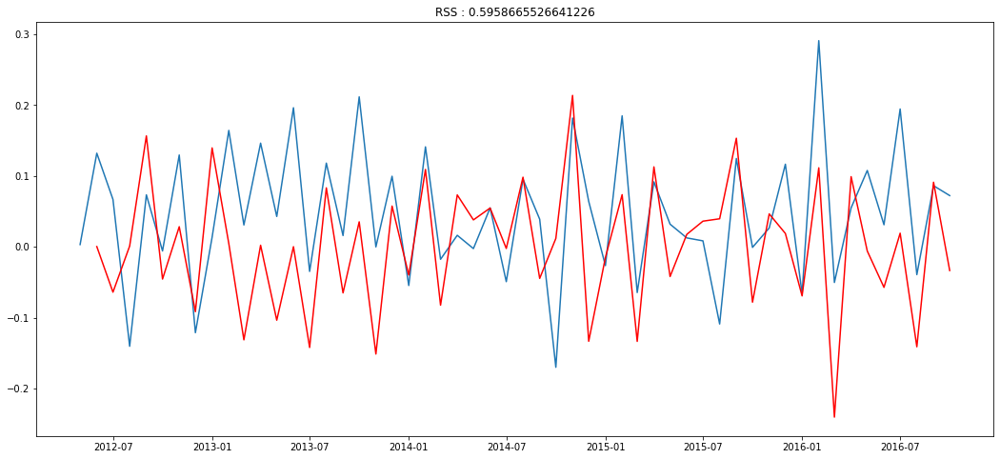

In [275]:
model = ARIMA(ts_log_diff, order= (0,1,1))
try:
  results_MA = model.fit(disp = 0)
except:
  pass
plt.plot(ts_log_diff)
plt.plot(results_MA.fittedvalues, color='red')
title = (results_MA.fittedvalues - ts_log_diff)
title.dropna(inplace=True, axis=0)

plt.title('RSS : {}'.format(sum(title ** 2)))

#### Combined Model

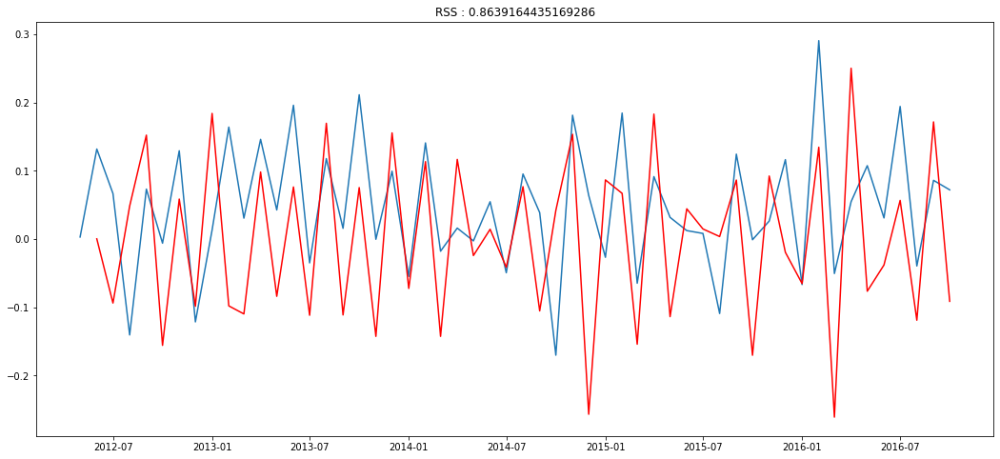

                             ARIMA Model Results                              
Dep. Variable:          D.Total Value   No. Observations:                   53
Model:                 ARIMA(1, 1, 0)   Log Likelihood                  41.383
Method:                       css-mle   S.D. of innovations              0.110
Date:                Sat, 23 May 2020   AIC                            -76.766
Time:                        16:18:50   BIC                            -70.855
Sample:                    06-01-2012   HQIC                           -74.493
                         - 10-01-2016                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0004      0.009      0.045      0.964      -0.017       0.018
ar.L1.D.Total Value    -0.7318      0.090     -8.120      0.000      -0.908      -0.555
                

In [276]:
model = ARIMA(ts_log_diff, order = (1,1,0))
try:
  results_ARIMA = model.fit(disp = 0)
except:
  pass
plt.plot(ts_log_diff)
plt.plot(results_ARIMA.fittedvalues, color = 'red')
title = (results_ARIMA.fittedvalues - ts_log_diff)
title.dropna(inplace=True, axis=0)

plt.title('RSS : {}'.format(sum(title ** 2)))
plt.show()
print(results_ARIMA.summary())

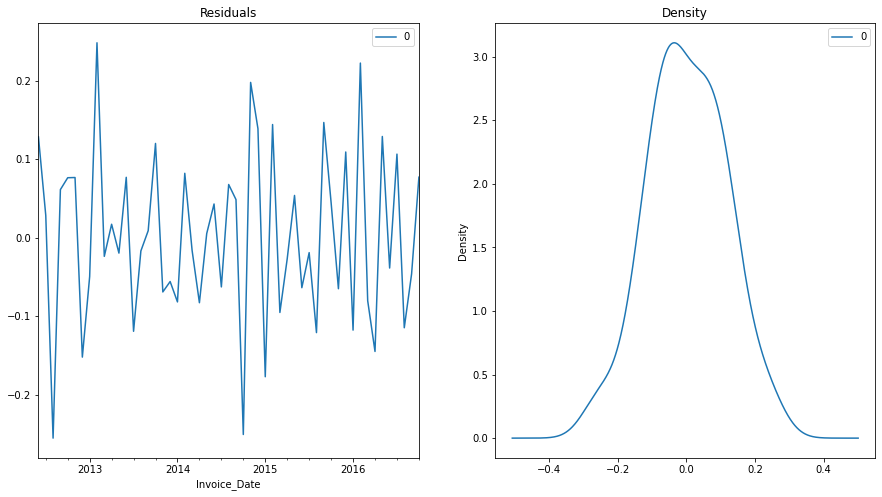

In [277]:
# plot residual error
residual = pd.DataFrame(results_ARIMA.resid)
fig, ax = plt.subplots(1,2, figsize=(15,8))
residual.plot(title = 'Residuals', ax = ax[0])
residual.plot(kind='kde', title='Density', ax = ax[1])
plt.show()

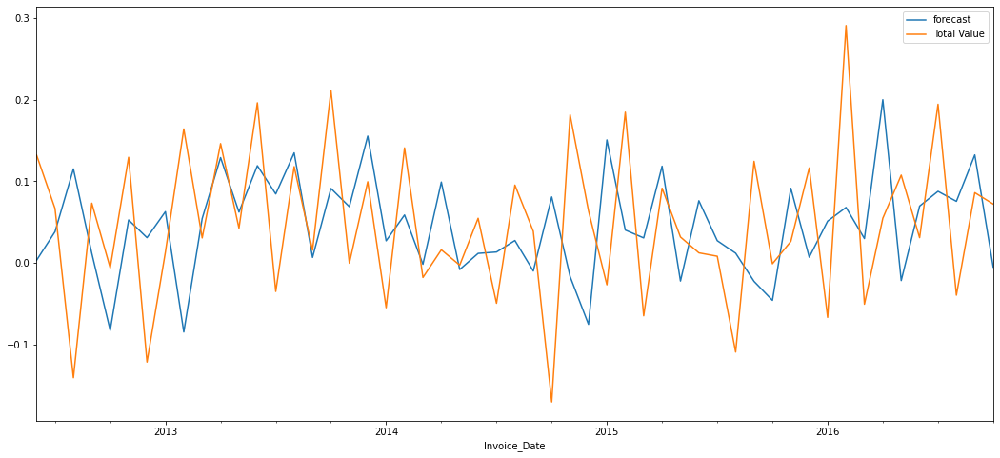

In [278]:
# plot actual vs predicted
results_ARIMA.plot_predict(dynamic=False)
plt.show()

#### Taking back to original scale

In [279]:
predictions_ARIMA_diff = pd.Series(results_ARIMA.fittedvalues, copy = True)
predictions_ARIMA_diff.head()
#Notice that these start from ‘1949-02-01’ and not the first month. Why? 
#This is because we took a lag by 1 and first element doesn’t have anything before it to subtract from. 

Invoice_Date
2012-06-01    0.000394
2012-07-01   -0.093666
2012-08-01    0.048418
2012-09-01    0.152328
2012-10-01   -0.155713
Freq: MS, dtype: float64

In [280]:
#The way to convert the differencing to log scale is to add these differences consecutively to the base number. 
#An easy way to do it is to first determine the cumulative sum at index and then add it to the base number.  
#cumulative sum can be found as 
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
predictions_ARIMA_diff_cumsum.head()

Invoice_Date
2012-06-01    0.000394
2012-07-01   -0.093272
2012-08-01   -0.044854
2012-09-01    0.107474
2012-10-01   -0.048239
Freq: MS, dtype: float64

In [281]:
#Next we’ve to add them to base number. 
#For this lets create a series with all values as base number and add the differences to it.
predictions_ARIMA_log = pd.Series(ts_log.values, index = ts_log.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value=0)
predictions_ARIMA_log.head()

Invoice_Date
2012-04-01    12.646117
2012-05-01    12.649174
2012-06-01    12.781547
2012-07-01    12.754630
2012-08-01    12.662577
Freq: MS, dtype: float64

In [0]:
predictions_ARIMA = np.exp(predictions_ARIMA_log)

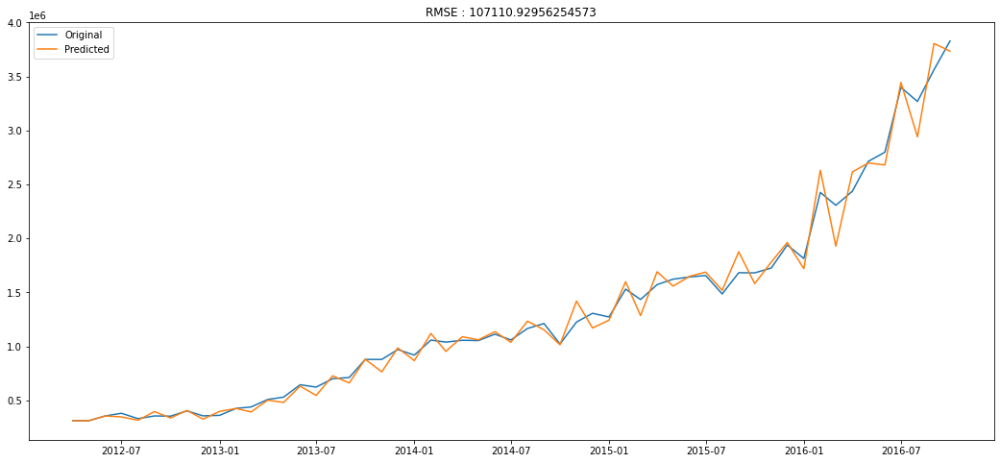

In [283]:
# take the exponent and compare with the original series
predictions_ARIMA = np.exp(predictions_ARIMA_log)
rmse = np.sqrt(sum((predictions_ARIMA - ts_date_y)**2)/len(ts_date_y))
plt.plot(ts_date_y, label='Original')
plt.plot(predictions_ARIMA, label='Predicted')
plt.title('RMSE : {}'.format(rmse))
plt.legend()

### Lets Forecast

In [284]:
!pip install pmdarima

     |████████████████████████████████| 1.5MB 5.0MB/s 
     |████████████████████████████████| 2.1MB 33.7MB/s 
     |████████████████████████████████| 8.7MB 40.7MB/s 
  Found existing installation: Cython 0.29.18
    Uninstalling Cython-0.29.18:
      Successfully uninstalled Cython-0.29.18
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [0]:
import pmdarima as pm

In [286]:
df = ts_date_y

model = pm.auto_arima(df.values, start_p = 0, start_q = 0,
                      test = 'adf',
                      max_p = 2, max_q = 2,
                      m = 1,
                      d = None,
                      seasonal = False,
                      start_P =0,
                      D = 0,
                      trace = True,
                      error_action = 'ignore',
                      supress_warning = True,
                      stepwise = True
                      )

print(model.summary())

Performing stepwise search to minimize aic
Fit ARIMA(0,2,0)x(0,0,0,0) [intercept=True]; AIC=1471.973, BIC=1475.913, Time=0.020 seconds
Fit ARIMA(1,2,0)x(0,0,0,0) [intercept=True]; AIC=1428.899, BIC=1434.809, Time=0.026 seconds
Fit ARIMA(0,2,1)x(0,0,0,0) [intercept=True]; AIC=1435.699, BIC=1441.609, Time=0.024 seconds
Fit ARIMA(0,2,0)x(0,0,0,0) [intercept=False]; AIC=1470.031, BIC=1472.001, Time=0.009 seconds
Fit ARIMA(2,2,0)x(0,0,0,0) [intercept=True]; AIC=1401.090, BIC=1408.971, Time=0.037 seconds
Fit ARIMA(2,2,1)x(0,0,0,0) [intercept=True]; AIC=1402.259, BIC=1412.110, Time=0.081 seconds
Fit ARIMA(1,2,1)x(0,0,0,0) [intercept=True]; AIC=1410.644, BIC=1418.525, Time=0.037 seconds
Total fit time: 0.261 seconds
                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                   55
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -696.545
Date:                Sat, 23 May 2020   AIC  

#### Interpret the results

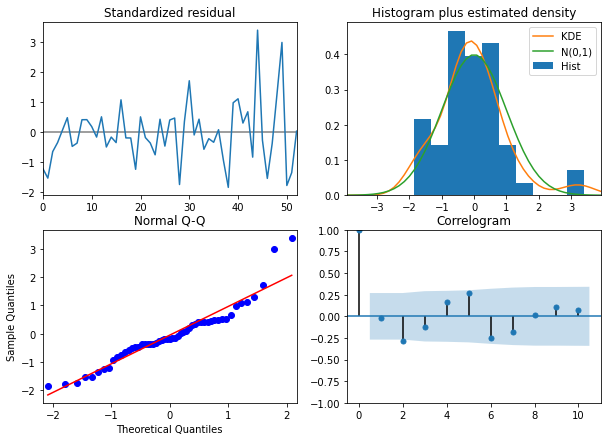

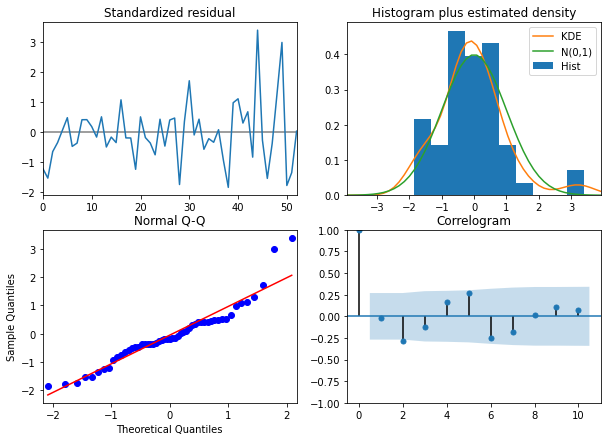

In [287]:
model.plot_diagnostics(figsize=(10,7))

####forecast

In [0]:
#forecast
n_periods = 6
fc , confident = model.predict(n_periods = n_periods, return_conf_int = True)
index_of_fc = np.arange(len(df.values),len(df.values) + n_periods)

# make series for plotting purpose
fc_series = pd.Series(fc, index= index_of_fc)
lower_series = pd.Series(confident[:,0],index = index_of_fc)
upper_series = pd.Series(confident[:,1], index = index_of_fc)

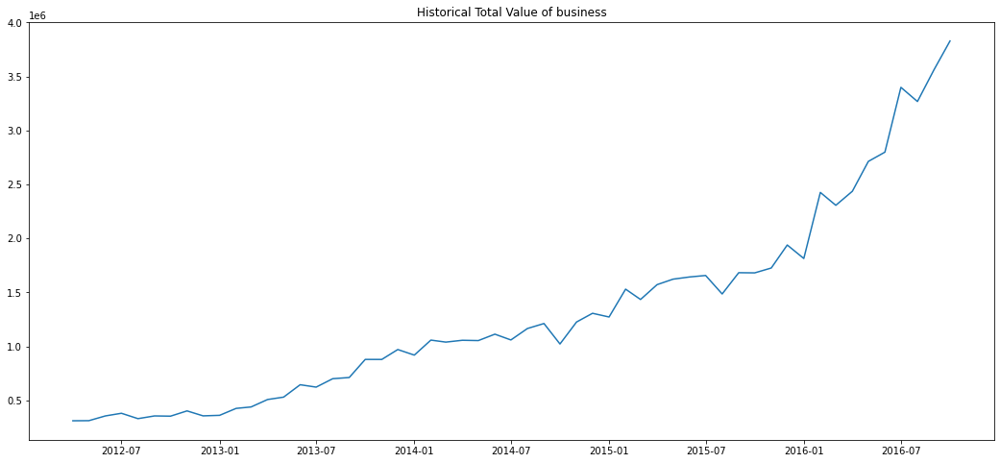

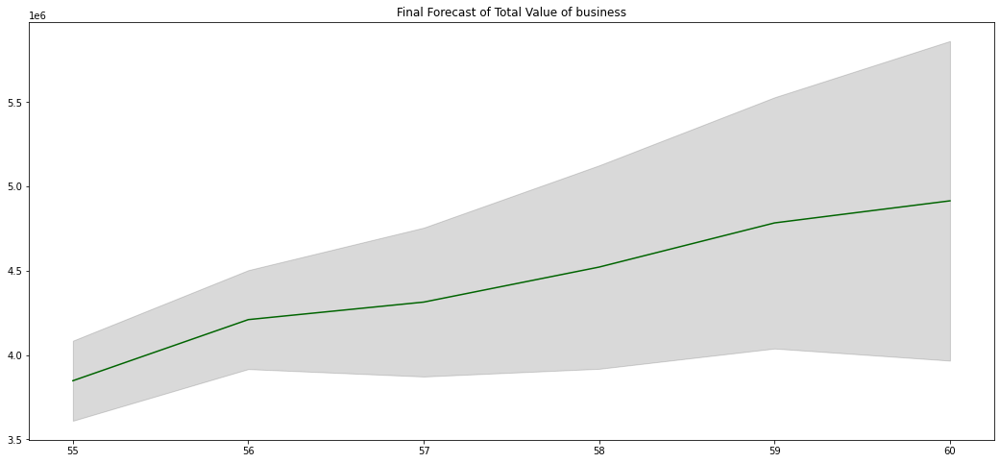

In [289]:
# plot
plt.plot(df)
plt.title('Historical Total Value of business')
plt.show()

plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, lower_series , upper_series , color ='k', alpha = 0.15)

plt.title('Final Forecast of Total Value of business')
plt.show()